# Simplified Workflow Ver3

./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S008\S008R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb

104
104
(83, 64, 9760)
(76, 64, 9760)
eyes open


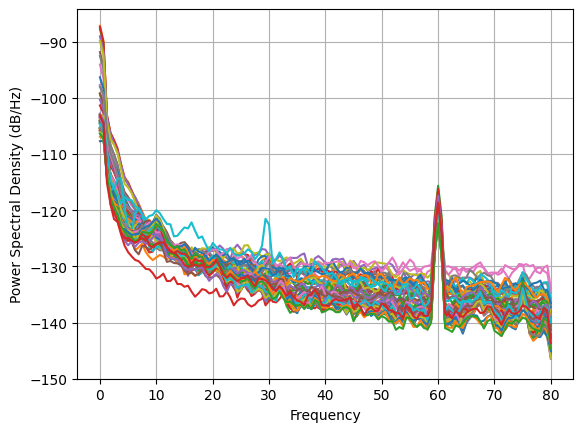

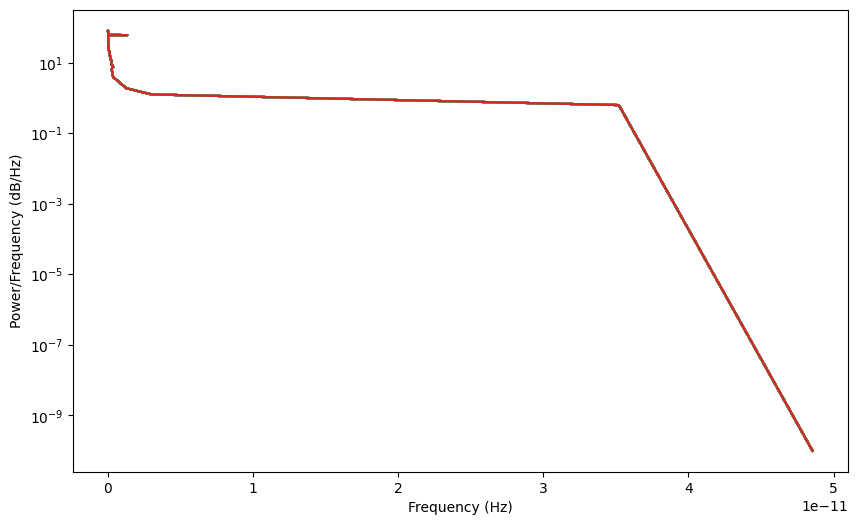

eyes closed


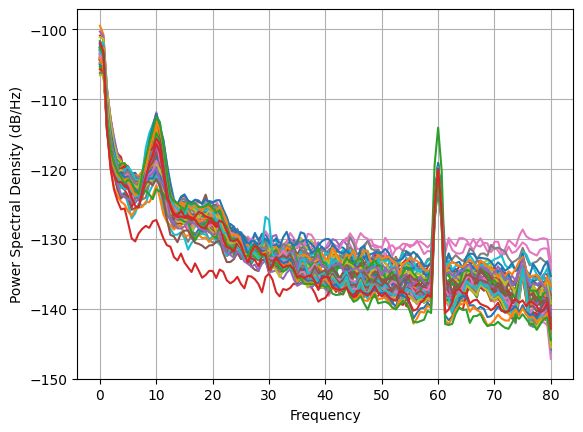

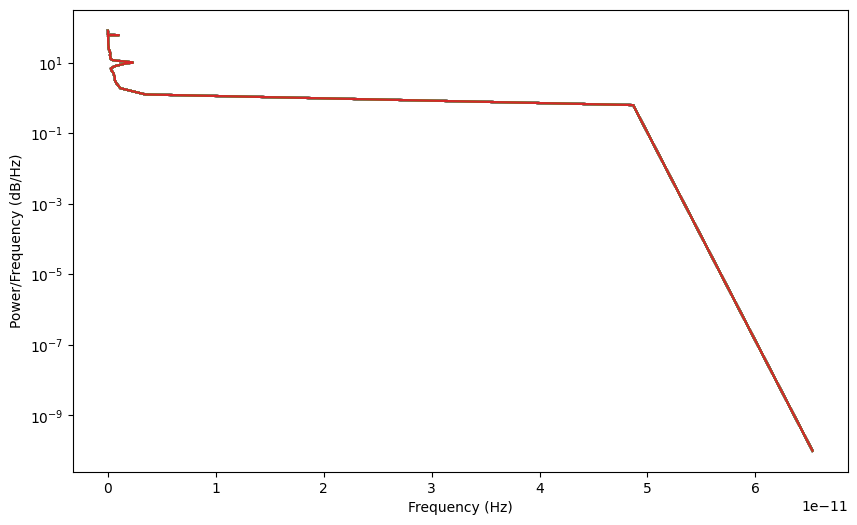

In [1]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
from Data import download_EEGBCI

main_folder = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0'
subdirectories = [f.path for f in os.scandir(main_folder) if f.is_dir()]

opened_files = []
closed_files = []

i = 0
for subdirectory in subdirectories:
    files = os.listdir(subdirectory)
    
    if len(files) > 0 and i not in [13, 50, 68, 96, 108]: # 13, 50, 68, 96, 108 idx does not have 9760 seq len
        for file in files:
            
            if file[-6:] == '01.edf':
                # This is data for eyes opened
                eyes_opened = os.path.join(subdirectory, file)
                print(eyes_opened)
                opened_files.append(eyes_opened)

            if file[-6:] == '02.edf':
                # This is data for eyes closed
                eyes_closed = os.path.join(subdirectory, file)
                print(eyes_closed)
                closed_files.append(eyes_closed)
    else:
        print(f"No files found in {subdirectory}")
    
    i += 1
    
large_open_data = []    # This is a list of all the data for eyes opened
large_closed_data = []  # This is a list of all the data for eyes closed

for data in opened_files:
    value_open = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_open) == 64):
        large_open_data.append(value_open)

for data in closed_files:
    value_closed = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_closed) == 64):
        large_closed_data.append(value_closed)

print(large_open_data.__len__())   # This is the number of files for eyes opened
print(large_closed_data.__len__()) # This is the number of files for eyes closed



open_data = []
closed_data = []

for i in range(len(large_open_data)):
    if i not in [1,4,6,13,22,29,31,33,36,43,50,53,60,63,86,87,88,94,95,100,102]: # data that looks sussy
        open_data.append(large_open_data[i])

for i in range(len(large_closed_data)):
    if i not in [1,4,5,6,12,13,15,17,19,22,29,31,33,34.47,50,51,58,60,71,76,77,79,81,86,87,88,90,95,100]: # data that looks sussy
        closed_data.append(large_closed_data[i])   
        
training_data_open = np.array(open_data)
training_data_closed = np.array(closed_data)
print(np.shape(training_data_open))
print(np.shape(training_data_closed))



# Load the raw EEG data
edf_file = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R01.edf'
raw = mne.io.read_raw_edf(edf_file, preload=True, verbose=False)


def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=nperseg, noverlap=noverlap)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd


# Get the EEG data using .get_data()
eeg_data = raw.get_data()
#eeg_data = large_closed_data[0]

# Set the sampling frequency
fs = raw.info['sfreq']

def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)



## open data
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()



## closed data
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()




NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def plot_everything(generated_data, gen_err, critic_err):
    generated_data = generated_data.detach()
    
    # plotting generated data
    values = generated_data[0, 0, :]
    plt.plot(values.tolist())
    plt.show()

    # plotting PSD
    averaged_data = average_across_arrays(generated_data)
    freqs, psd = compute_psd(averaged_data, fs)
    plt.figure(figsize=(10, 6))  # Add this line to create a single figure
    for ch_idx in range(eeg_data.shape[0]):
        plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.show()

    # plotting G vs D losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_err,label="Generator")
    plt.plot(critic_err,label="Critic")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# Zero grad weights after optimizer
### not horrible

Epoch 0: Critic error ([0.062287524982147124]) Generator err ([0.1923539936542511])


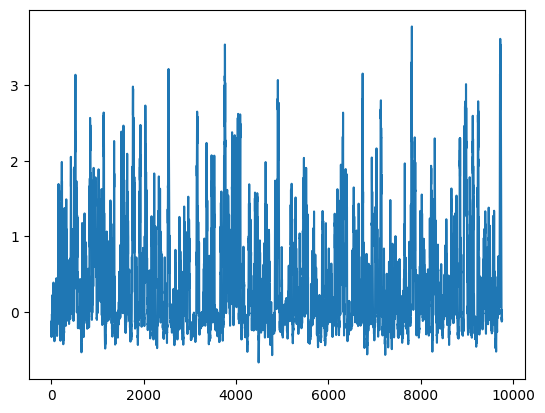

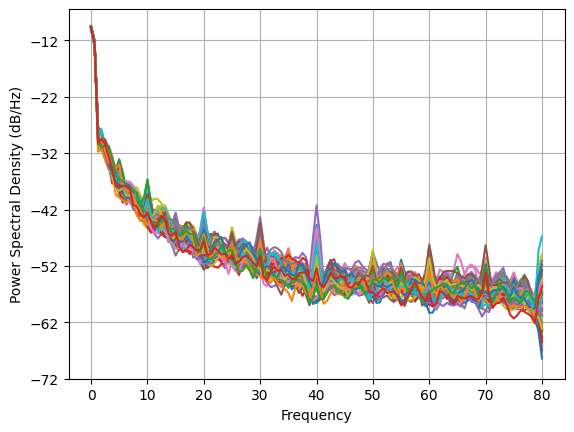

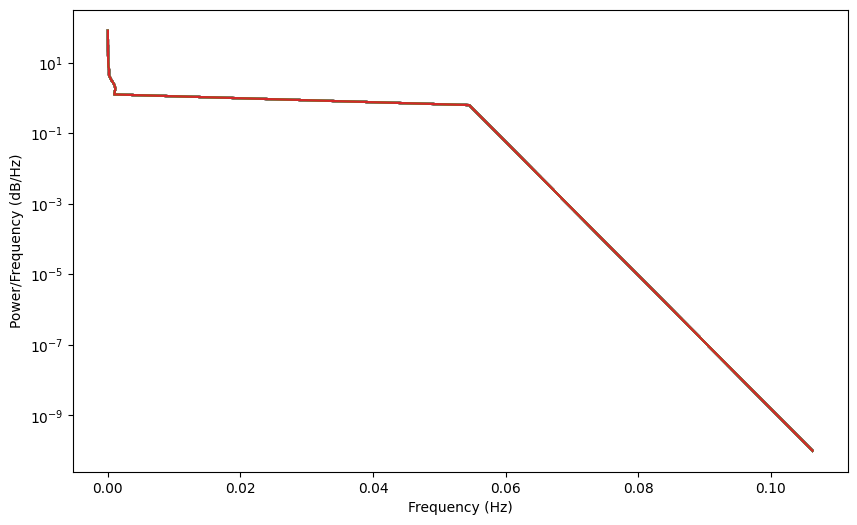

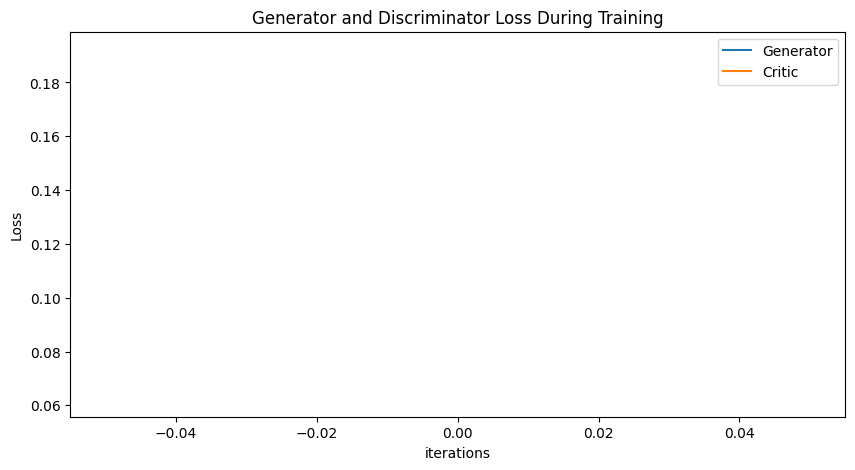

Epoch 50: Critic error ([0.062287524982147124, 0.2596581656123268, -0.03701407879091062, -0.0549381944068304, -0.012448222400714581, -0.05199433073225723, 0.17434766363231136, 0.14615207892068738, 0.04918334011875847, 0.19017042140168555, 0.11282756245317432, 0.244000490423107, 0.14766733399553544, 0.1719289115238482, 0.3116861547681504, 0.15485401562007578, 0.16007218328064876, 0.28300479977887394, 0.3184590507096247, 0.24478331160031452, 0.08091715762616045, 0.28064989804244084, 0.09721974103814249, 0.17209070601031, 0.13013916674341836, 0.11036590722116318, 0.11844826808796793, 0.03509958590416523, 0.18361997194498203, -0.04948984767836542, -0.03982537122619932, -0.08859342434310341, -0.07791498947613343, -0.09928361678725803, -0.11798843653971537, -0.12688917946152936, -0.15852923137718072, -0.1921884775170369, -0.27522887474307495, -0.29357972642025765, -0.3910007971668823, -0.4732689605686987, -0.6030865448904128, -0.7231897424762498, -0.8977799895656533, -0.9646084947896523, -1.

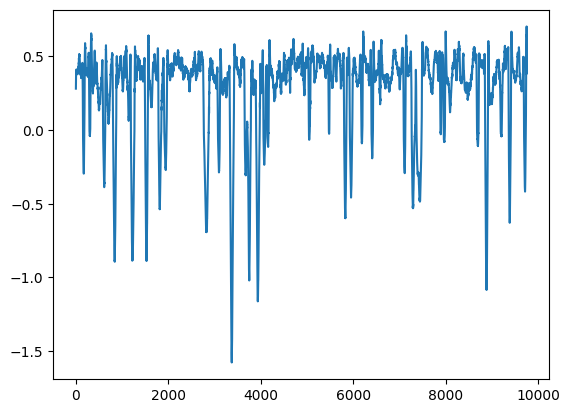

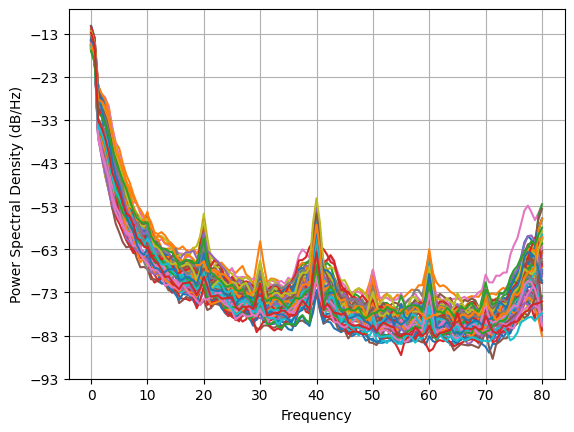

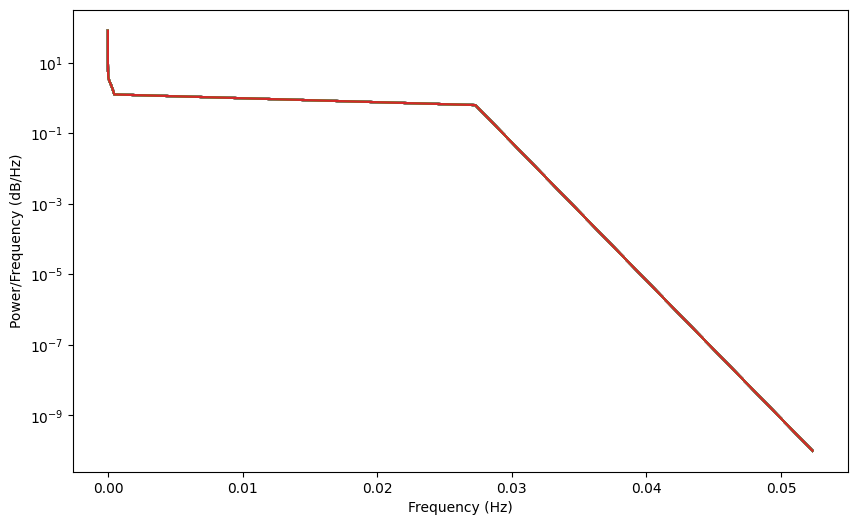

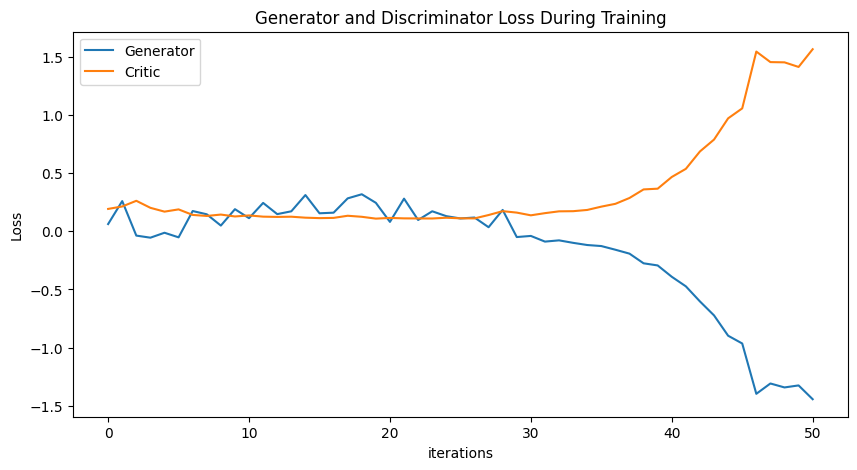

Epoch 100: Critic error ([0.062287524982147124, 0.2596581656123268, -0.03701407879091062, -0.0549381944068304, -0.012448222400714581, -0.05199433073225723, 0.17434766363231136, 0.14615207892068738, 0.04918334011875847, 0.19017042140168555, 0.11282756245317432, 0.244000490423107, 0.14766733399553544, 0.1719289115238482, 0.3116861547681504, 0.15485401562007578, 0.16007218328064876, 0.28300479977887394, 0.3184590507096247, 0.24478331160031452, 0.08091715762616045, 0.28064989804244084, 0.09721974103814249, 0.17209070601031, 0.13013916674341836, 0.11036590722116318, 0.11844826808796793, 0.03509958590416523, 0.18361997194498203, -0.04948984767836542, -0.03982537122619932, -0.08859342434310341, -0.07791498947613343, -0.09928361678725803, -0.11798843653971537, -0.12688917946152936, -0.15852923137718072, -0.1921884775170369, -0.27522887474307495, -0.29357972642025765, -0.3910007971668823, -0.4732689605686987, -0.6030865448904128, -0.7231897424762498, -0.8977799895656533, -0.9646084947896523, -1

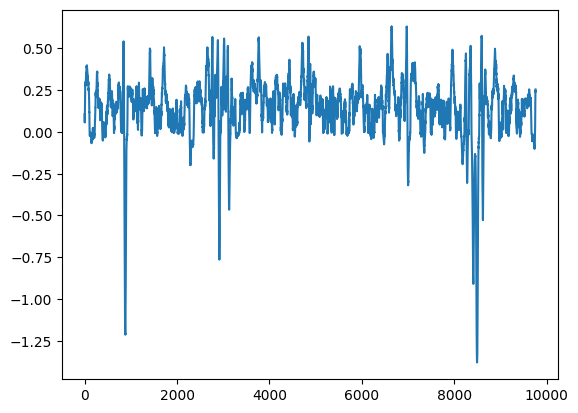

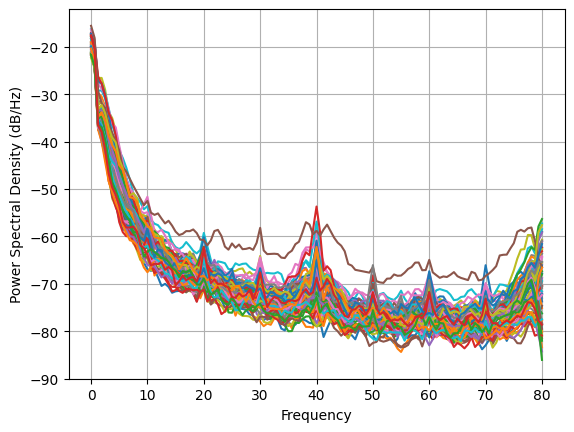

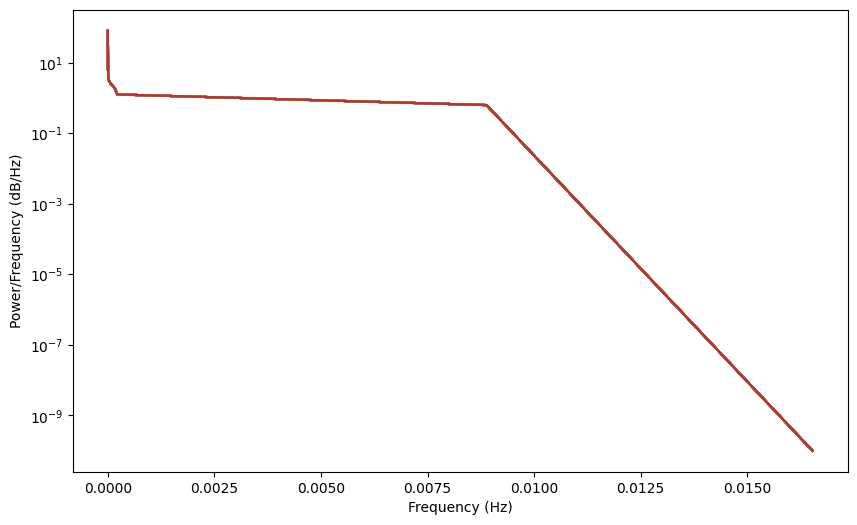

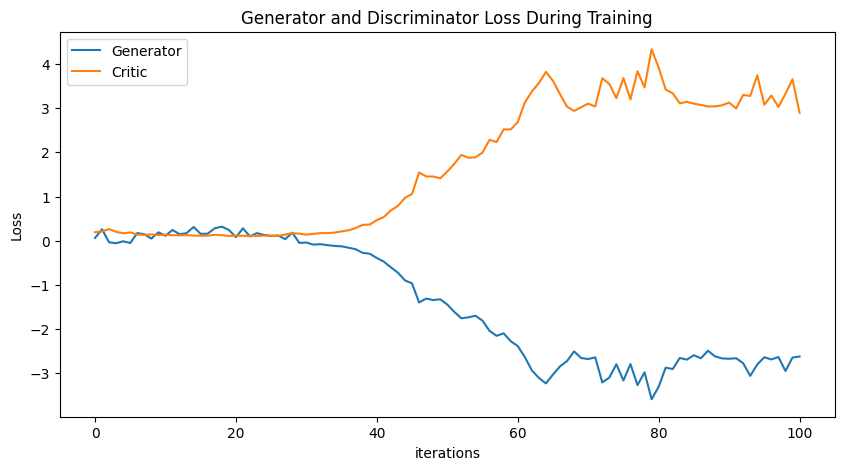

Epoch 150: Critic error ([0.062287524982147124, 0.2596581656123268, -0.03701407879091062, -0.0549381944068304, -0.012448222400714581, -0.05199433073225723, 0.17434766363231136, 0.14615207892068738, 0.04918334011875847, 0.19017042140168555, 0.11282756245317432, 0.244000490423107, 0.14766733399553544, 0.1719289115238482, 0.3116861547681504, 0.15485401562007578, 0.16007218328064876, 0.28300479977887394, 0.3184590507096247, 0.24478331160031452, 0.08091715762616045, 0.28064989804244084, 0.09721974103814249, 0.17209070601031, 0.13013916674341836, 0.11036590722116318, 0.11844826808796793, 0.03509958590416523, 0.18361997194498203, -0.04948984767836542, -0.03982537122619932, -0.08859342434310341, -0.07791498947613343, -0.09928361678725803, -0.11798843653971537, -0.12688917946152936, -0.15852923137718072, -0.1921884775170369, -0.27522887474307495, -0.29357972642025765, -0.3910007971668823, -0.4732689605686987, -0.6030865448904128, -0.7231897424762498, -0.8977799895656533, -0.9646084947896523, -1

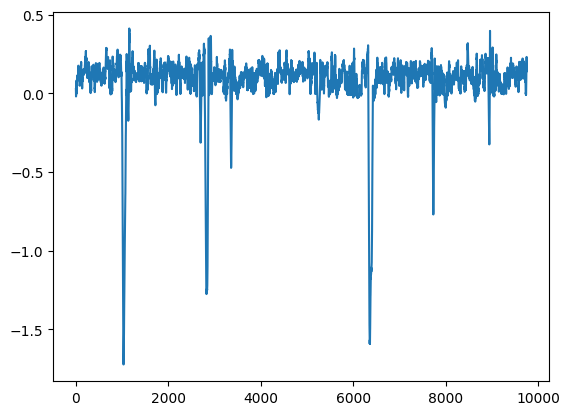

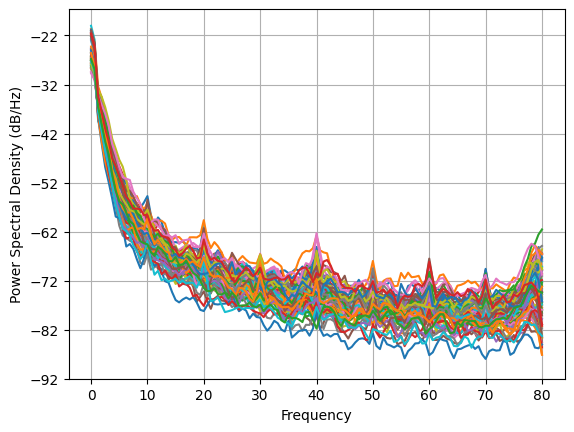

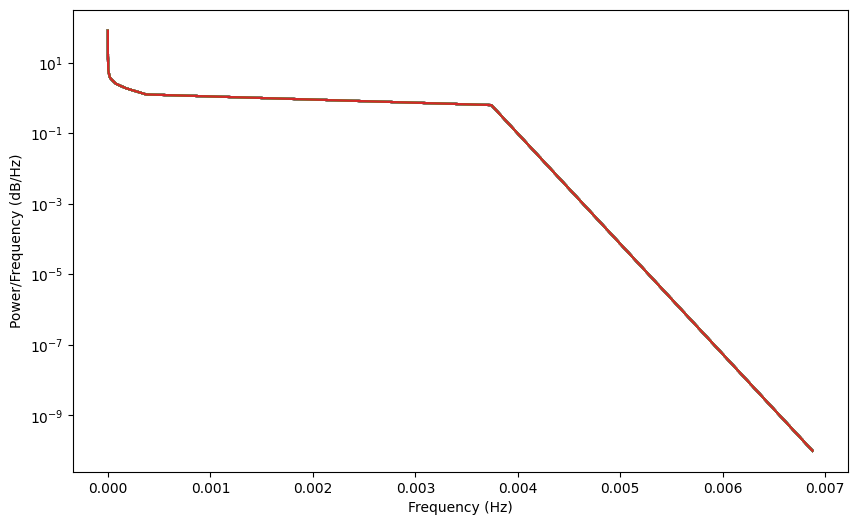

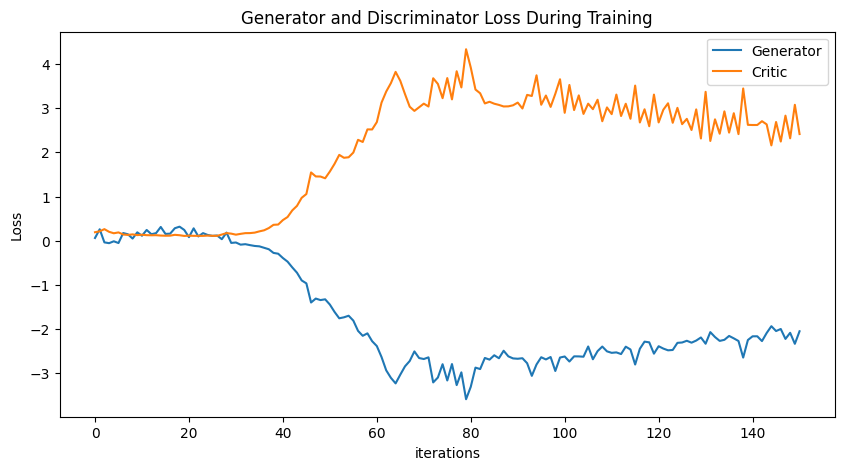

Epoch 200: Critic error ([0.062287524982147124, 0.2596581656123268, -0.03701407879091062, -0.0549381944068304, -0.012448222400714581, -0.05199433073225723, 0.17434766363231136, 0.14615207892068738, 0.04918334011875847, 0.19017042140168555, 0.11282756245317432, 0.244000490423107, 0.14766733399553544, 0.1719289115238482, 0.3116861547681504, 0.15485401562007578, 0.16007218328064876, 0.28300479977887394, 0.3184590507096247, 0.24478331160031452, 0.08091715762616045, 0.28064989804244084, 0.09721974103814249, 0.17209070601031, 0.13013916674341836, 0.11036590722116318, 0.11844826808796793, 0.03509958590416523, 0.18361997194498203, -0.04948984767836542, -0.03982537122619932, -0.08859342434310341, -0.07791498947613343, -0.09928361678725803, -0.11798843653971537, -0.12688917946152936, -0.15852923137718072, -0.1921884775170369, -0.27522887474307495, -0.29357972642025765, -0.3910007971668823, -0.4732689605686987, -0.6030865448904128, -0.7231897424762498, -0.8977799895656533, -0.9646084947896523, -1

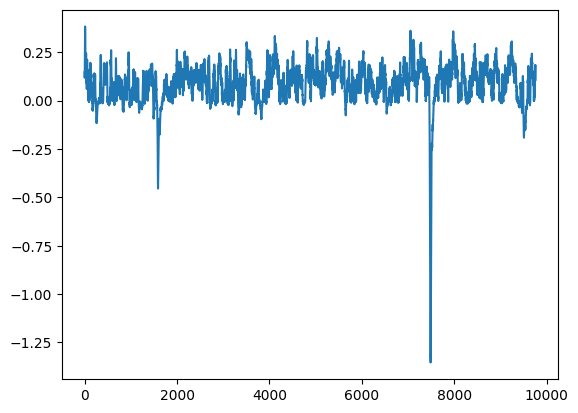

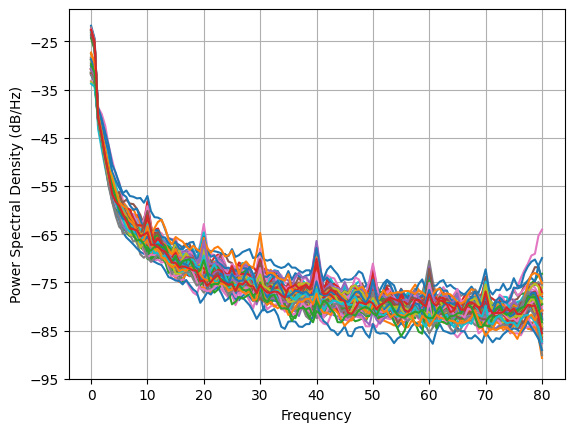

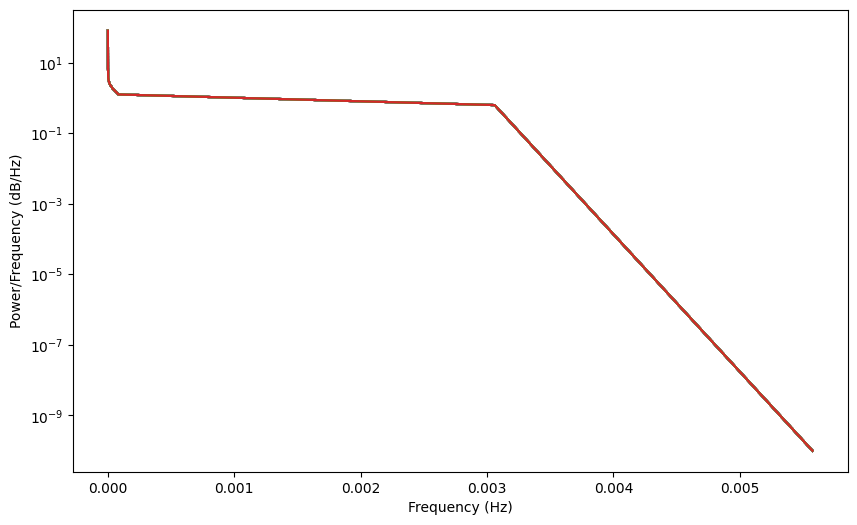

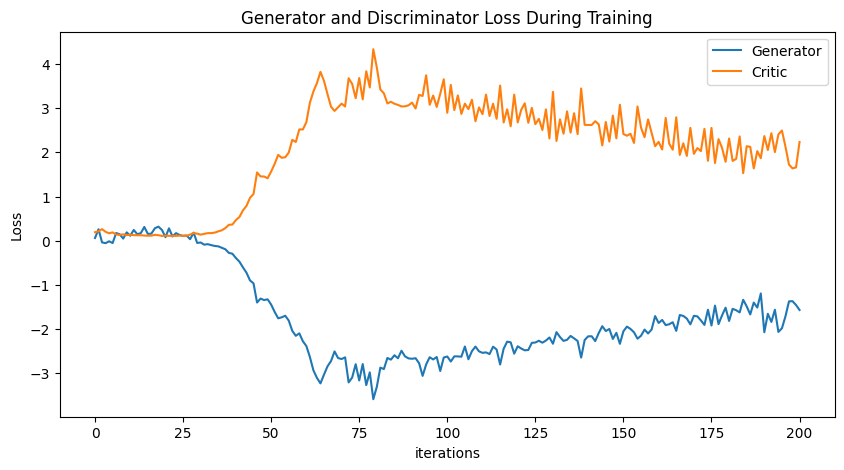

Epoch 250: Critic error ([0.062287524982147124, 0.2596581656123268, -0.03701407879091062, -0.0549381944068304, -0.012448222400714581, -0.05199433073225723, 0.17434766363231136, 0.14615207892068738, 0.04918334011875847, 0.19017042140168555, 0.11282756245317432, 0.244000490423107, 0.14766733399553544, 0.1719289115238482, 0.3116861547681504, 0.15485401562007578, 0.16007218328064876, 0.28300479977887394, 0.3184590507096247, 0.24478331160031452, 0.08091715762616045, 0.28064989804244084, 0.09721974103814249, 0.17209070601031, 0.13013916674341836, 0.11036590722116318, 0.11844826808796793, 0.03509958590416523, 0.18361997194498203, -0.04948984767836542, -0.03982537122619932, -0.08859342434310341, -0.07791498947613343, -0.09928361678725803, -0.11798843653971537, -0.12688917946152936, -0.15852923137718072, -0.1921884775170369, -0.27522887474307495, -0.29357972642025765, -0.3910007971668823, -0.4732689605686987, -0.6030865448904128, -0.7231897424762498, -0.8977799895656533, -0.9646084947896523, -1

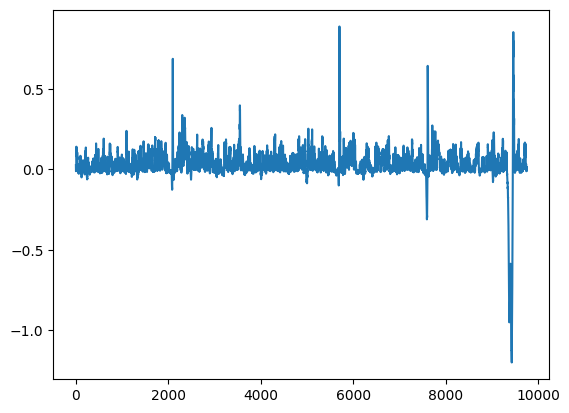

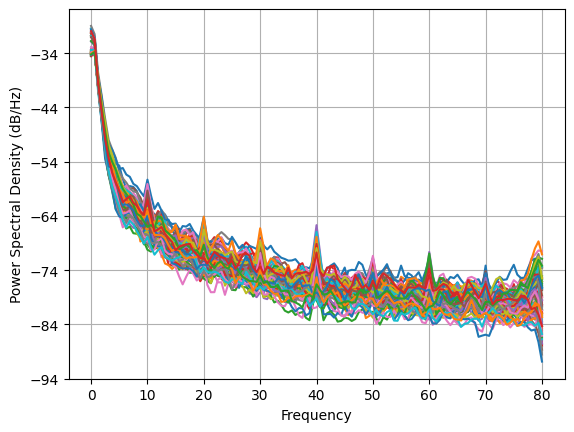

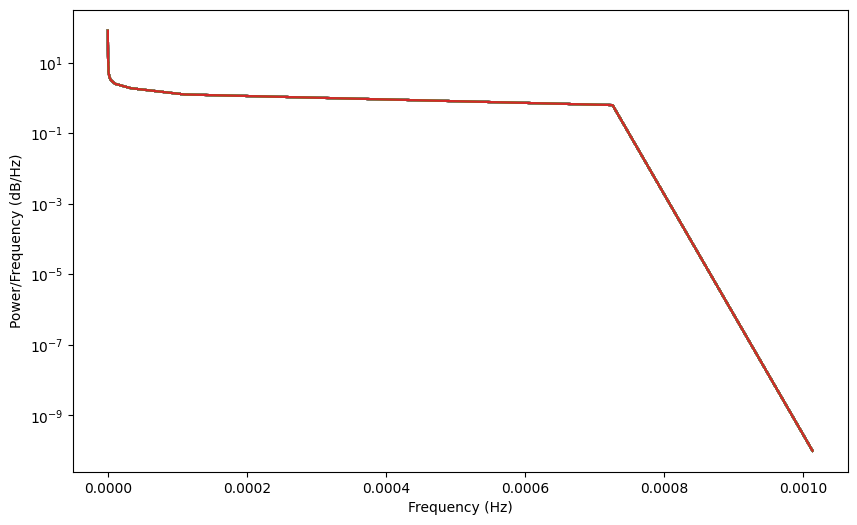

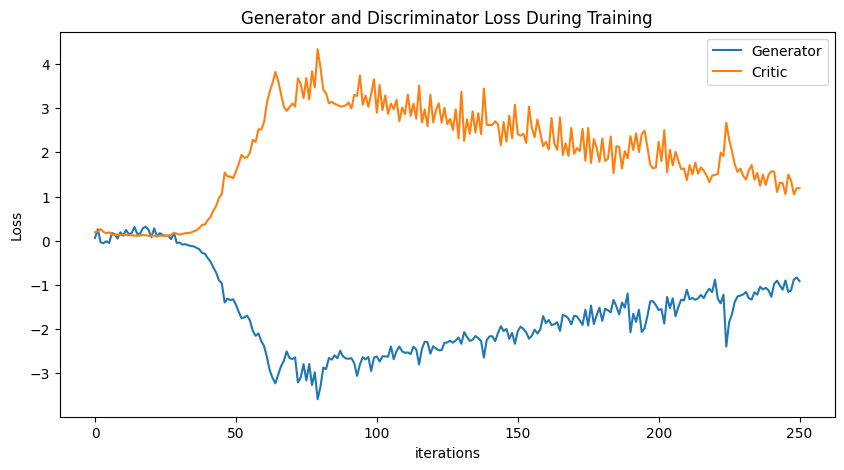

Epoch 300: Critic error ([0.062287524982147124, 0.2596581656123268, -0.03701407879091062, -0.0549381944068304, -0.012448222400714581, -0.05199433073225723, 0.17434766363231136, 0.14615207892068738, 0.04918334011875847, 0.19017042140168555, 0.11282756245317432, 0.244000490423107, 0.14766733399553544, 0.1719289115238482, 0.3116861547681504, 0.15485401562007578, 0.16007218328064876, 0.28300479977887394, 0.3184590507096247, 0.24478331160031452, 0.08091715762616045, 0.28064989804244084, 0.09721974103814249, 0.17209070601031, 0.13013916674341836, 0.11036590722116318, 0.11844826808796793, 0.03509958590416523, 0.18361997194498203, -0.04948984767836542, -0.03982537122619932, -0.08859342434310341, -0.07791498947613343, -0.09928361678725803, -0.11798843653971537, -0.12688917946152936, -0.15852923137718072, -0.1921884775170369, -0.27522887474307495, -0.29357972642025765, -0.3910007971668823, -0.4732689605686987, -0.6030865448904128, -0.7231897424762498, -0.8977799895656533, -0.9646084947896523, -1

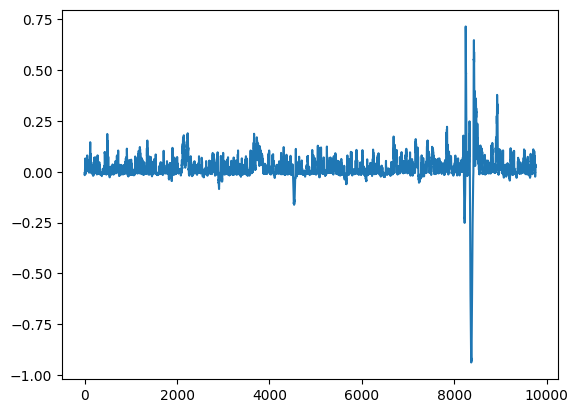

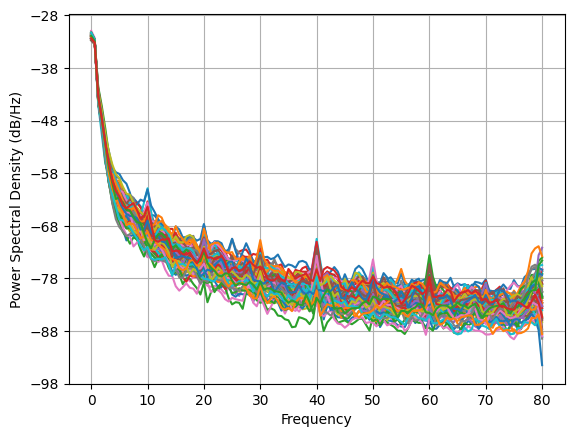

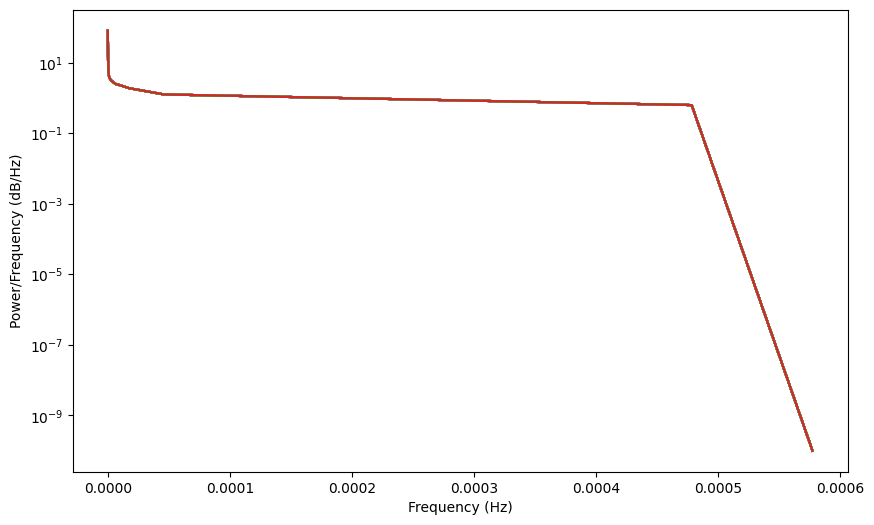

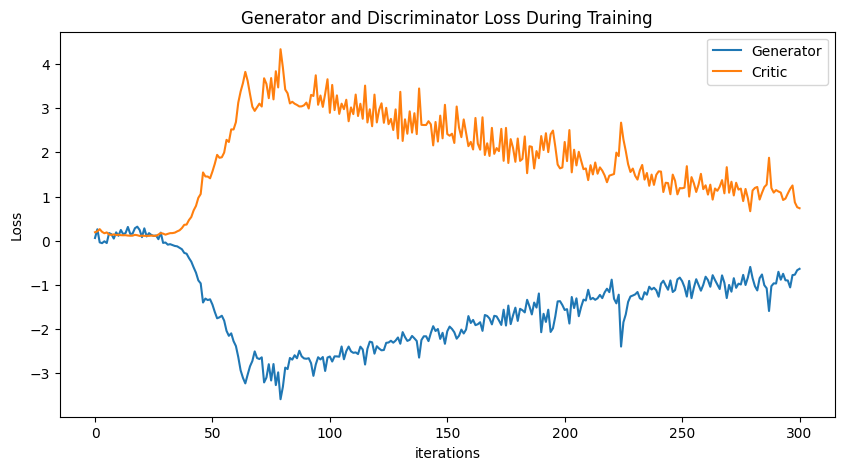

In [ ]:
NUM_EPOCHS = 500
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(training_data_open)[0]
training_data = torch.tensor(training_data_open)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            critic_optimizer.zero_grad()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_optimizer.zero_grad()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data, disc, gen = train()

torch.save(gen, 'genv3.pt')
torch.save(disc, 'discv3.pt')

plot_everything(generated_data, gen_err, critic_err)

# Zero grad weights before optimizer
### not horrible

Epoch 0: Critic error ([0.5903556905830057]) Generator err ([0.17459048330783844])


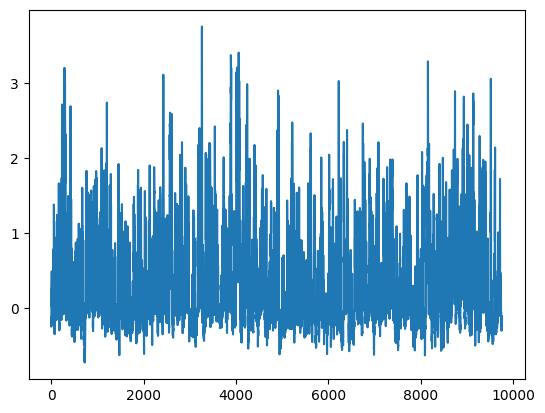

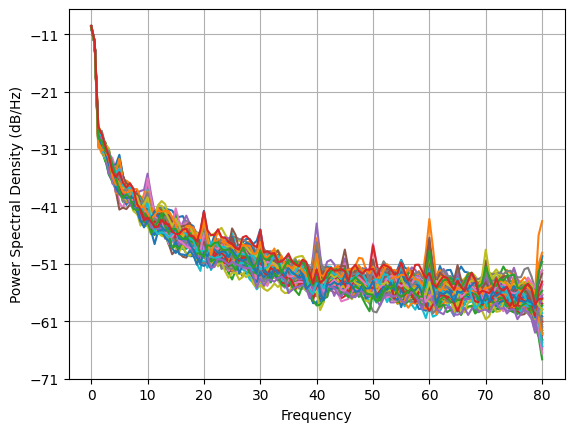

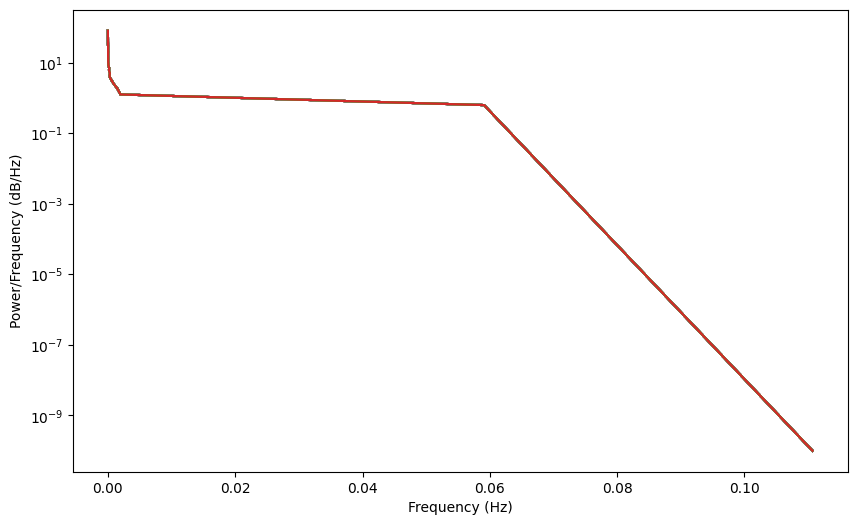

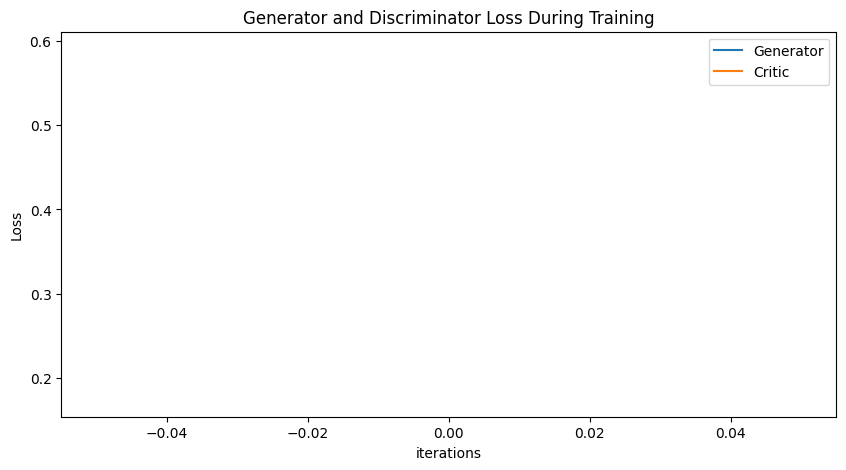

Epoch 50: Critic error ([0.5903556905830057, -0.2447297830022579, -0.3943767269762248, -0.5968595144059203, -0.898589295444865, -1.0499011220408307, -1.323507491625384, -1.781597156769635, -1.8309353743696268, -1.817724459803594, -1.9815589368017625, -2.073122088716329, -2.3378628630543563, -2.4951682657165186, -2.6931669117289054, -2.787946197429754, -3.8655083252298033, -3.529661746857147, -3.7871862235419007, -4.082133021262316, -4.065046281577907, -4.579756226238438, -4.465290553462321, -4.289004895690062, -4.709960840584443, -4.755629627763097, -4.368336102551938, -4.4399007393242105, -4.097231768826366, -4.265461814676435, -3.783619428034898, -3.6134223739320896, -3.679589737425238, -3.1640573950227067, -3.899324575709467, -3.6111627487979803, -3.827848677935476, -3.9433056000587388, -3.9850932149244365, -4.234611166297302, -4.052918939435522, -3.8640813427601737, -4.088583342543905, -3.822445298836427, -3.294168446310702, -3.2116073758696477, -3.1967190161962176, -3.038729580172

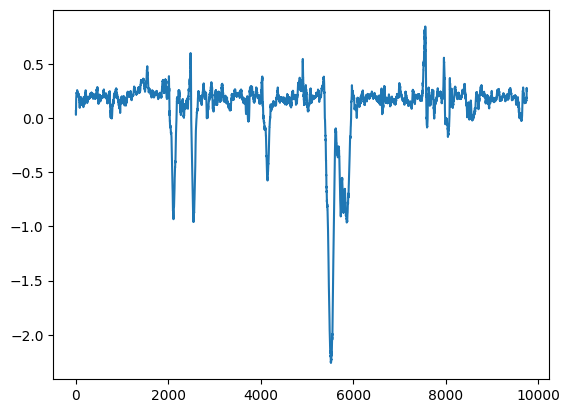

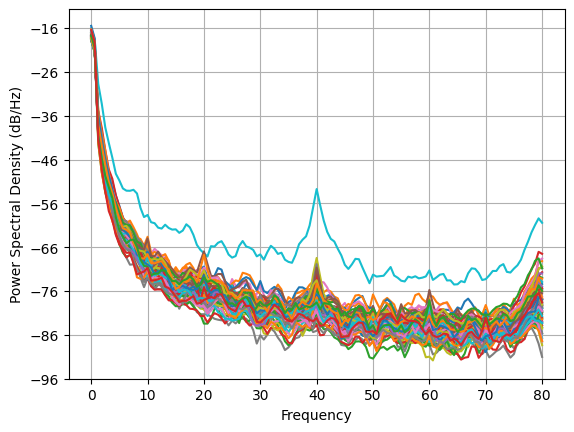

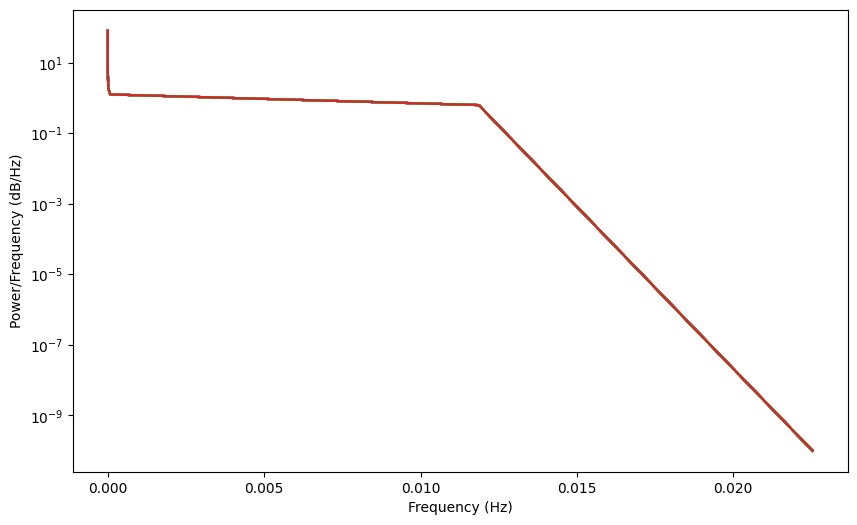

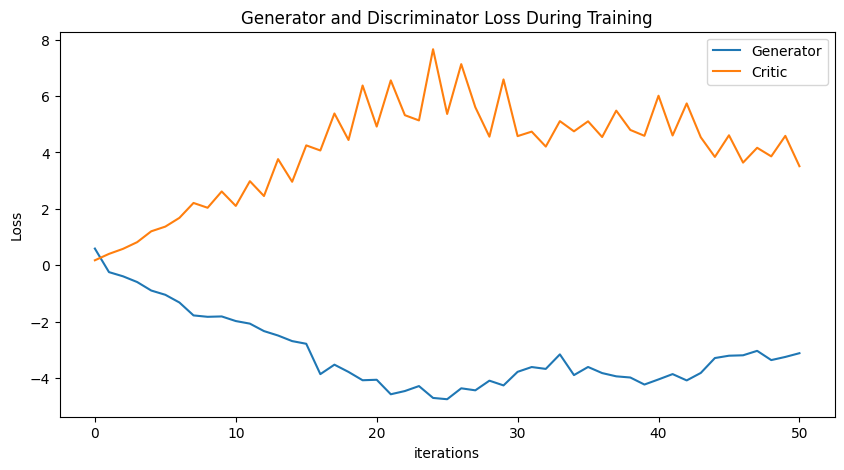

Epoch 100: Critic error ([0.5903556905830057, -0.2447297830022579, -0.3943767269762248, -0.5968595144059203, -0.898589295444865, -1.0499011220408307, -1.323507491625384, -1.781597156769635, -1.8309353743696268, -1.817724459803594, -1.9815589368017625, -2.073122088716329, -2.3378628630543563, -2.4951682657165186, -2.6931669117289054, -2.787946197429754, -3.8655083252298033, -3.529661746857147, -3.7871862235419007, -4.082133021262316, -4.065046281577907, -4.579756226238438, -4.465290553462321, -4.289004895690062, -4.709960840584443, -4.755629627763097, -4.368336102551938, -4.4399007393242105, -4.097231768826366, -4.265461814676435, -3.783619428034898, -3.6134223739320896, -3.679589737425238, -3.1640573950227067, -3.899324575709467, -3.6111627487979803, -3.827848677935476, -3.9433056000587388, -3.9850932149244365, -4.234611166297302, -4.052918939435522, -3.8640813427601737, -4.088583342543905, -3.822445298836427, -3.294168446310702, -3.2116073758696477, -3.1967190161962176, -3.03872958017

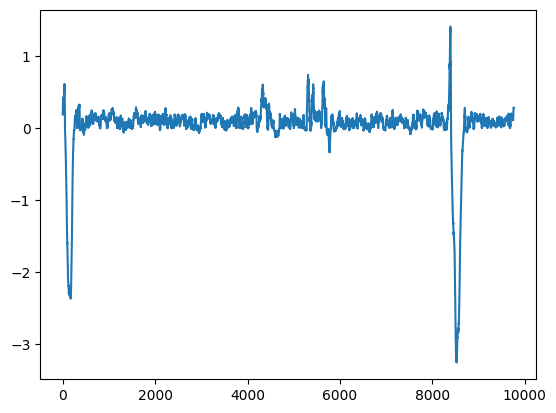

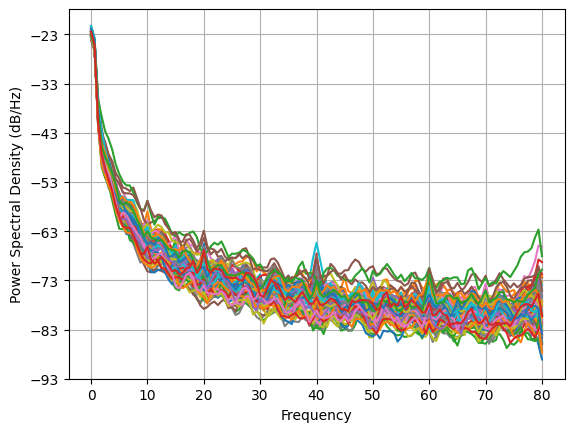

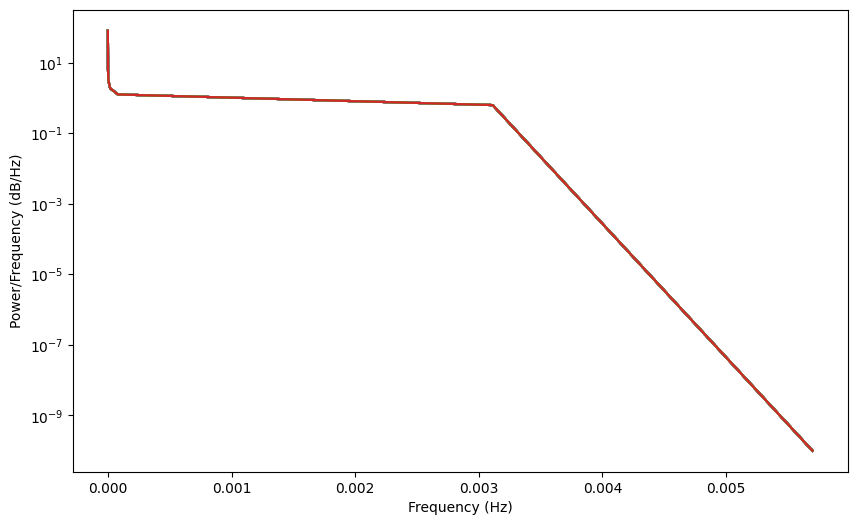

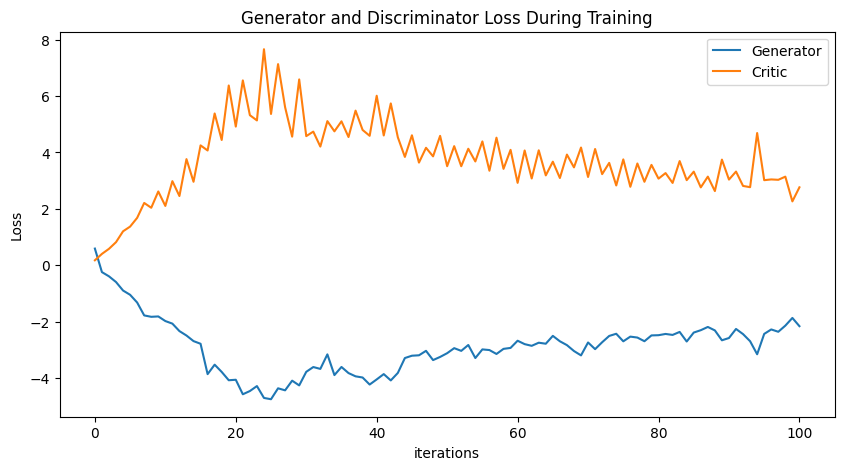

Epoch 150: Critic error ([0.5903556905830057, -0.2447297830022579, -0.3943767269762248, -0.5968595144059203, -0.898589295444865, -1.0499011220408307, -1.323507491625384, -1.781597156769635, -1.8309353743696268, -1.817724459803594, -1.9815589368017625, -2.073122088716329, -2.3378628630543563, -2.4951682657165186, -2.6931669117289054, -2.787946197429754, -3.8655083252298033, -3.529661746857147, -3.7871862235419007, -4.082133021262316, -4.065046281577907, -4.579756226238438, -4.465290553462321, -4.289004895690062, -4.709960840584443, -4.755629627763097, -4.368336102551938, -4.4399007393242105, -4.097231768826366, -4.265461814676435, -3.783619428034898, -3.6134223739320896, -3.679589737425238, -3.1640573950227067, -3.899324575709467, -3.6111627487979803, -3.827848677935476, -3.9433056000587388, -3.9850932149244365, -4.234611166297302, -4.052918939435522, -3.8640813427601737, -4.088583342543905, -3.822445298836427, -3.294168446310702, -3.2116073758696477, -3.1967190161962176, -3.03872958017

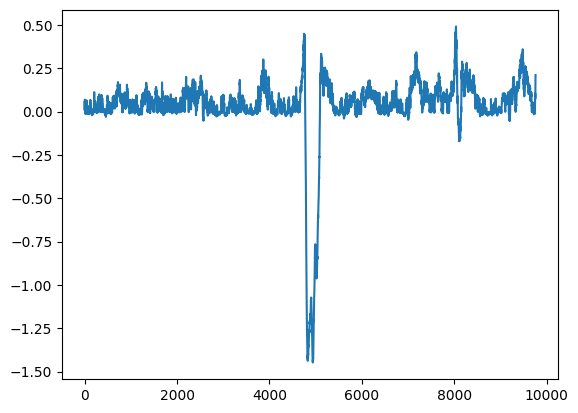

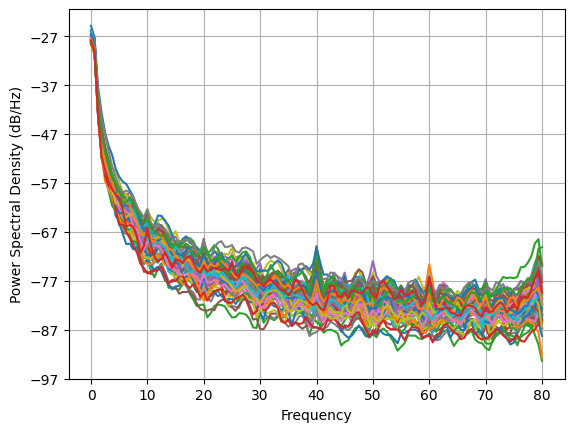

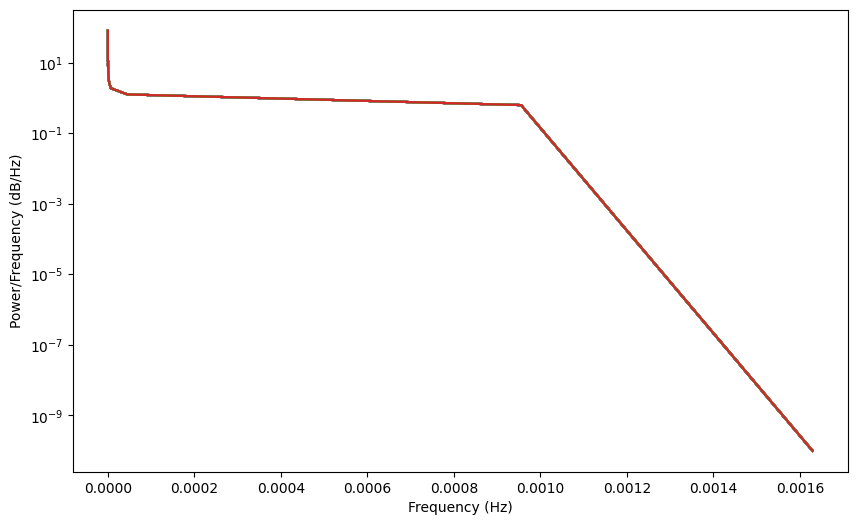

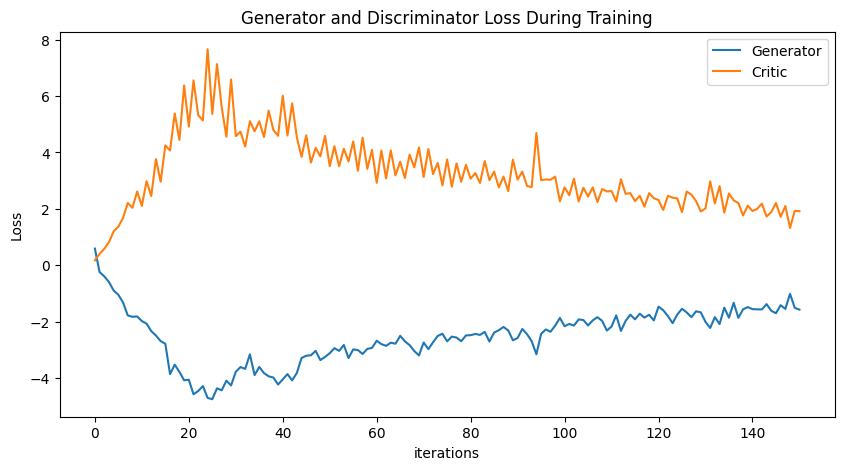

Epoch 200: Critic error ([0.5903556905830057, -0.2447297830022579, -0.3943767269762248, -0.5968595144059203, -0.898589295444865, -1.0499011220408307, -1.323507491625384, -1.781597156769635, -1.8309353743696268, -1.817724459803594, -1.9815589368017625, -2.073122088716329, -2.3378628630543563, -2.4951682657165186, -2.6931669117289054, -2.787946197429754, -3.8655083252298033, -3.529661746857147, -3.7871862235419007, -4.082133021262316, -4.065046281577907, -4.579756226238438, -4.465290553462321, -4.289004895690062, -4.709960840584443, -4.755629627763097, -4.368336102551938, -4.4399007393242105, -4.097231768826366, -4.265461814676435, -3.783619428034898, -3.6134223739320896, -3.679589737425238, -3.1640573950227067, -3.899324575709467, -3.6111627487979803, -3.827848677935476, -3.9433056000587388, -3.9850932149244365, -4.234611166297302, -4.052918939435522, -3.8640813427601737, -4.088583342543905, -3.822445298836427, -3.294168446310702, -3.2116073758696477, -3.1967190161962176, -3.03872958017

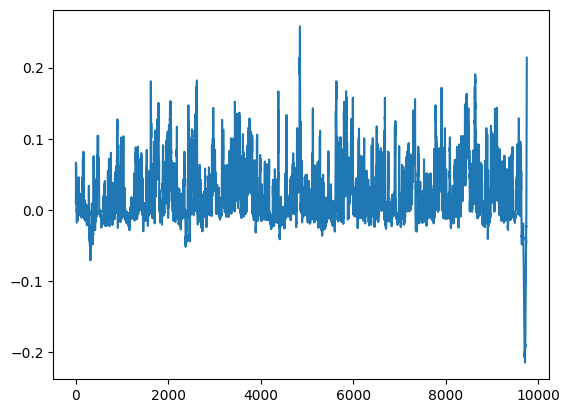

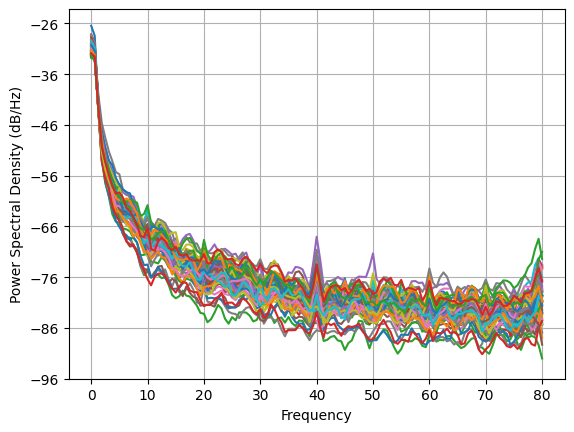

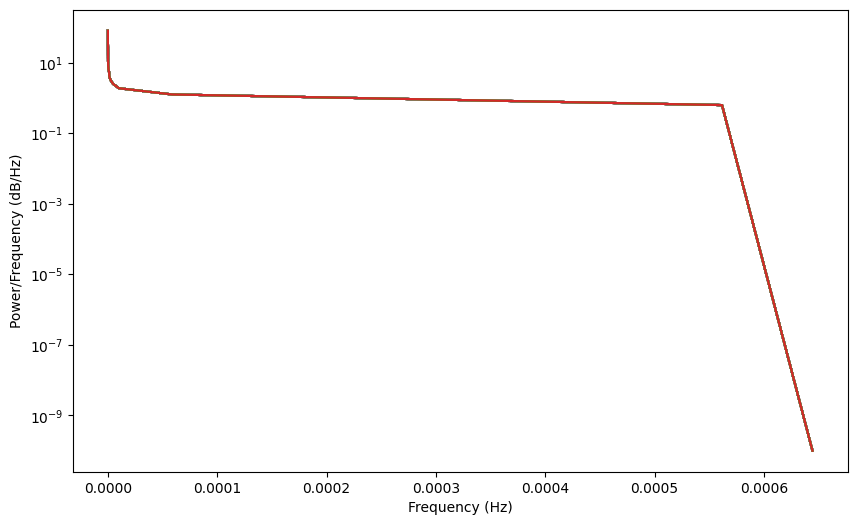

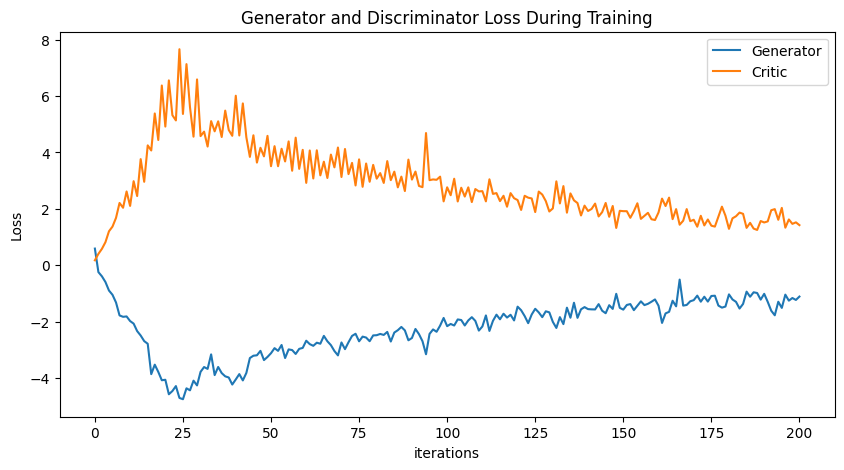

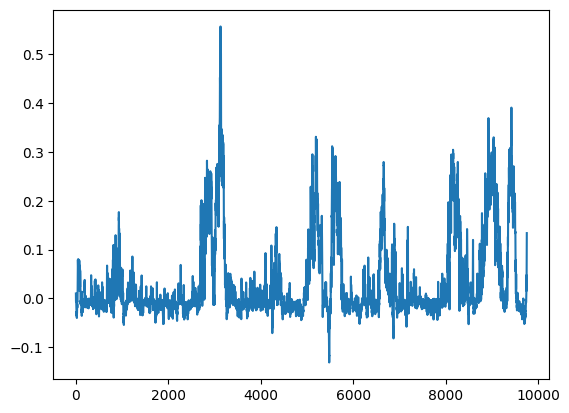

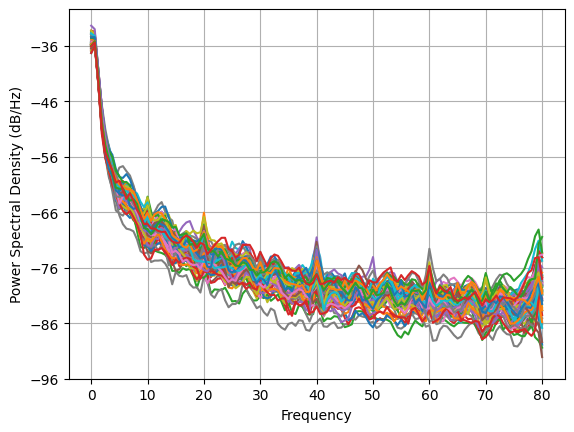

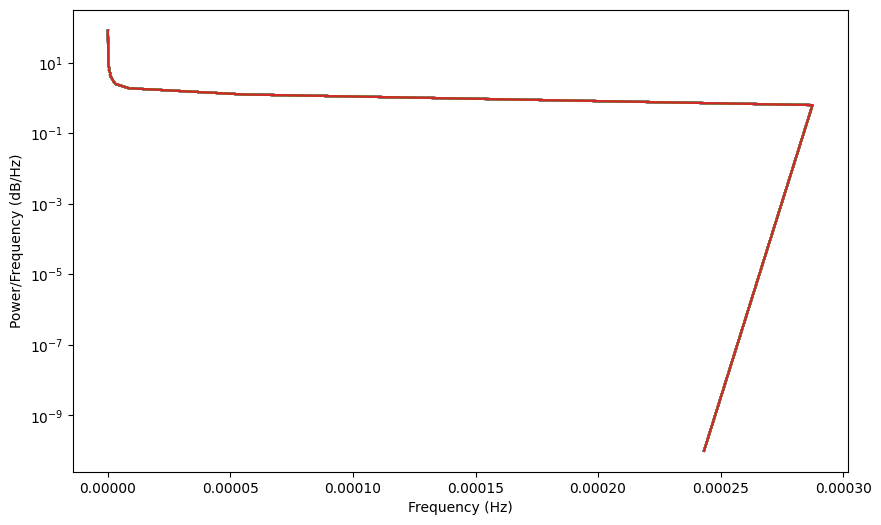

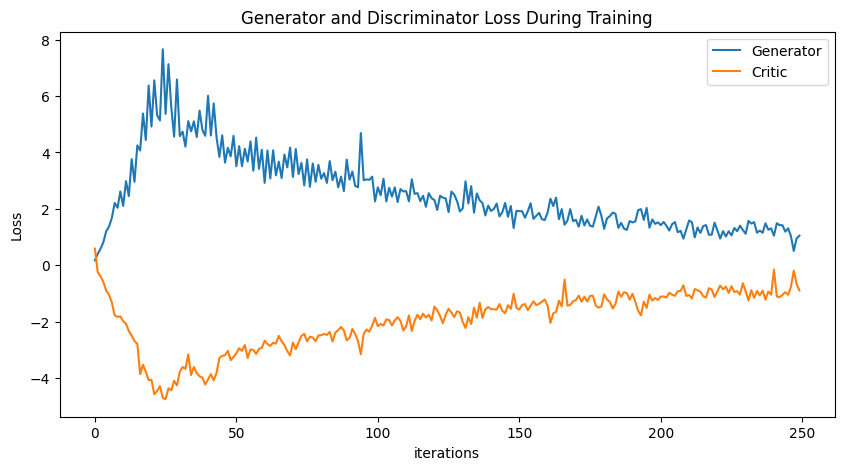

In [12]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(training_data_open)[0]
training_data = torch.tensor(training_data_open)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            D.zero_grad() # this is the change
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        G.zero_grad() # this is the change
        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_1, disc, gen = train()

torch.save(gen, 'genv3_1.pt')
torch.save(disc, 'discv3_1.pt')

plot_everything(generated_data_1, gen_err, critic_err)

# Dataloader, Zero grad weights before, Zero grad after optimizer
### no no

Epoch 0: Critic error ([2.136335097606647]) Generator err ([-0.033892035484313965])


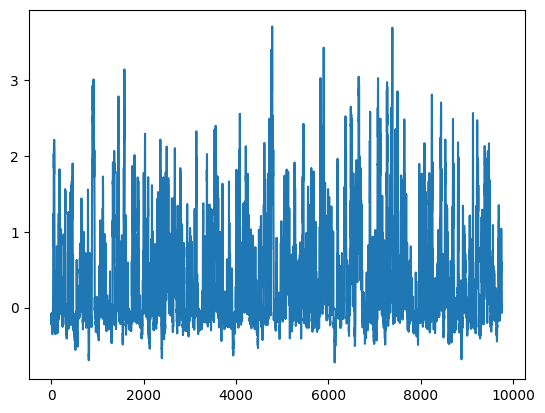

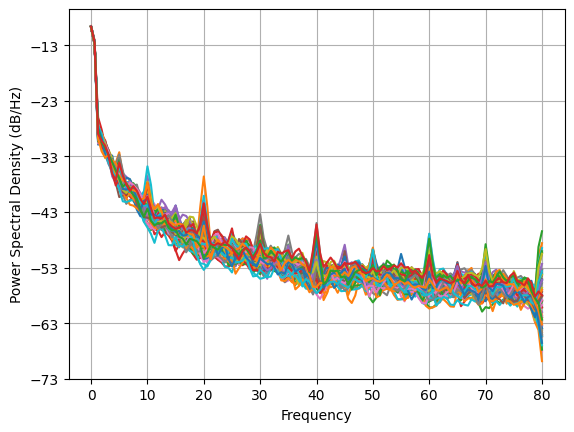

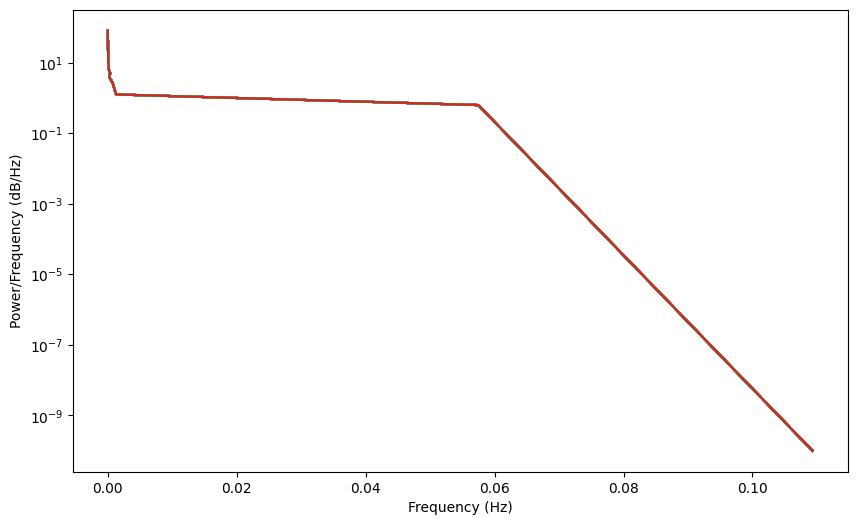

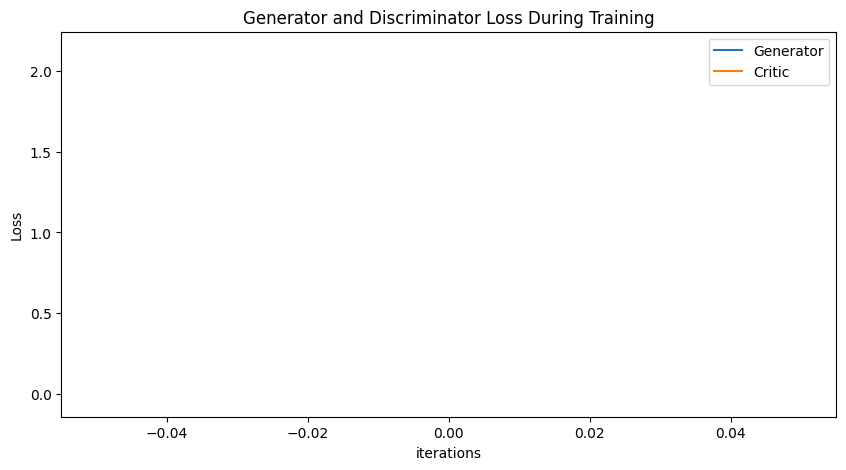

Epoch 50: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.3

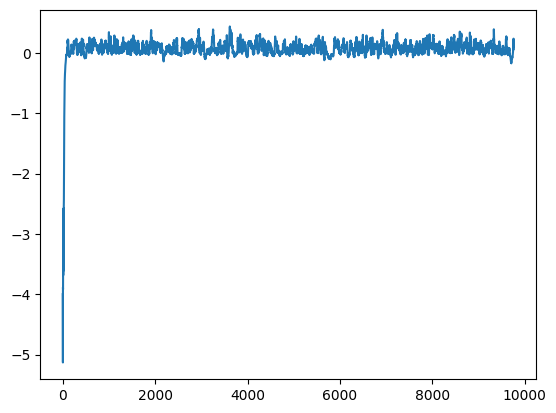

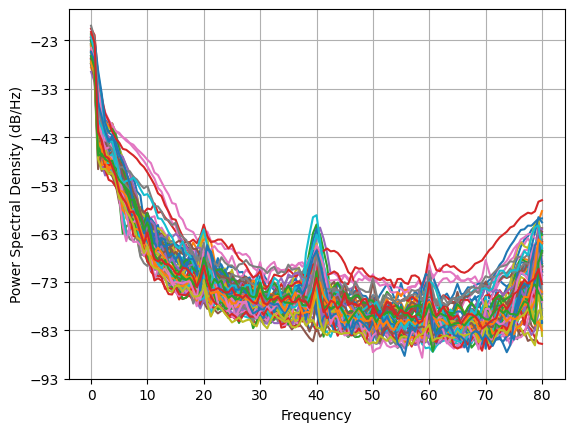

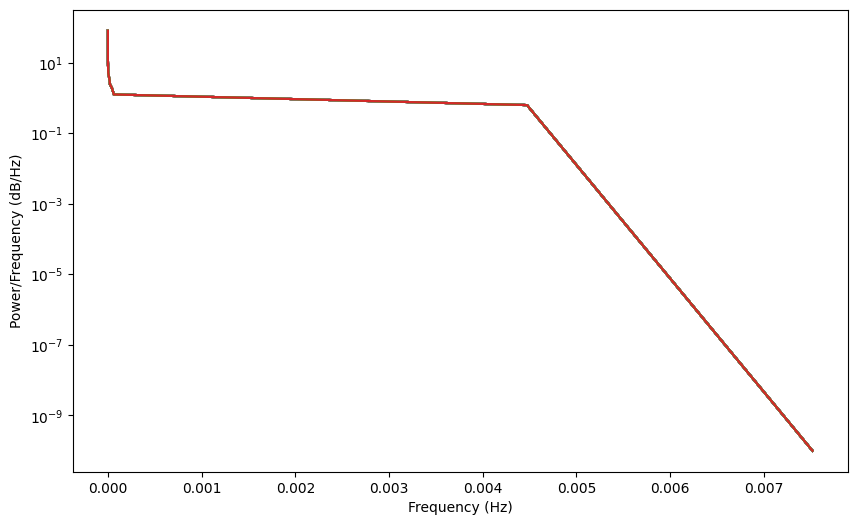

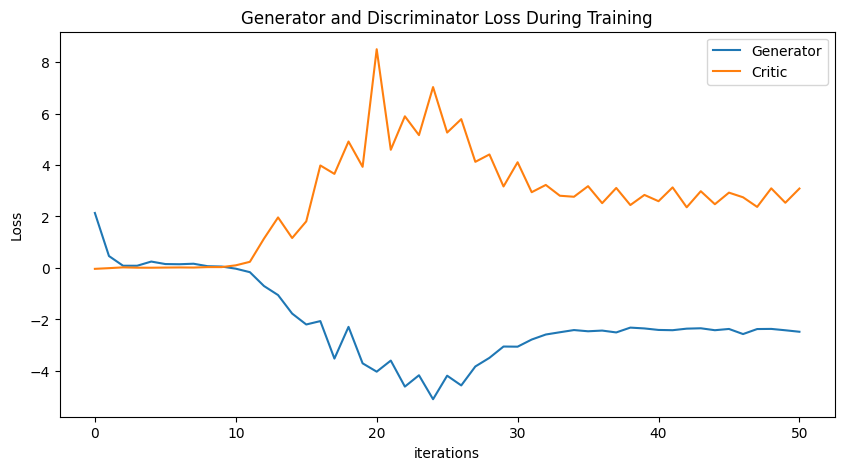

Epoch 100: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

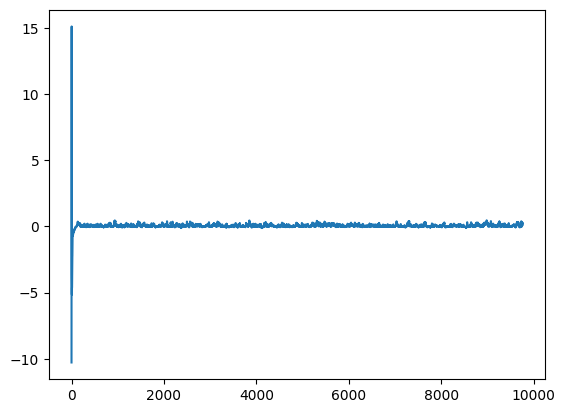

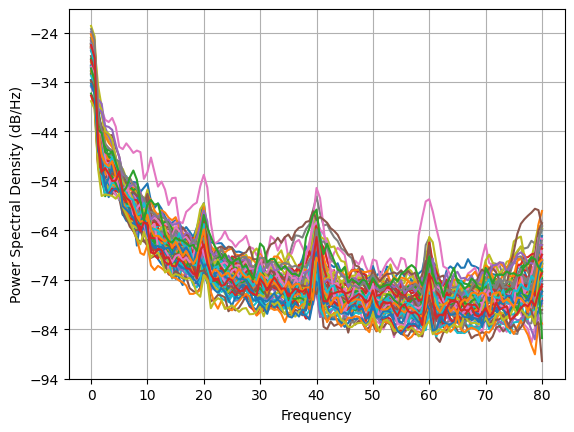

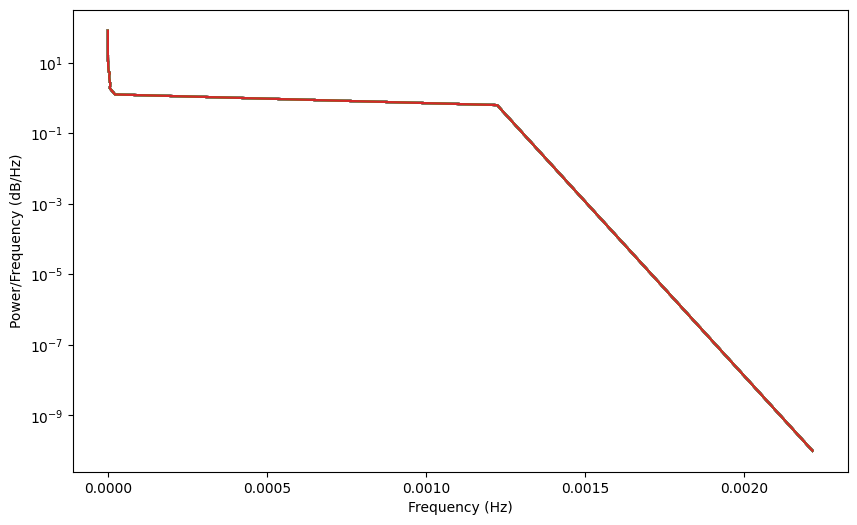

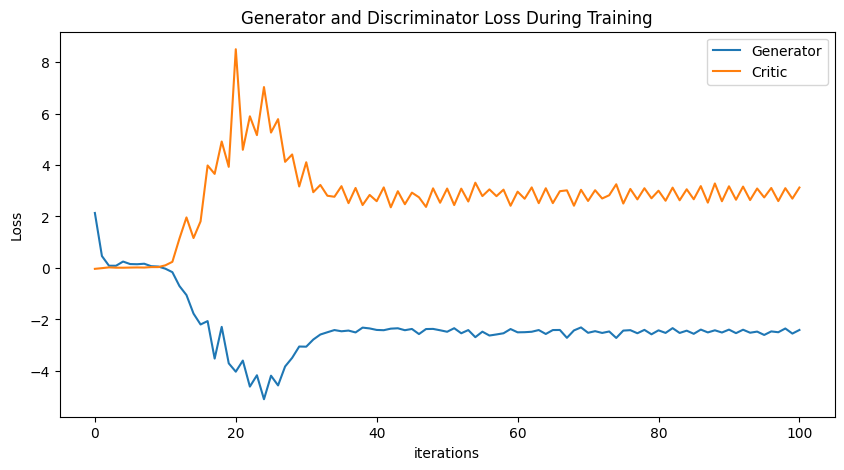

Epoch 150: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

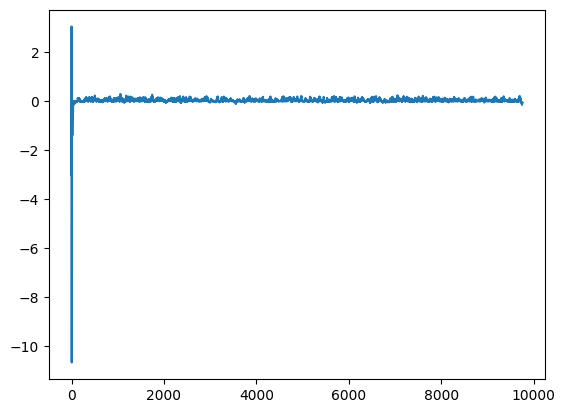

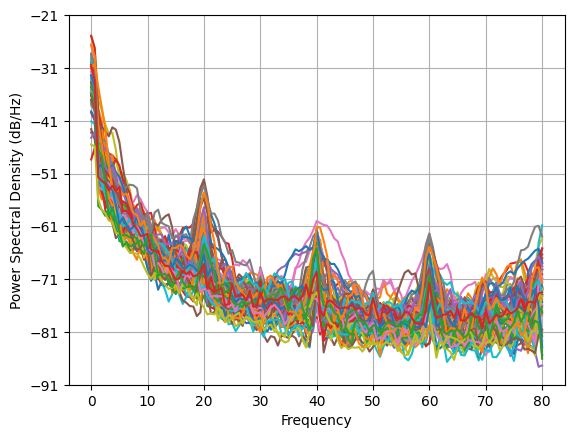

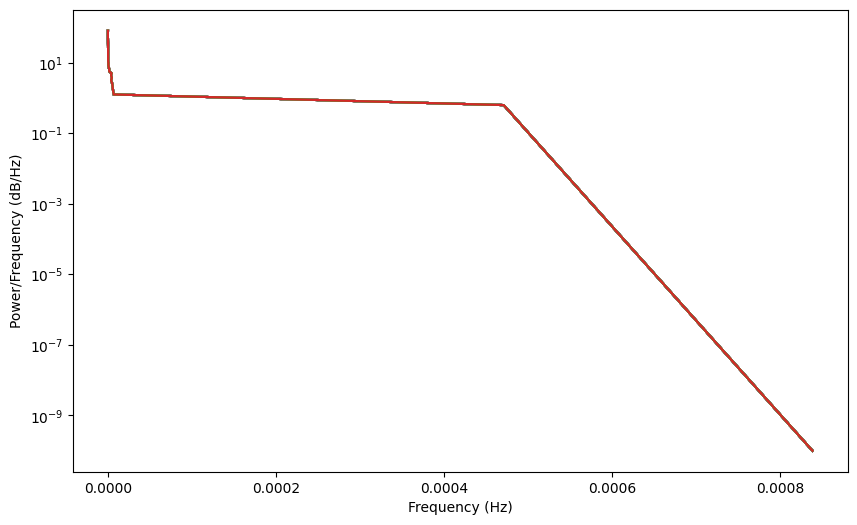

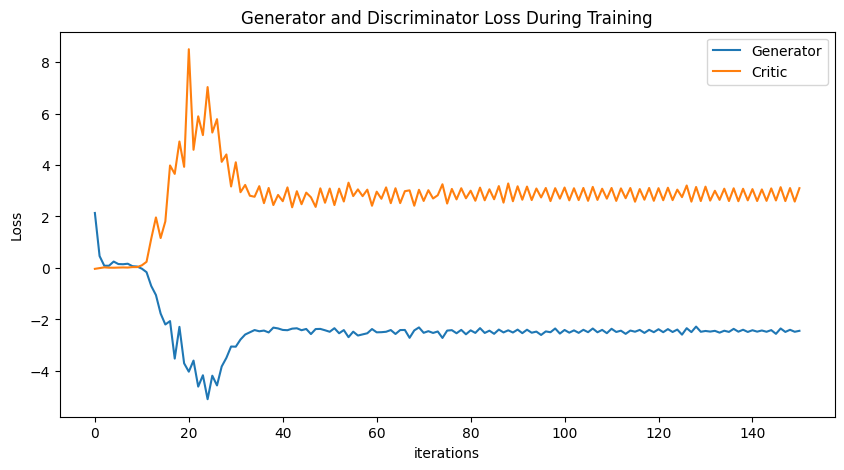

Epoch 200: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

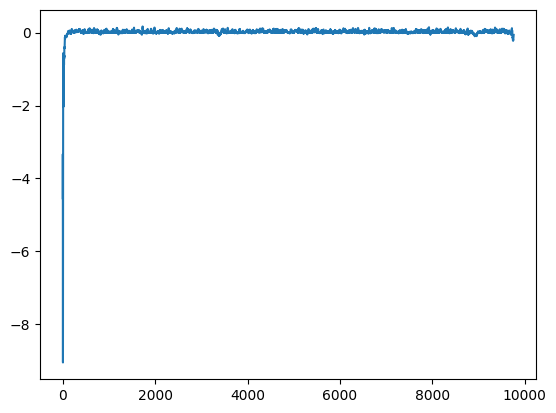

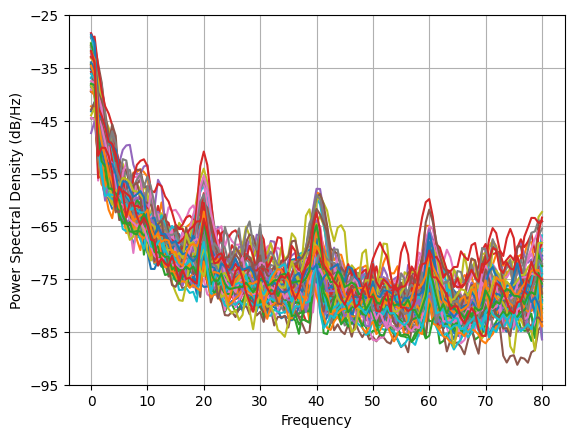

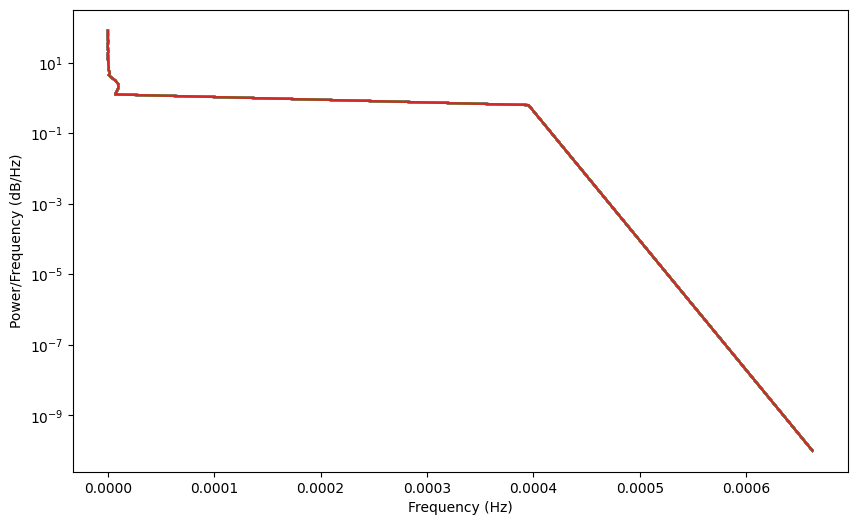

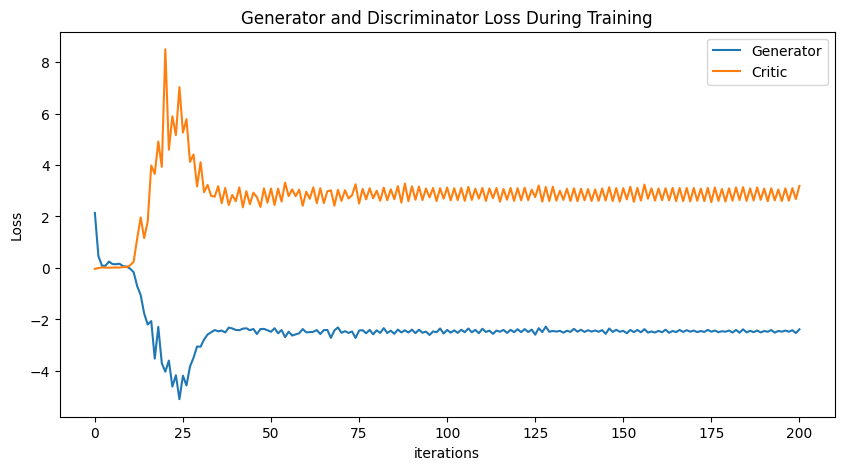

Epoch 250: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

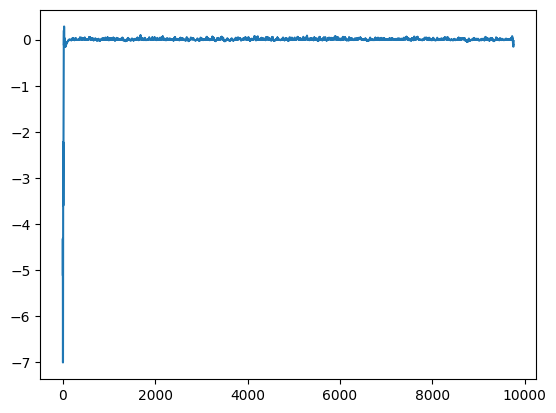

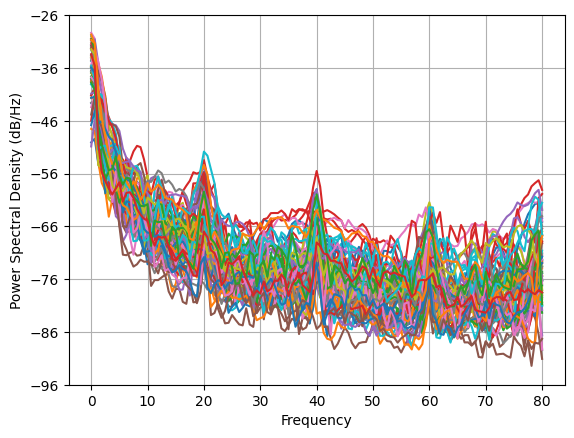

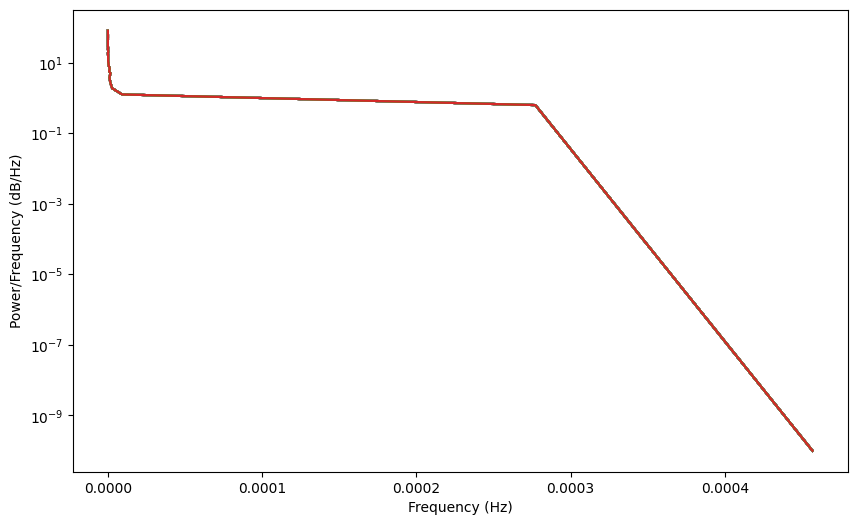

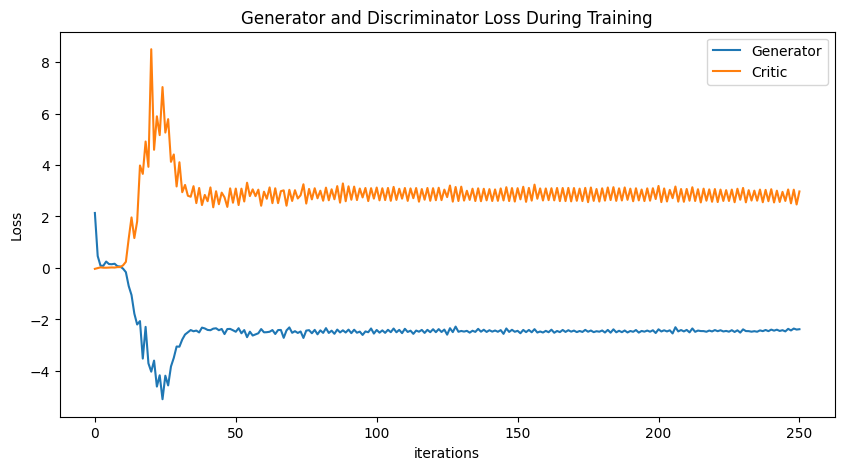

Epoch 300: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

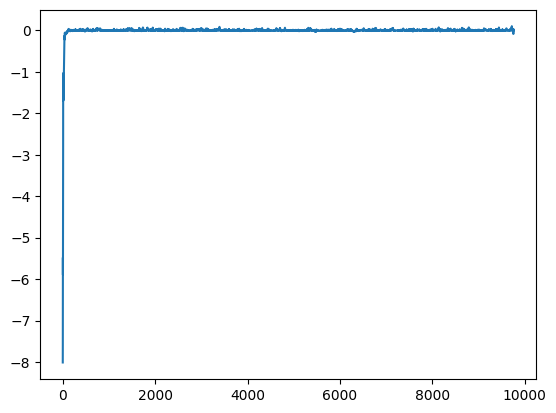

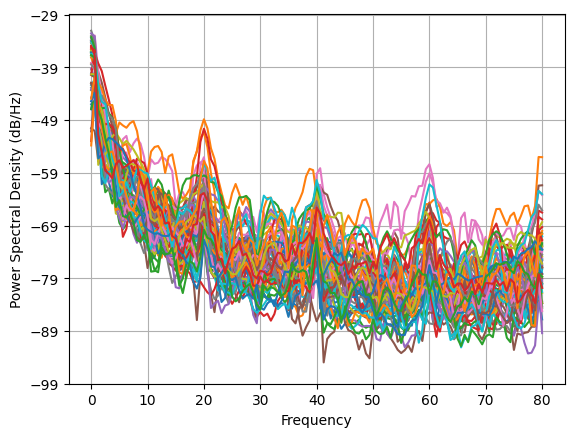

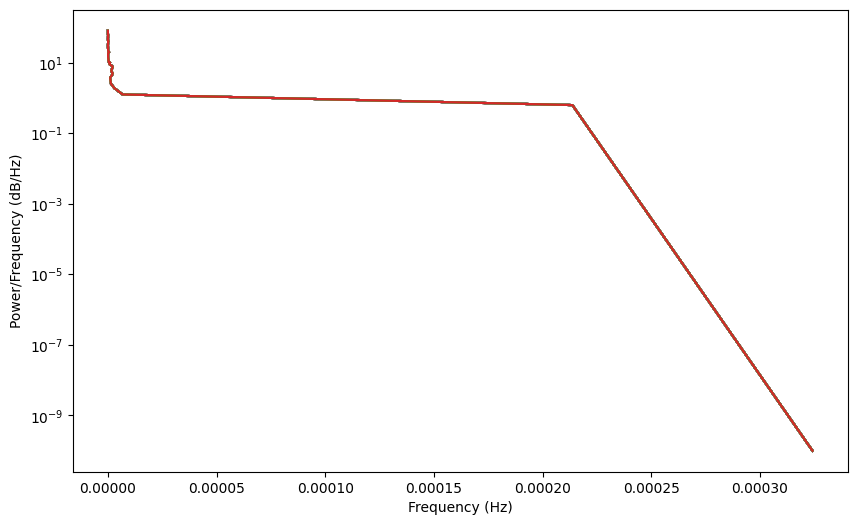

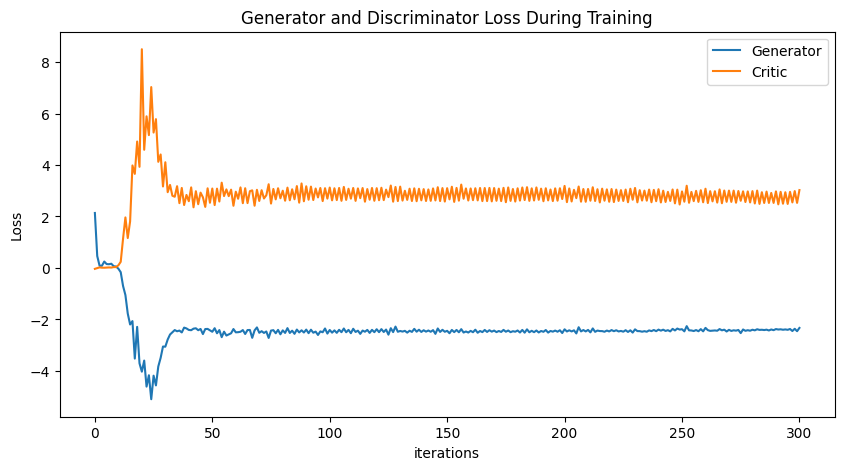

Epoch 350: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

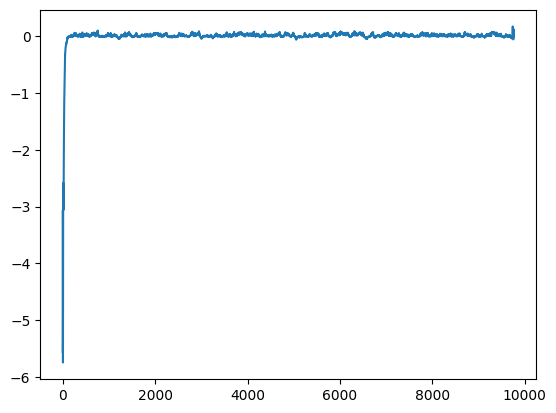

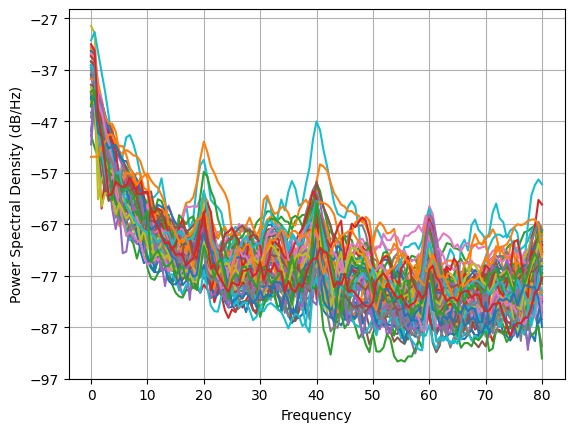

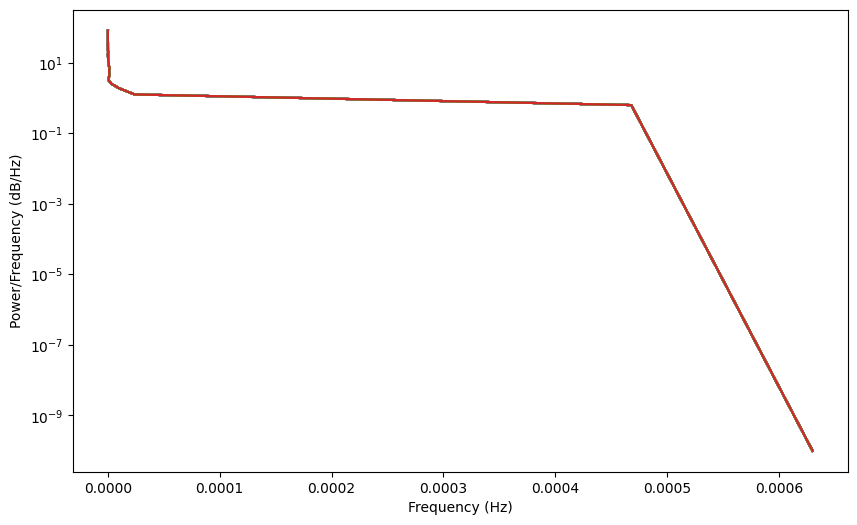

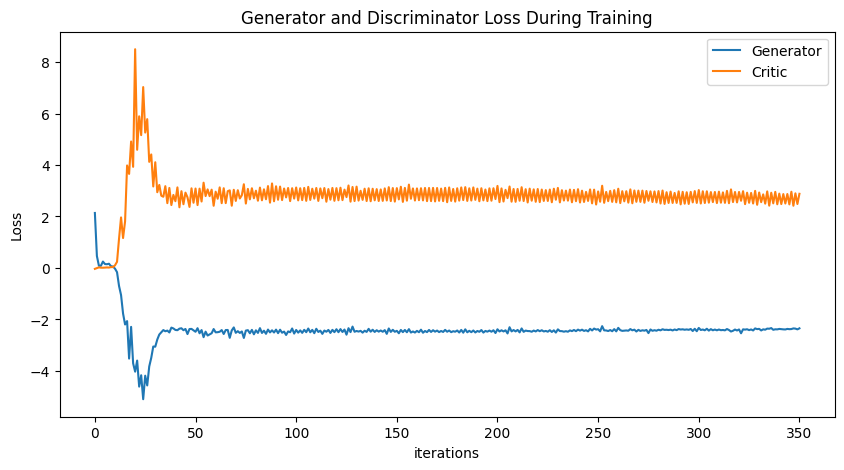

Epoch 400: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

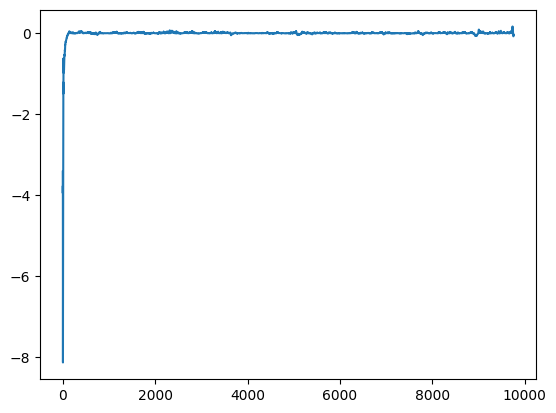

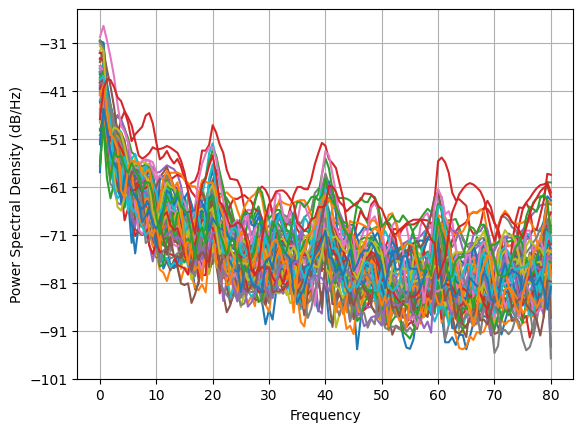

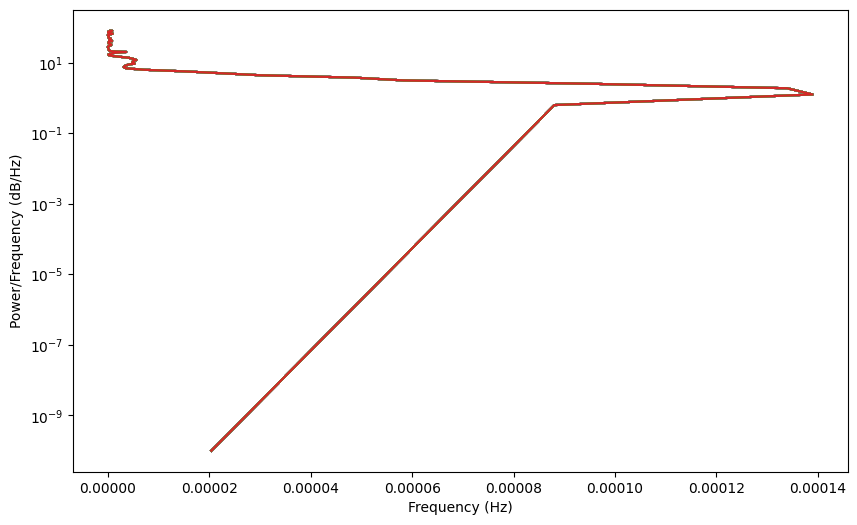

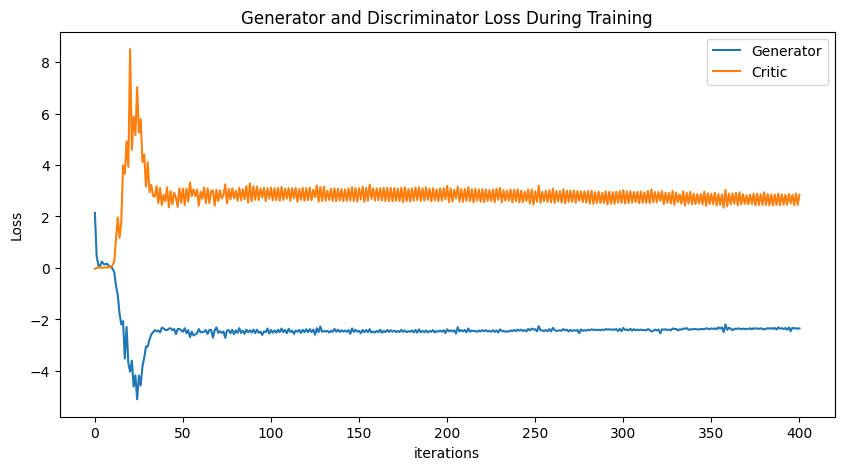

Epoch 450: Critic error ([2.136335097606647, 0.46351080597825584, 0.08687373968998396, 0.08619901525011608, 0.24904481909234832, 0.15246728018000233, 0.14533600725708892, 0.164847734518465, 0.06888851080179939, 0.05552750310368923, -0.027297281511577065, -0.1632165264557324, -0.7002390249160398, -1.0522315810226746, -1.7715276327631533, -2.1951016672419166, -2.0634191724780178, -3.5195664786581395, -2.287593374054462, -3.7038090761816713, -4.028238291920685, -3.5971939320669475, -4.607880193466482, -4.16752745818018, -5.098065061341717, -4.1841313515767204, -4.5621872812864295, -3.826272563726902, -3.491212176056411, -3.0514065179101064, -3.057095779309322, -2.7798391796464803, -2.5848146824104252, -2.496740448389001, -2.4116764391745975, -2.4587929217311566, -2.4317143411783624, -2.5039654311455397, -2.3165831350613173, -2.3484907368215246, -2.406914838042987, -2.417176847632725, -2.356990299168802, -2.3422700109750574, -2.417531662145068, -2.3688913666843243, -2.5671423919943352, -2.

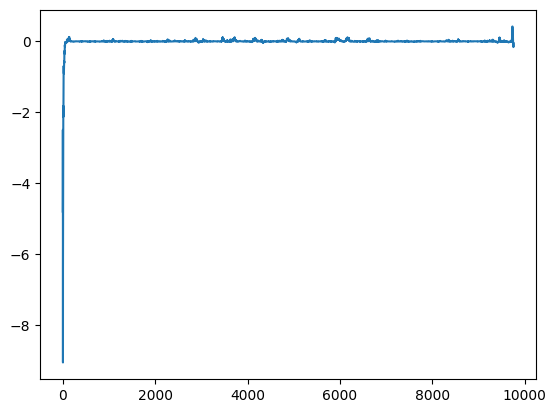

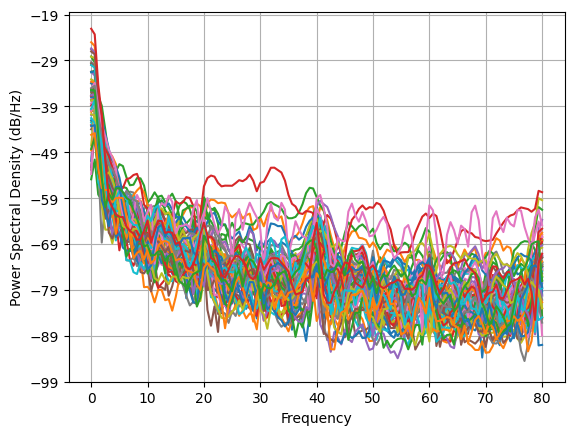

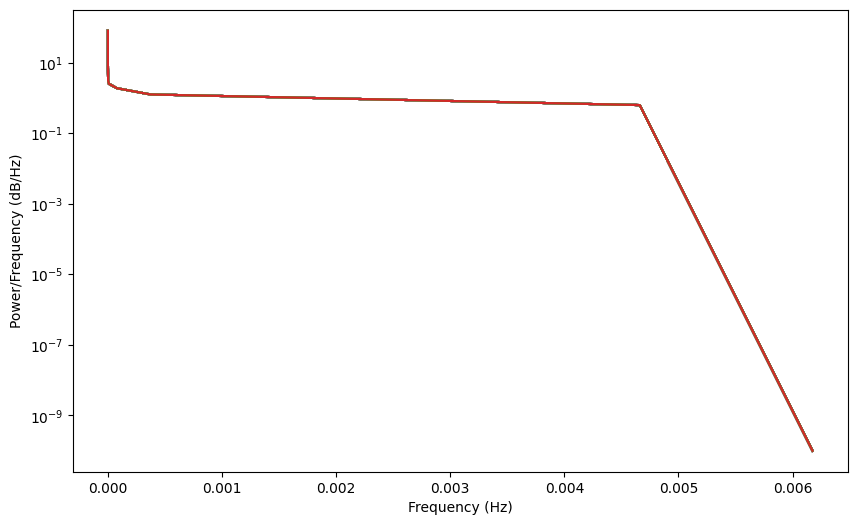

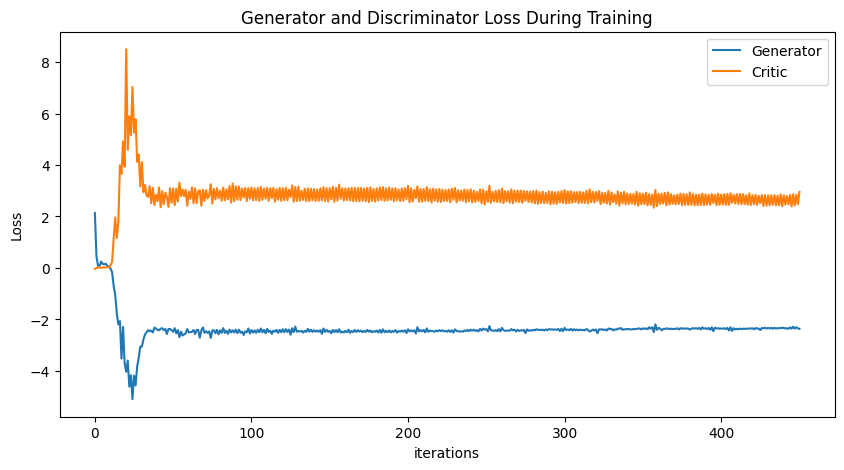

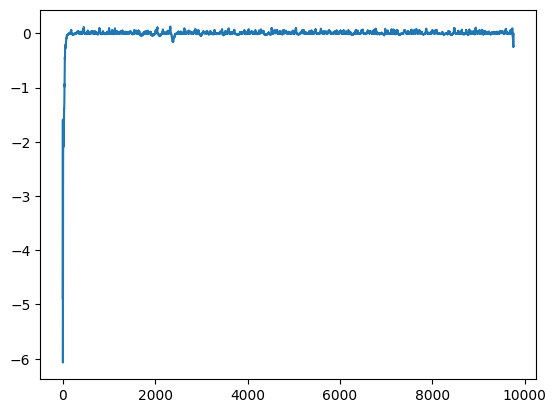

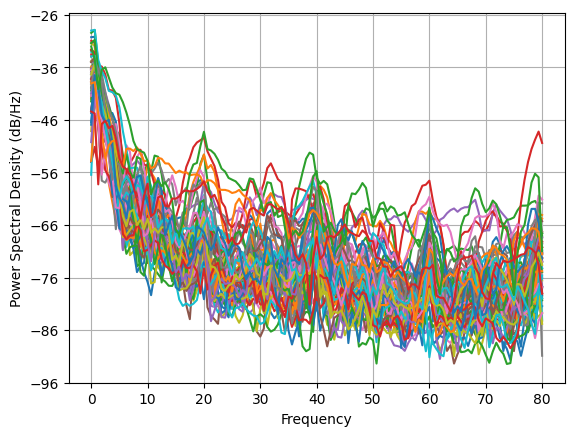

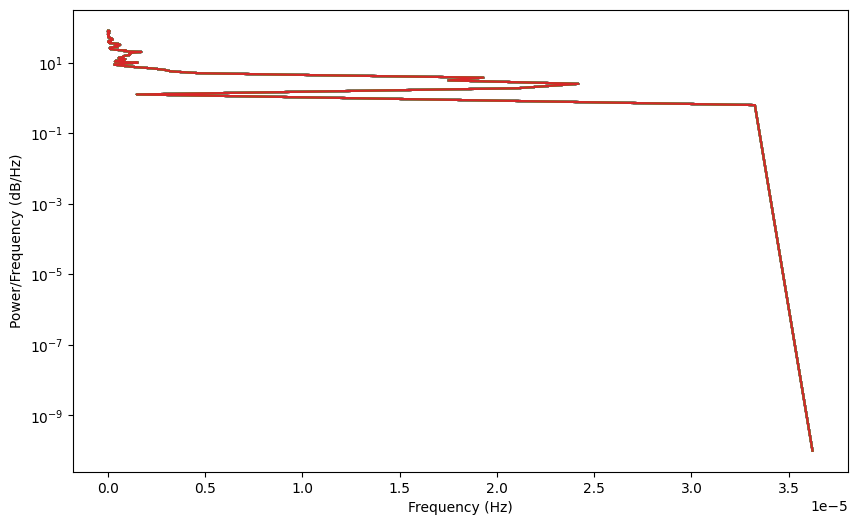

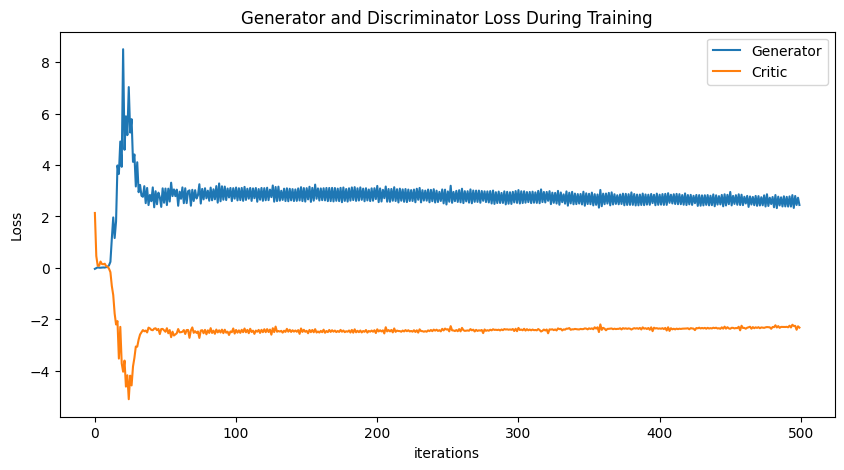

In [5]:
NUM_EPOCHS = 500
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(training_data_open)[0]

train_data = TensorDataset(torch.tensor(training_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            for (real,) in train_loader:
                D.zero_grad()
                real.requires_grad=True
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_real = D(real).reshape(-1)
                critic_fake = D(fake).reshape(-1)
                gp = gradient_penalty(D, real, fake)
                critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
                critic_loss.backward(retain_graph=True)
                critic_optimizer.step()
                critic_optimizer.zero_grad()

        generated_data = fake
        G.zero_grad()
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        loss_gen.backward()
        gen_optimizer.step()
        gen_optimizer.zero_grad()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_3, disc, gen = train()

torch.save(gen, 'genv3_3.pt')
torch.save(disc, 'discv3_3.pt')

plot_everything(generated_data_3, gen_err, critic_err)

# Dataloader, Zero grad after optimizer, follow gpt advice
# High hopes

Epoch 0: Critic error ([3.4718163573865226]) Generator err ([0.0018183371284976602])


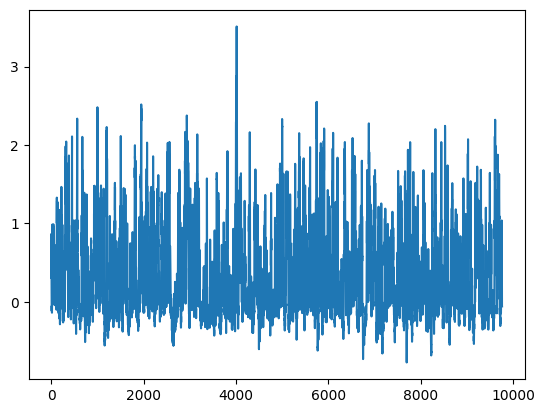

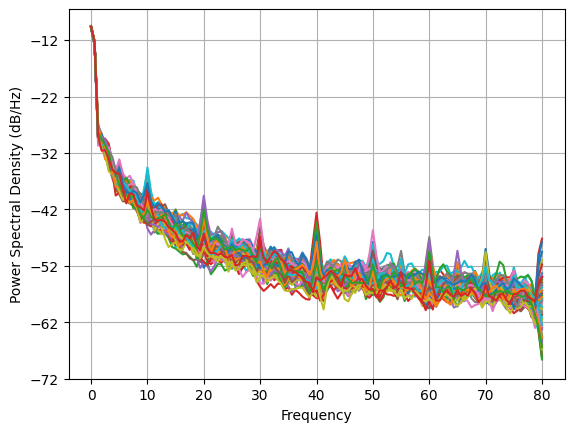

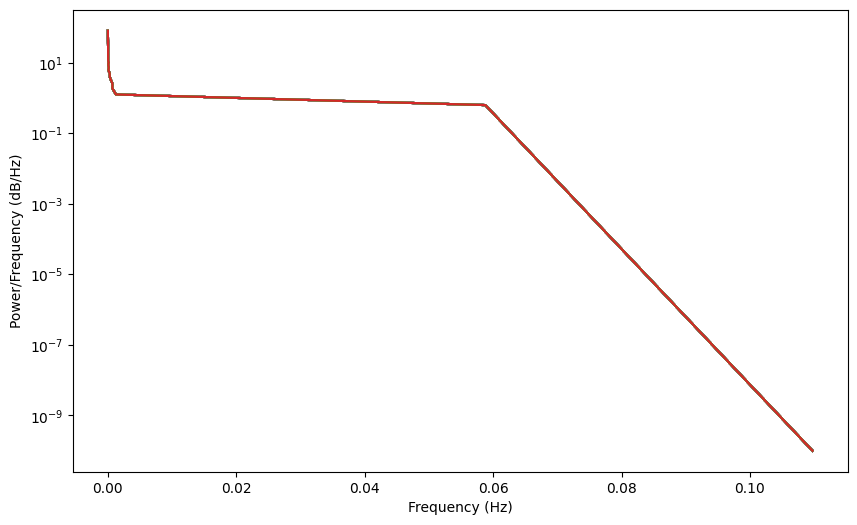

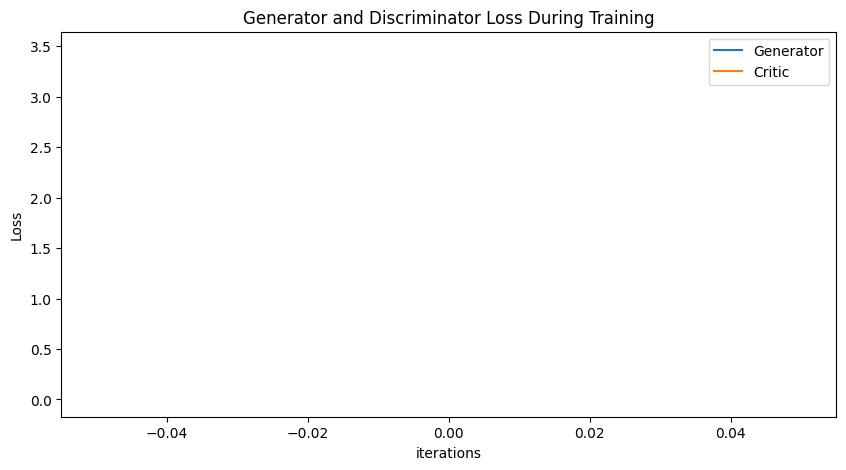

Epoch 50: Critic error ([3.4718163573865226, -0.05220674155141275, -0.5732683440358839, -0.6148412124980691, -1.5543938233934556, -1.4496736917930537, -2.496667464597923, -2.3995054582603776, -1.958487510395152, -2.7395614214402206, -2.717413973185647, -1.960358164318086, -3.289726680476009, -1.2080122047748432, -2.912271314896247, -2.5174959665227394, -3.3241713007887763, -3.330667022785552, -3.581438117642382, -3.765949049548162, -4.314945122336172, -4.04177217819566, -4.0935008402643245, -4.049565247620045, -4.553442474159674, -3.3126900363703746, -3.8648092379949737, -3.335447177862001, -4.050875076026366, -4.35514383863482, -3.5681479380224523, -3.0355062077245156, -4.140867978222722, -2.240207605681105, -4.098075591373793, -3.6822078644468608, -4.2857175466955475, -3.7295303783184663, -3.790451716215342, -1.9436047437371635, -3.547238007350896, -3.49316481809948, -3.7635230161066966, -2.945164838447074, -4.241541831157667, -2.7616975476629064, -4.196317913772068, -3.9397556015571

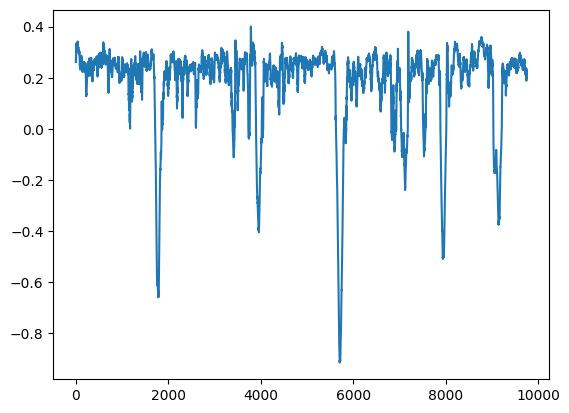

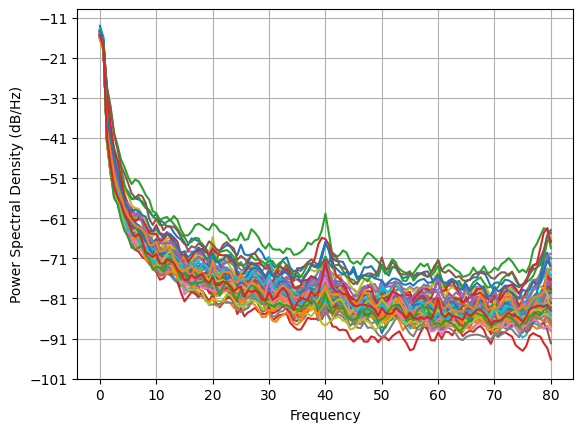

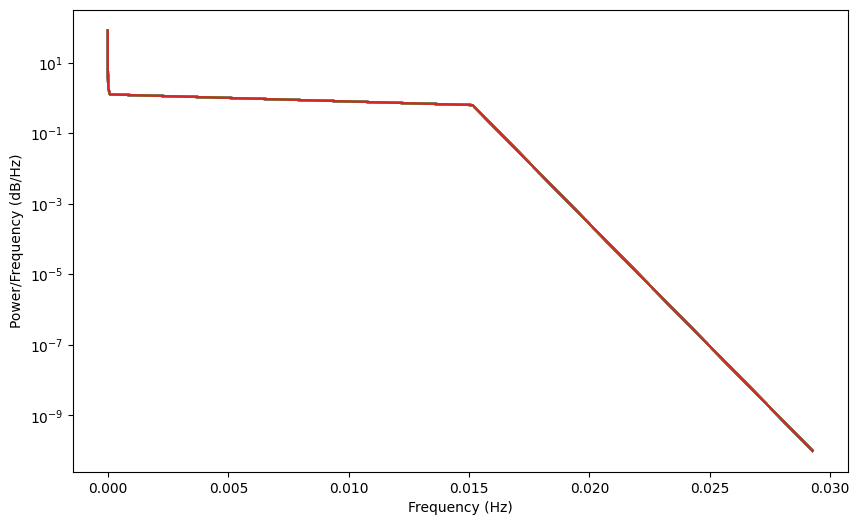

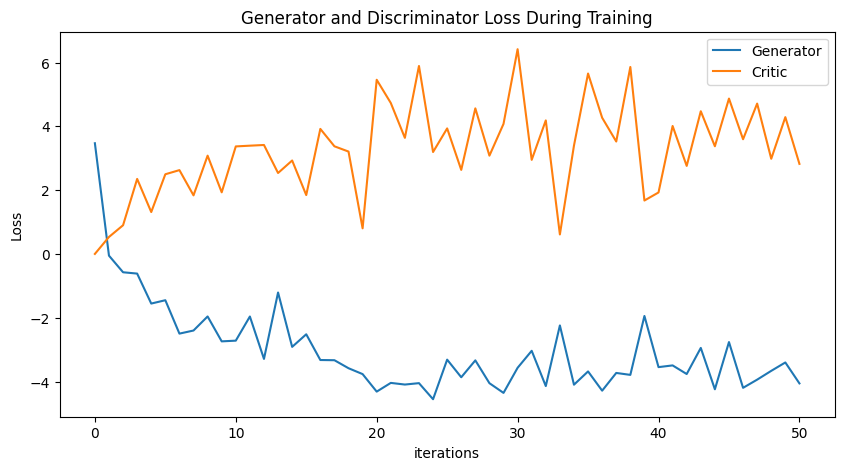

Epoch 100: Critic error ([3.4718163573865226, -0.05220674155141275, -0.5732683440358839, -0.6148412124980691, -1.5543938233934556, -1.4496736917930537, -2.496667464597923, -2.3995054582603776, -1.958487510395152, -2.7395614214402206, -2.717413973185647, -1.960358164318086, -3.289726680476009, -1.2080122047748432, -2.912271314896247, -2.5174959665227394, -3.3241713007887763, -3.330667022785552, -3.581438117642382, -3.765949049548162, -4.314945122336172, -4.04177217819566, -4.0935008402643245, -4.049565247620045, -4.553442474159674, -3.3126900363703746, -3.8648092379949737, -3.335447177862001, -4.050875076026366, -4.35514383863482, -3.5681479380224523, -3.0355062077245156, -4.140867978222722, -2.240207605681105, -4.098075591373793, -3.6822078644468608, -4.2857175466955475, -3.7295303783184663, -3.790451716215342, -1.9436047437371635, -3.547238007350896, -3.49316481809948, -3.7635230161066966, -2.945164838447074, -4.241541831157667, -2.7616975476629064, -4.196317913772068, -3.939755601557

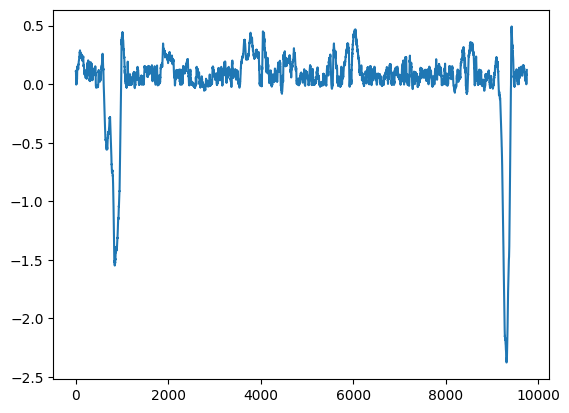

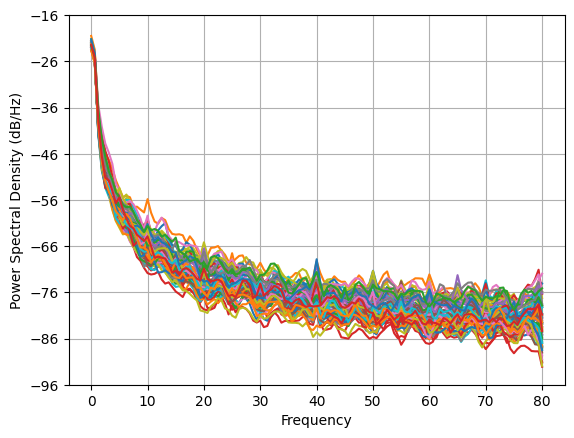

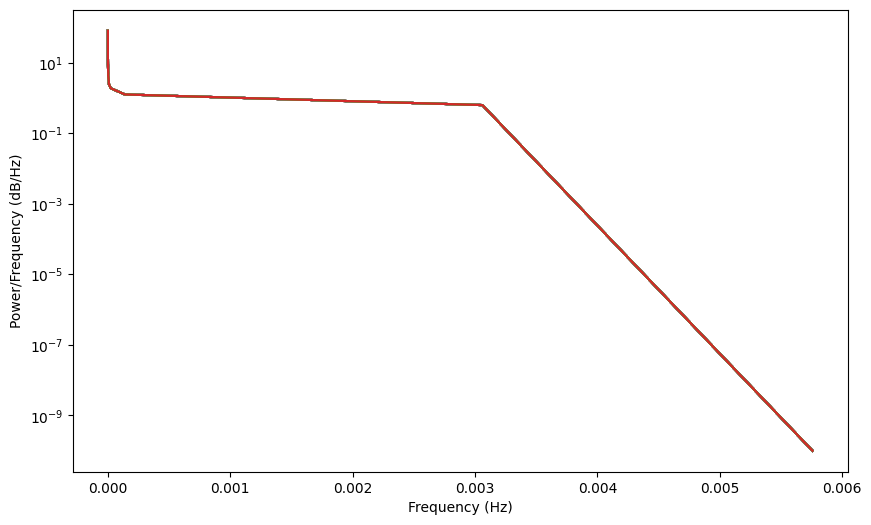

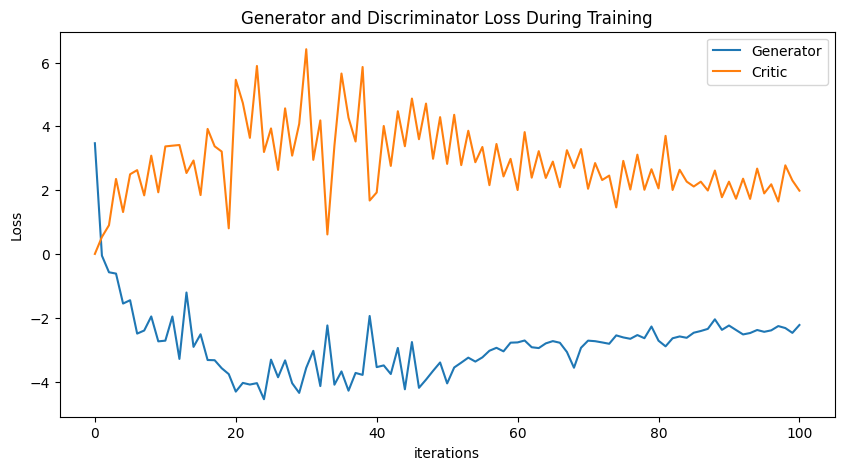

Epoch 150: Critic error ([3.4718163573865226, -0.05220674155141275, -0.5732683440358839, -0.6148412124980691, -1.5543938233934556, -1.4496736917930537, -2.496667464597923, -2.3995054582603776, -1.958487510395152, -2.7395614214402206, -2.717413973185647, -1.960358164318086, -3.289726680476009, -1.2080122047748432, -2.912271314896247, -2.5174959665227394, -3.3241713007887763, -3.330667022785552, -3.581438117642382, -3.765949049548162, -4.314945122336172, -4.04177217819566, -4.0935008402643245, -4.049565247620045, -4.553442474159674, -3.3126900363703746, -3.8648092379949737, -3.335447177862001, -4.050875076026366, -4.35514383863482, -3.5681479380224523, -3.0355062077245156, -4.140867978222722, -2.240207605681105, -4.098075591373793, -3.6822078644468608, -4.2857175466955475, -3.7295303783184663, -3.790451716215342, -1.9436047437371635, -3.547238007350896, -3.49316481809948, -3.7635230161066966, -2.945164838447074, -4.241541831157667, -2.7616975476629064, -4.196317913772068, -3.939755601557

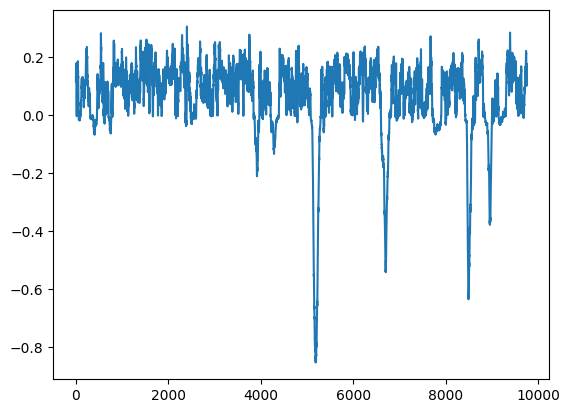

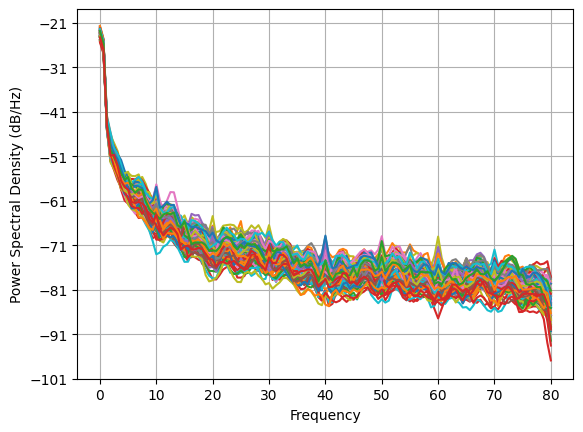

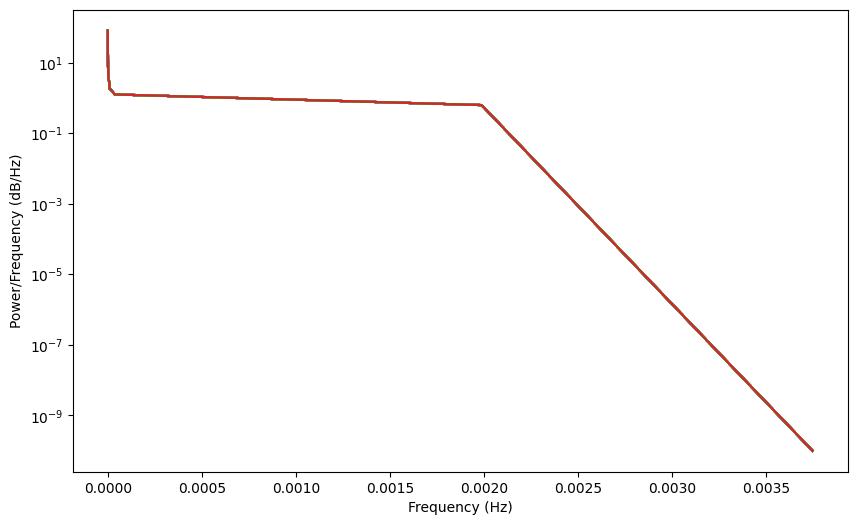

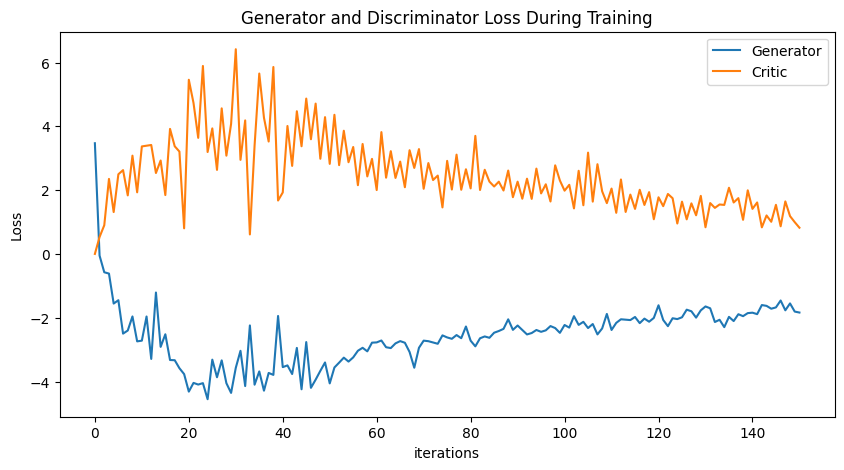

Epoch 200: Critic error ([3.4718163573865226, -0.05220674155141275, -0.5732683440358839, -0.6148412124980691, -1.5543938233934556, -1.4496736917930537, -2.496667464597923, -2.3995054582603776, -1.958487510395152, -2.7395614214402206, -2.717413973185647, -1.960358164318086, -3.289726680476009, -1.2080122047748432, -2.912271314896247, -2.5174959665227394, -3.3241713007887763, -3.330667022785552, -3.581438117642382, -3.765949049548162, -4.314945122336172, -4.04177217819566, -4.0935008402643245, -4.049565247620045, -4.553442474159674, -3.3126900363703746, -3.8648092379949737, -3.335447177862001, -4.050875076026366, -4.35514383863482, -3.5681479380224523, -3.0355062077245156, -4.140867978222722, -2.240207605681105, -4.098075591373793, -3.6822078644468608, -4.2857175466955475, -3.7295303783184663, -3.790451716215342, -1.9436047437371635, -3.547238007350896, -3.49316481809948, -3.7635230161066966, -2.945164838447074, -4.241541831157667, -2.7616975476629064, -4.196317913772068, -3.939755601557

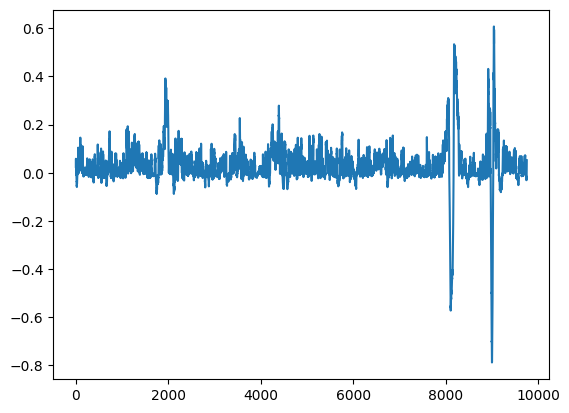

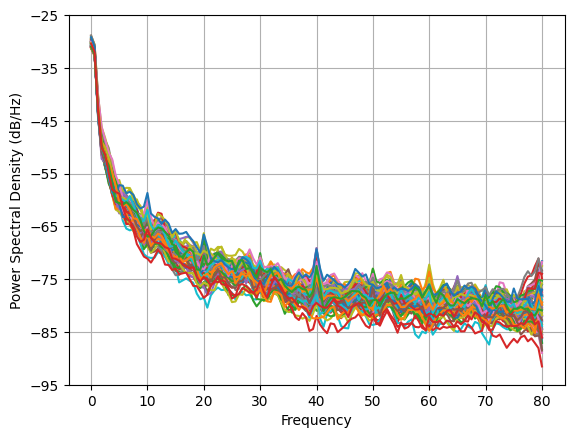

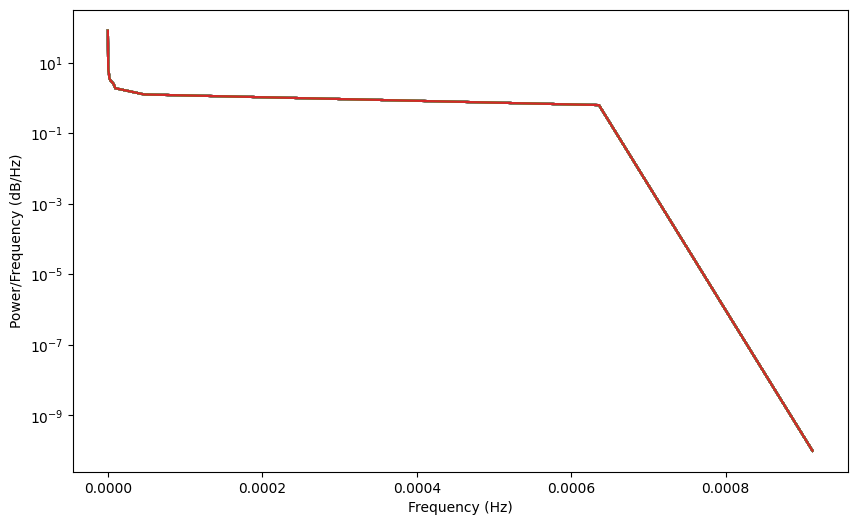

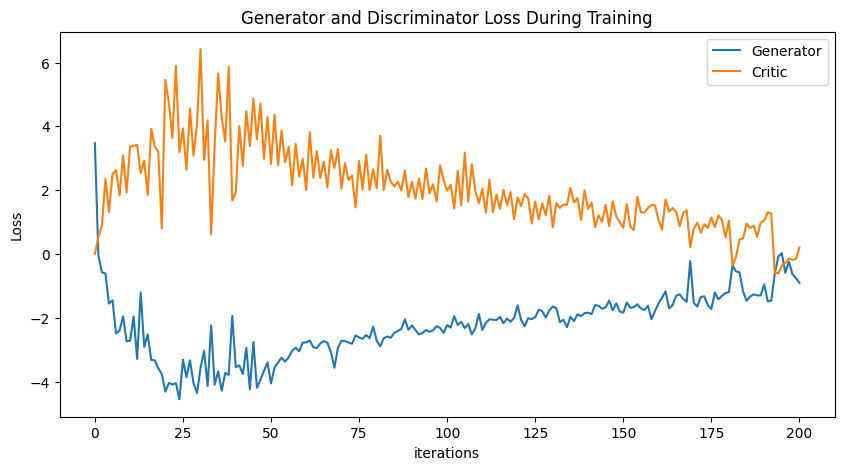

KeyboardInterrupt: 

In [13]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(training_data_open)[0]

train_data = TensorDataset(torch.tensor(training_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            for (real,) in train_loader:
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)

                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4, disc, gen = train()

torch.save(gen, 'genv3_4.pt')
torch.save(disc, 'discv3_4.pt')

plot_everything(generated_data_4, gen_err, critic_err)

In [ ]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(training_data_open)[0]

train_data = TensorDataset(torch.tensor(training_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            for (real,) in train_loader:
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)

                noise = sample_normal_distribution(BATCH_SIZE, 64, 4880)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 64, 4880)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_complex, disc, gen = train()

torch.save(gen, 'genv3_4_complex.pt')
torch.save(disc, 'discv3_4_complex.pt')

plot_everything(generated_data_4_complex, gen_err, critic_err)

# replica above, Use batch of 10
### no no

Epoch 0: Critic error ([1.470736524978141]) Generator err ([0.06463334709405899])


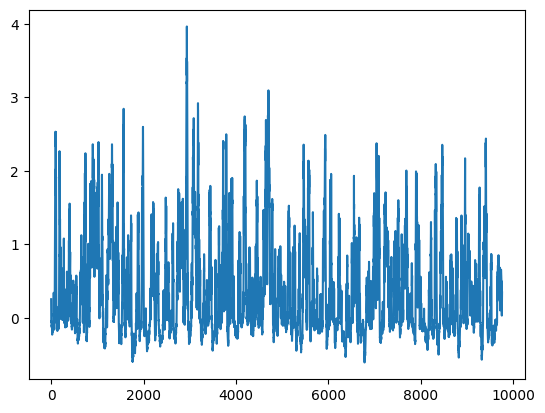

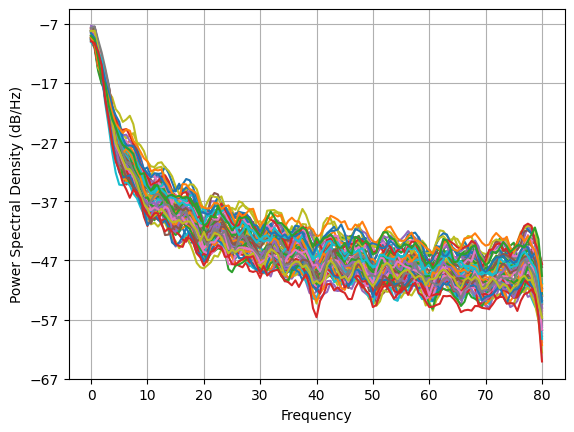

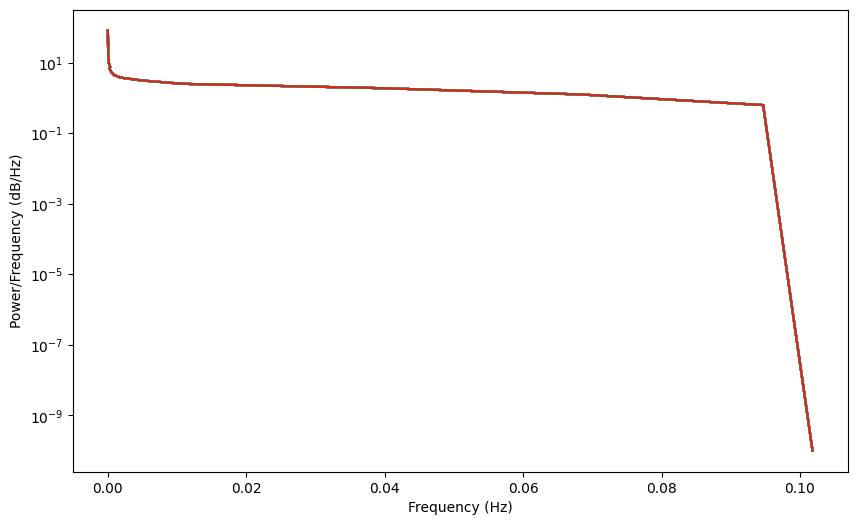

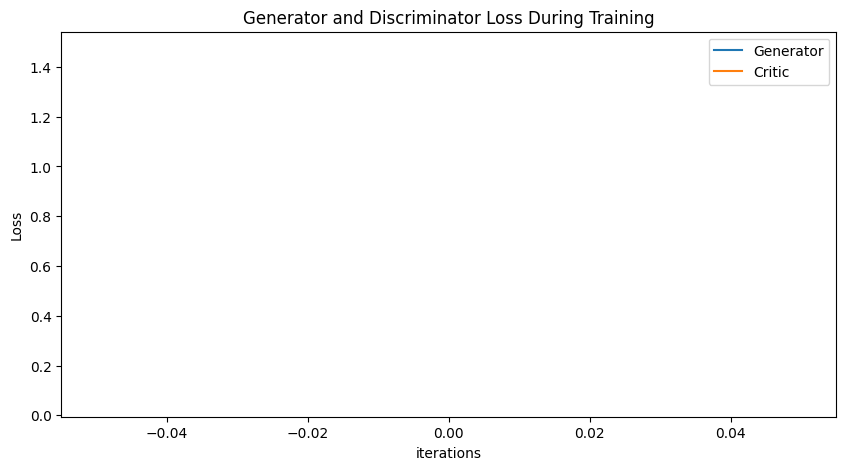

Epoch 50: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.2887888223078

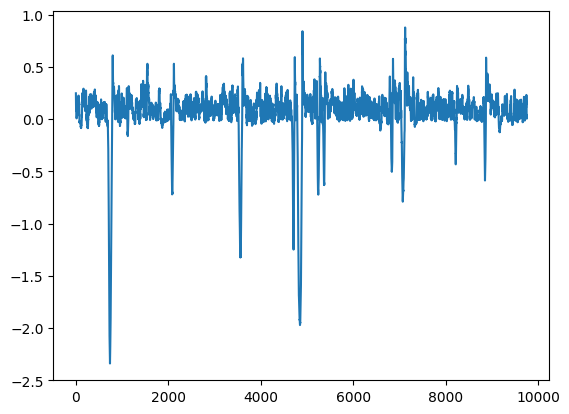

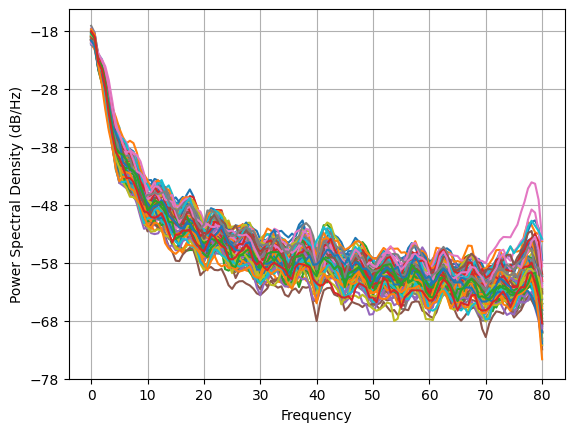

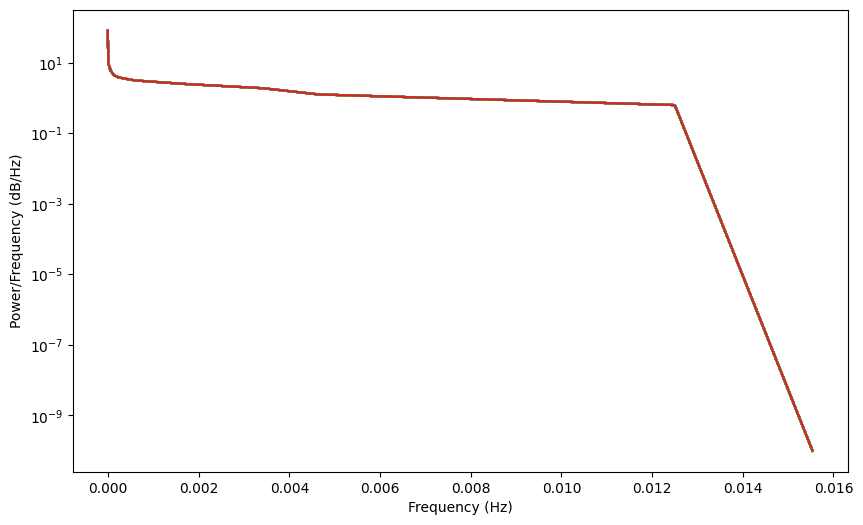

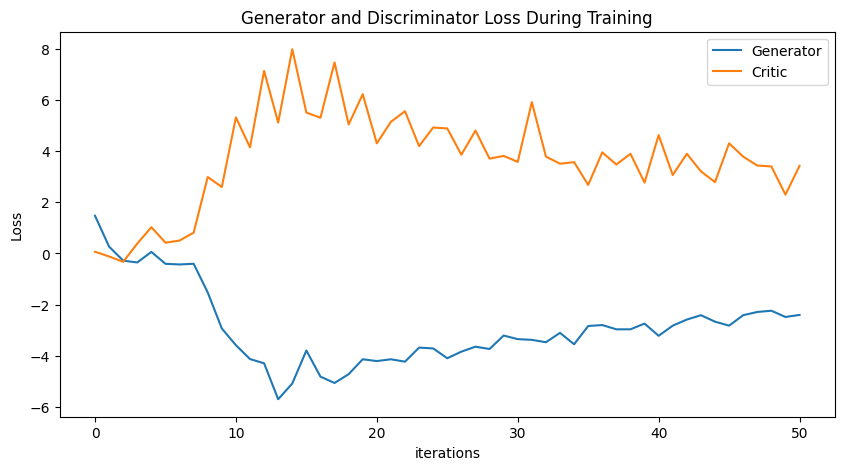

Epoch 100: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

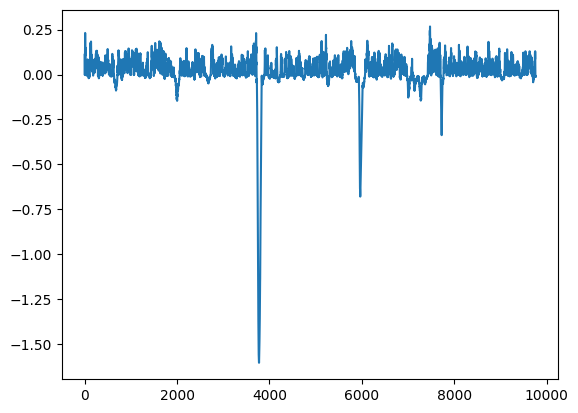

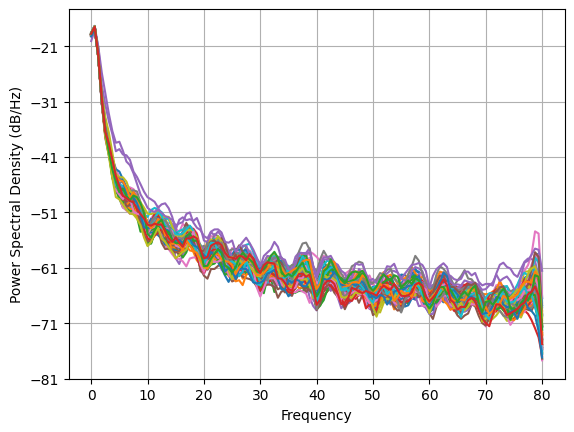

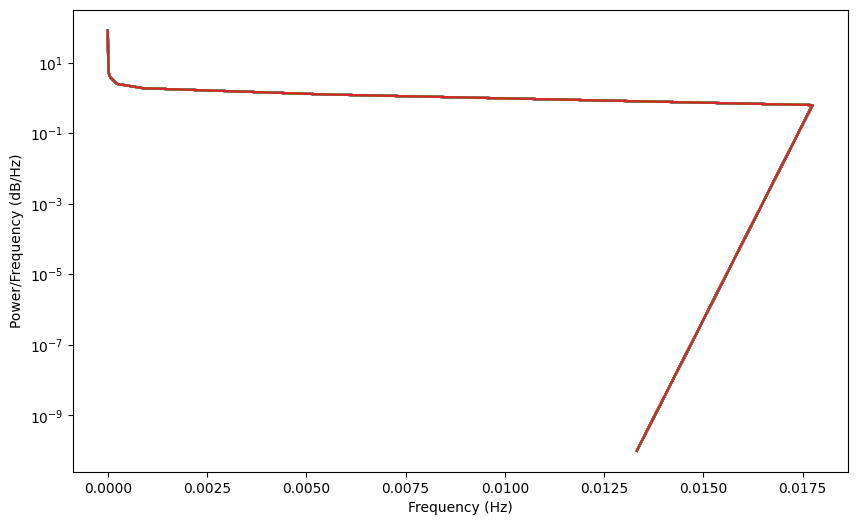

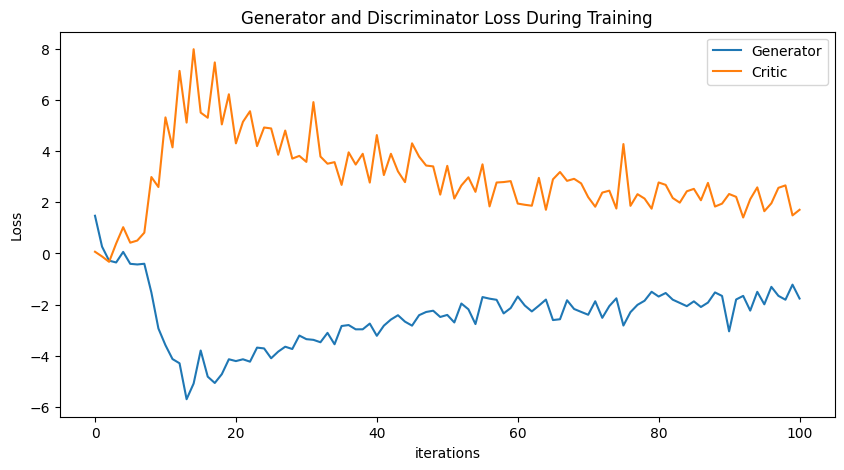

Epoch 150: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

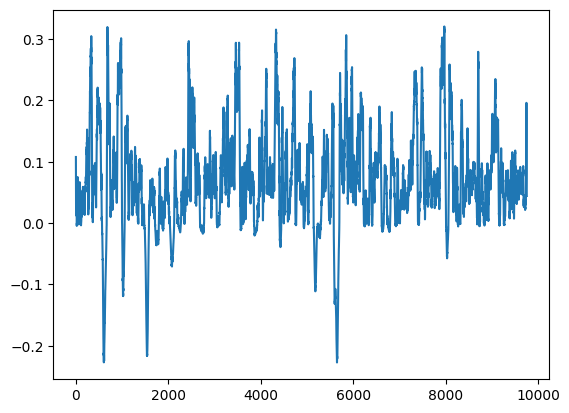

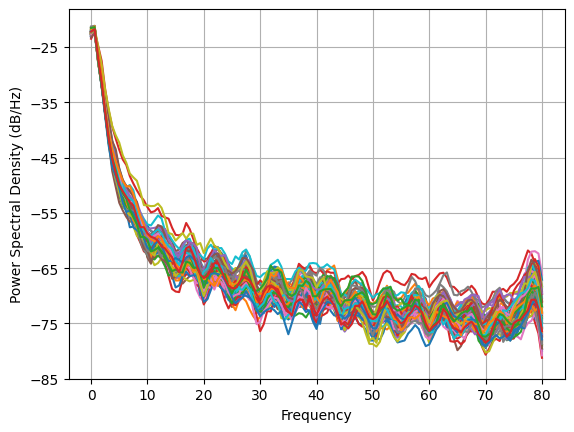

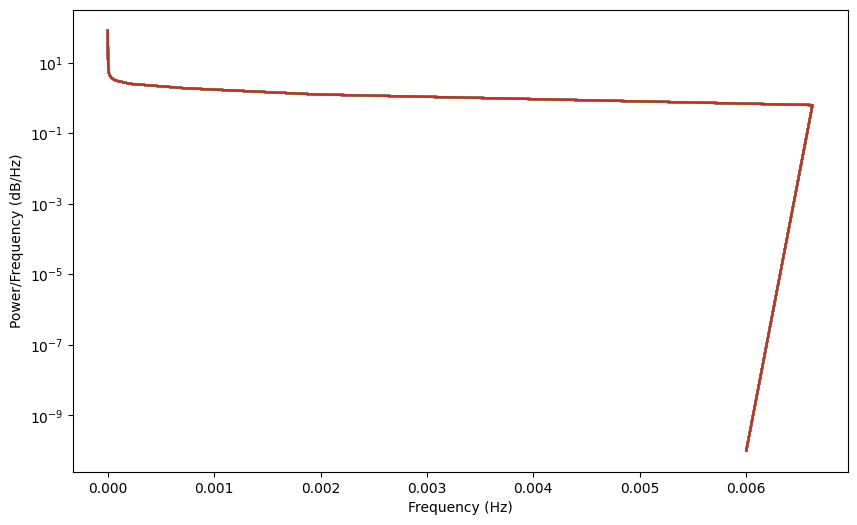

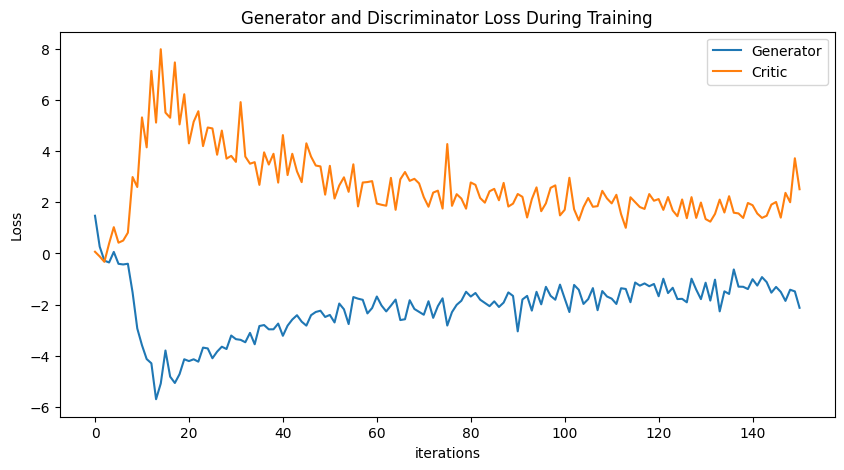

Epoch 200: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

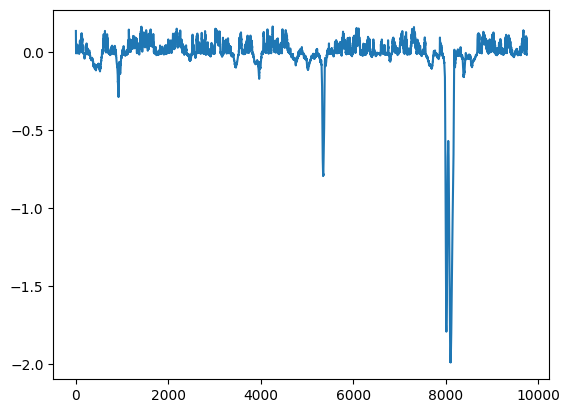

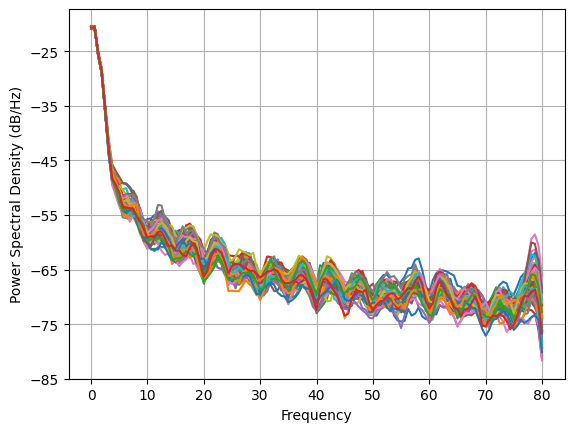

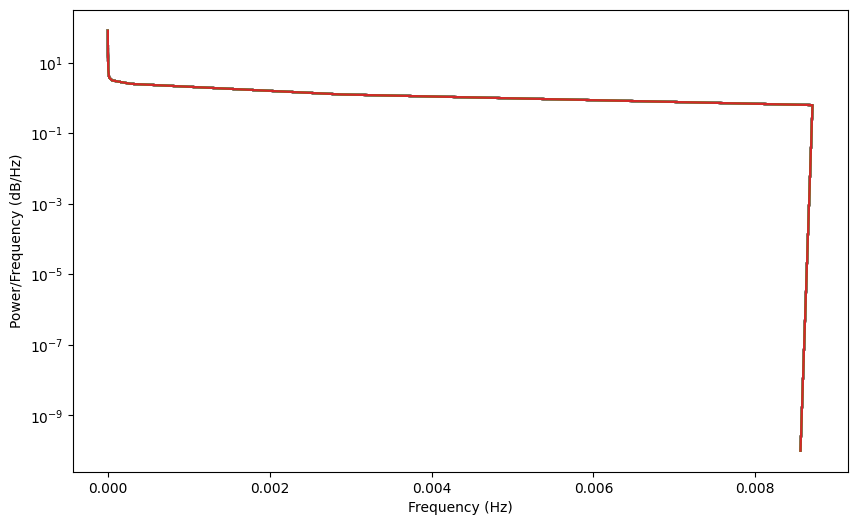

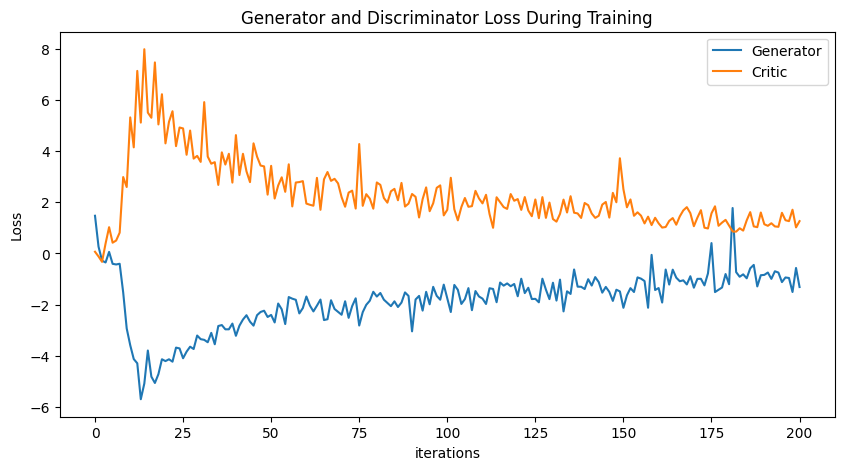

Epoch 250: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

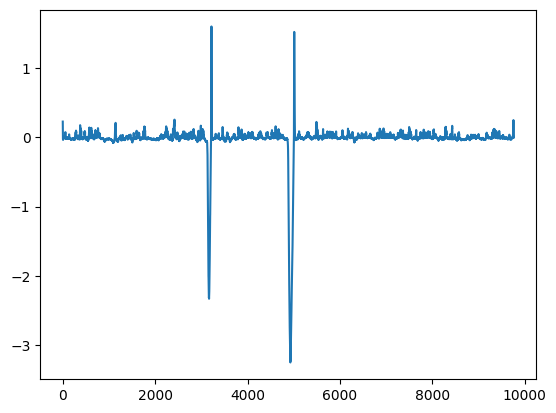

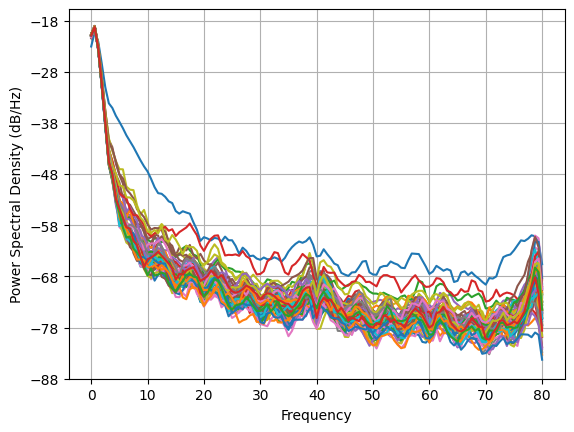

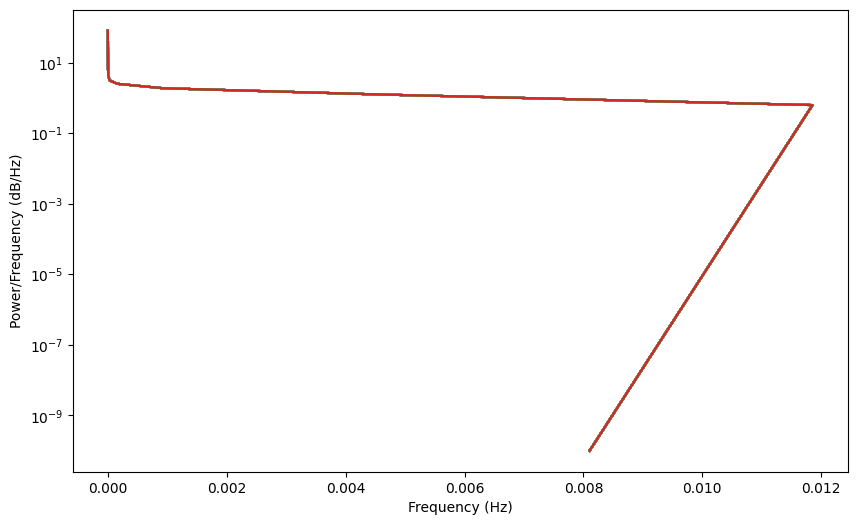

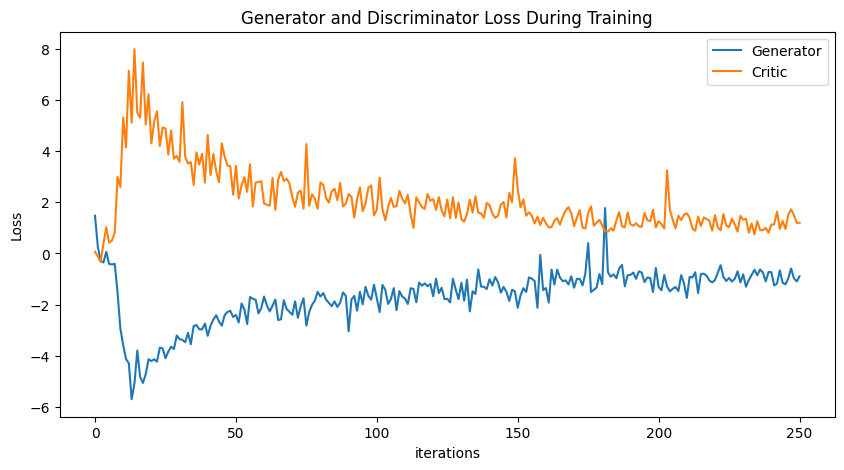

Epoch 300: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

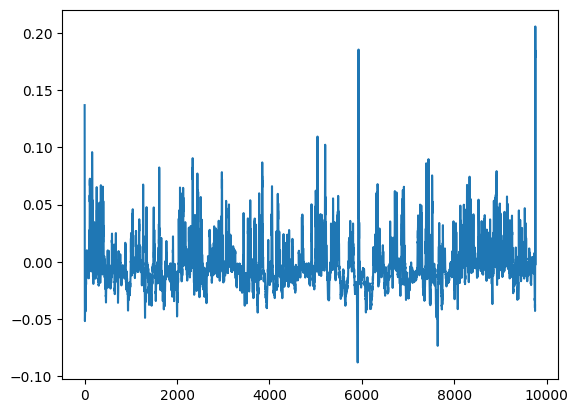

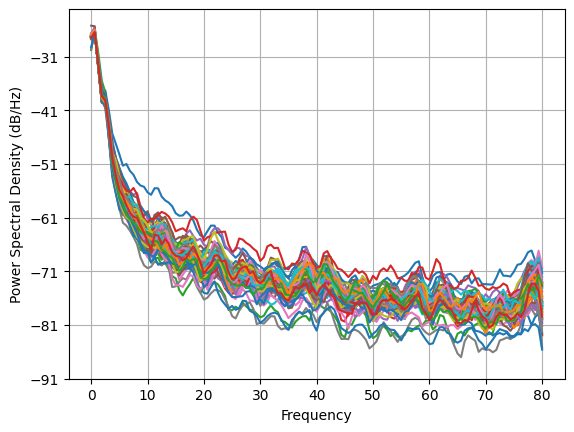

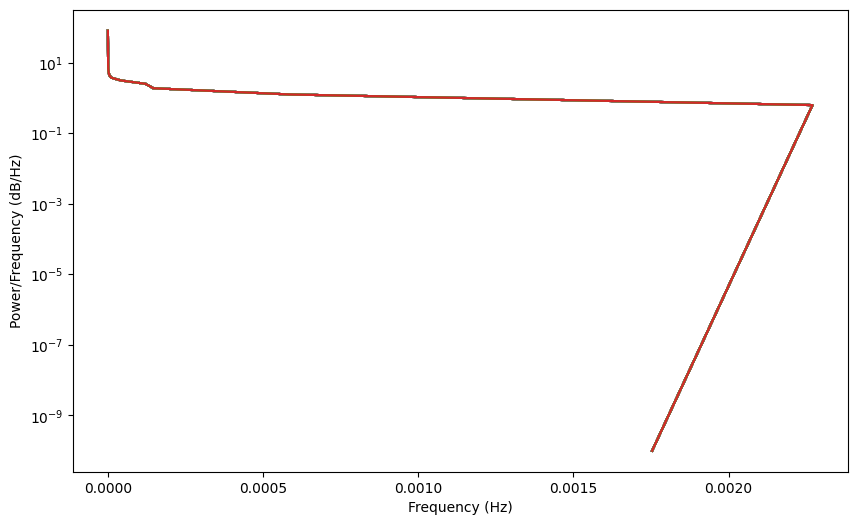

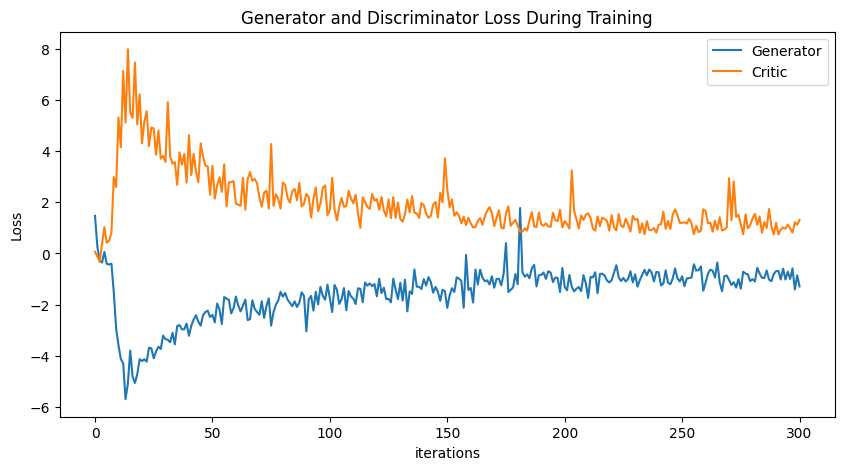

Epoch 350: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

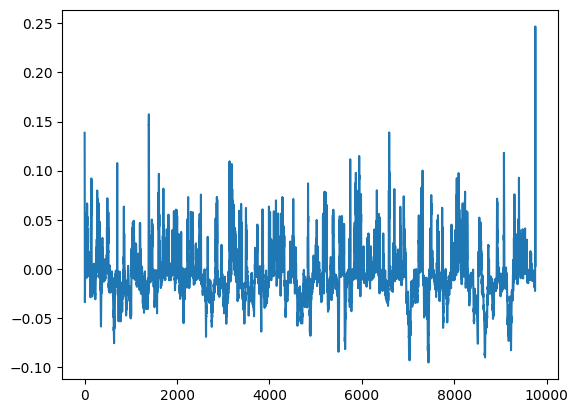

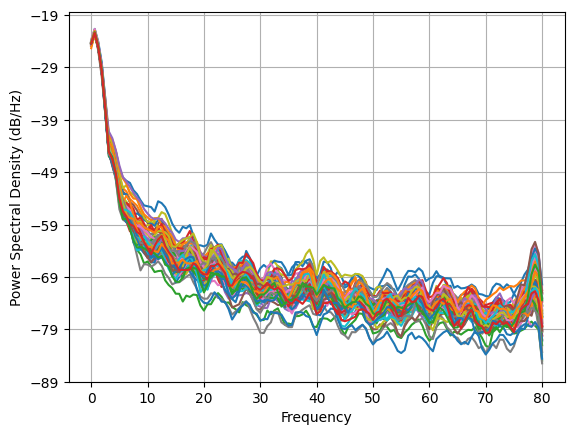

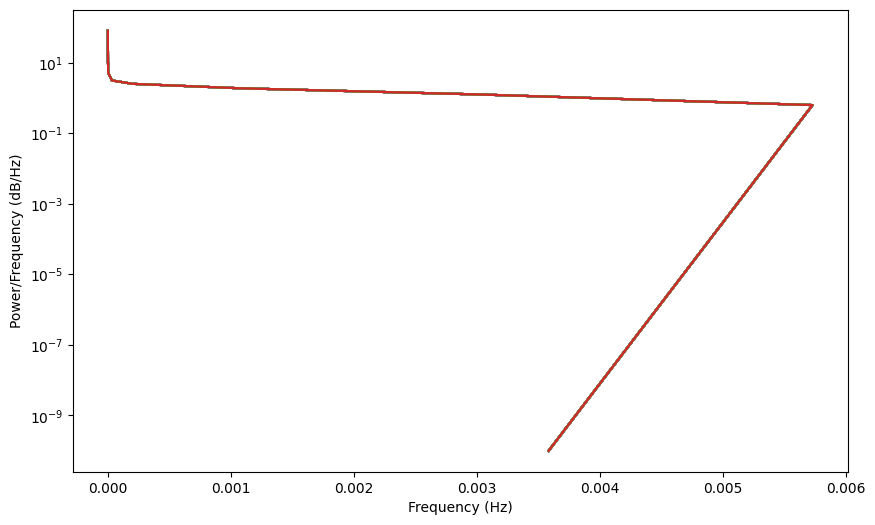

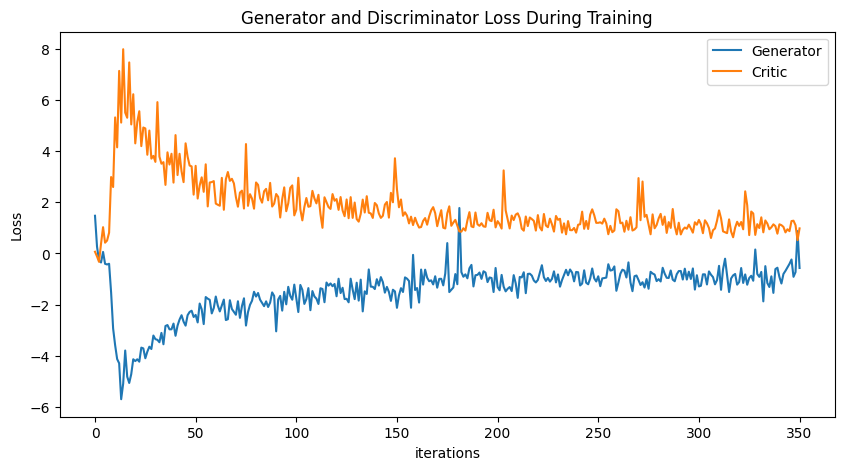

Epoch 400: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

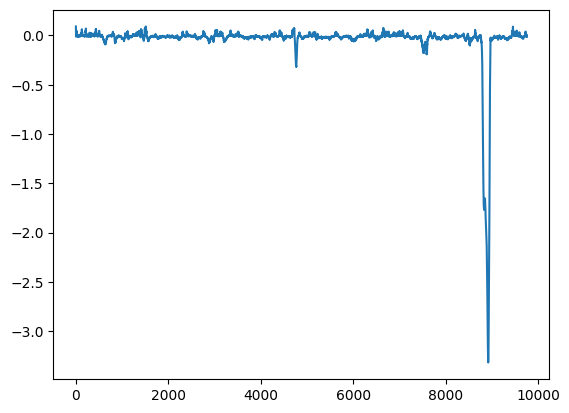

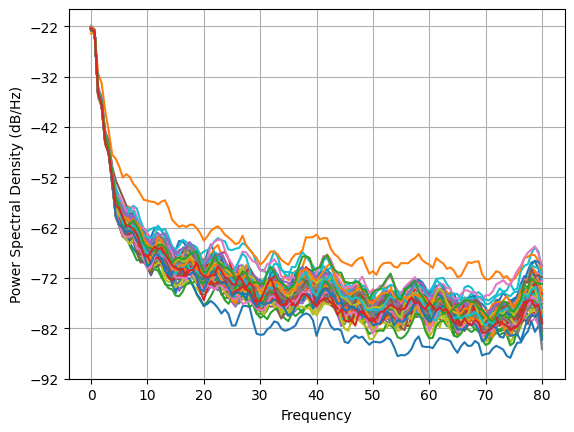

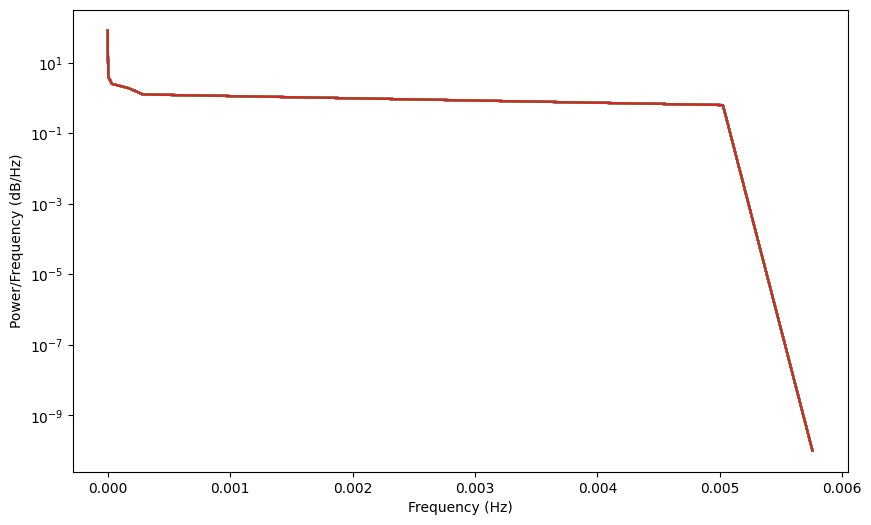

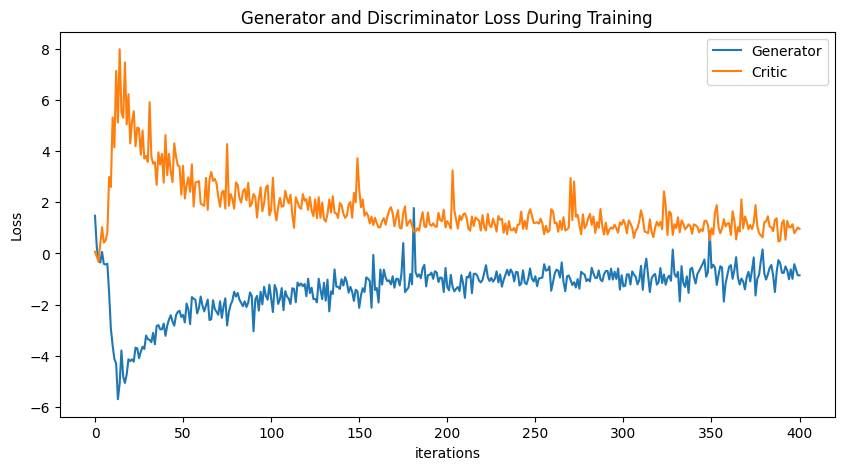

Epoch 450: Critic error ([1.470736524978141, 0.2639066199602171, -0.283493429909925, -0.35432546576338975, 0.058338406555564944, -0.4071809825764751, -0.4323206932724294, -0.4048086295033364, -1.5254356261036457, -2.9338737026876203, -3.587431829009547, -4.128455591913756, -4.294279408158449, -5.698063036301258, -5.083939007038968, -3.7946875947753624, -4.8161327021082645, -5.063263802855618, -4.718919367545842, -4.136496248419533, -4.207951983822339, -4.13732371456191, -4.2308140667174445, -3.6814337757301634, -3.712941936438271, -4.097334422435768, -3.838990521158254, -3.64594530516784, -3.7358084141263355, -3.2096050249256614, -3.3509208237096875, -3.377921483481046, -3.4719153097668576, -3.1053534116168064, -3.550423644810923, -2.837338866242507, -2.799970719167416, -2.9668175706590985, -2.9660678525794806, -2.742451892877597, -3.219660821034079, -2.8238043447632553, -2.5849082223409, -2.415703993994366, -2.6673406151360064, -2.8230065248838825, -2.4142615127849605, -2.288788822307

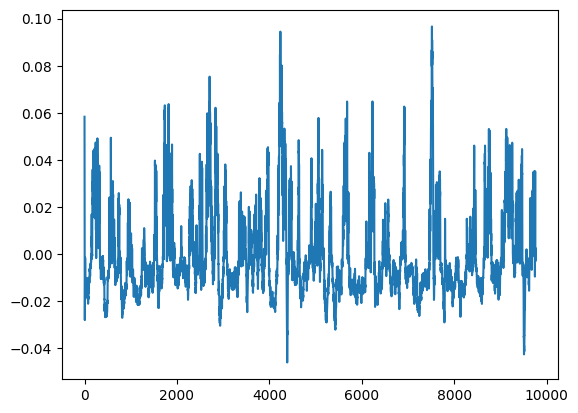

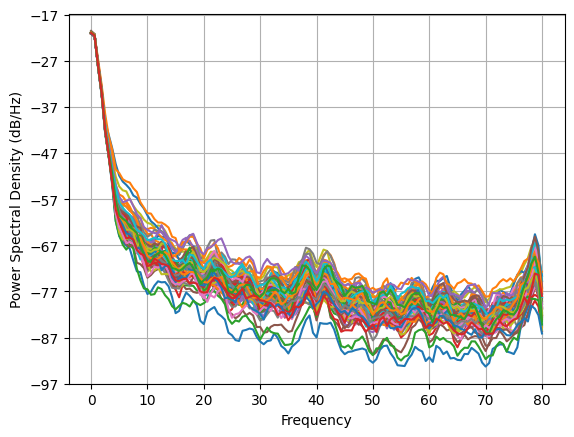

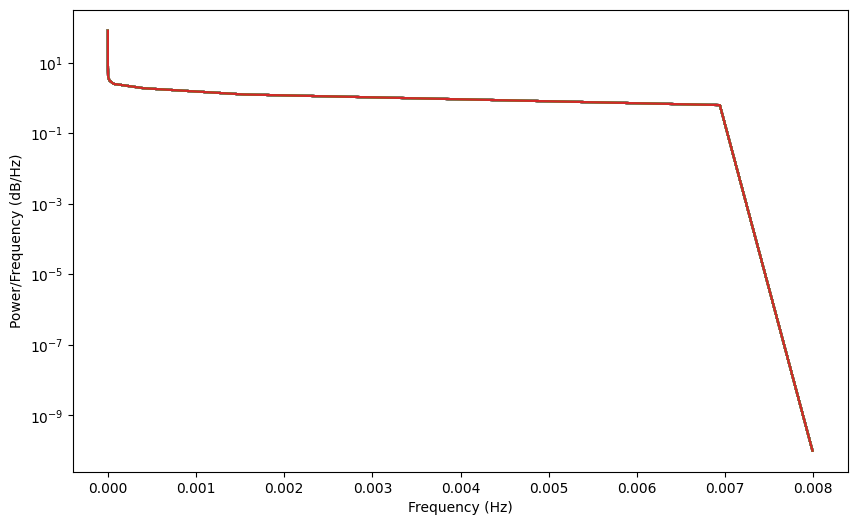

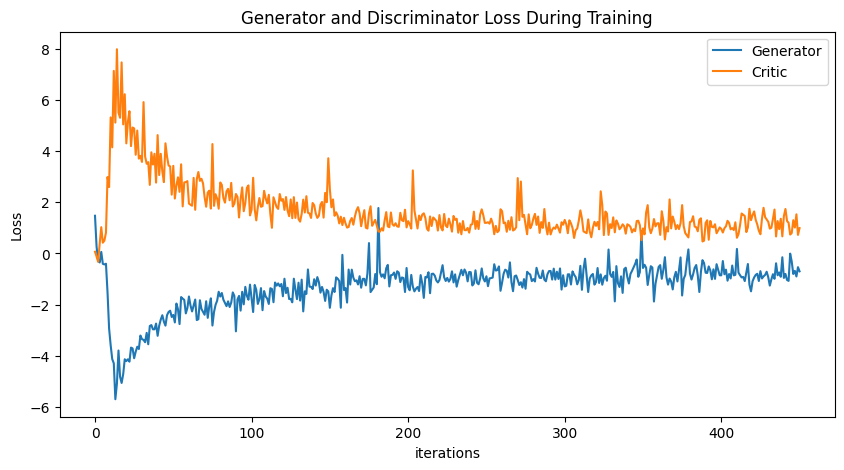

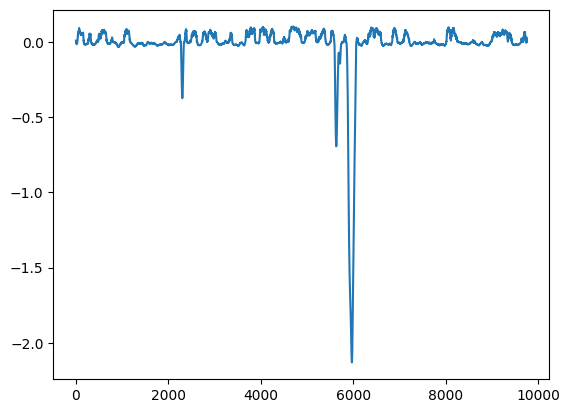

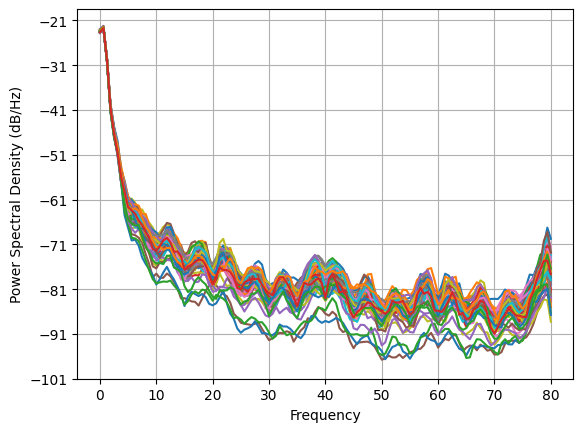

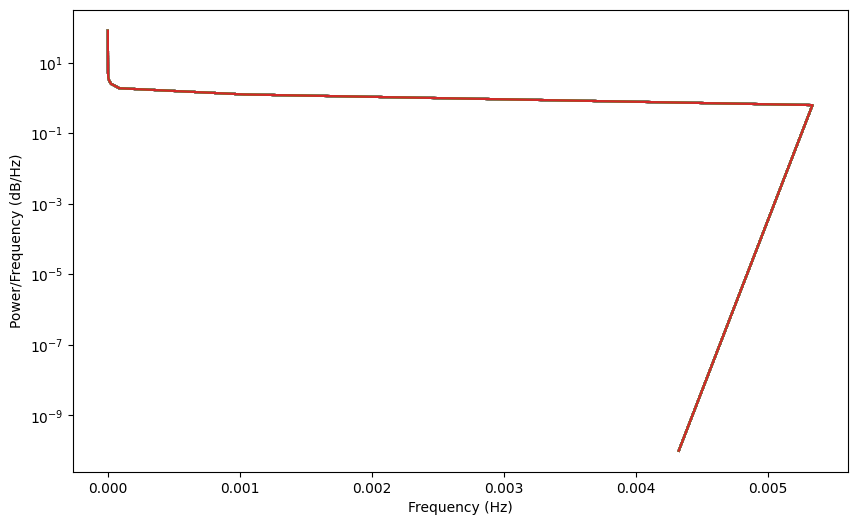

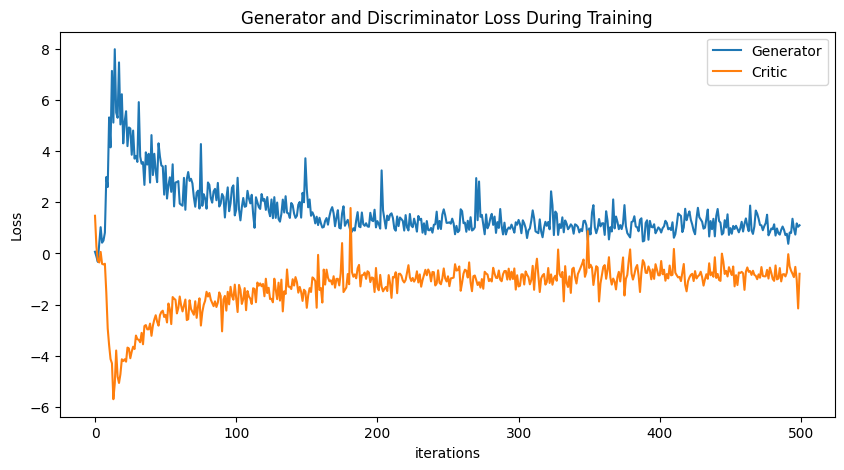

In [7]:
NUM_EPOCHS = 500
PRINT_INTERVAL = 50

train_data = TensorDataset(torch.tensor(training_data_open).detach())
train_loader = DataLoader(train_data, batch_size=10, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def gradient_penalty_custom(D, real, fake, batch):
    alpha = torch.rand((batch, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for i, (real,) in enumerate(train_loader):
            D.zero_grad()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)

            noise = sample_normal_distribution(real.size(0), 120, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty_custom(D, real, fake, real.size(0)) * LAMBDA_GP
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()            

            if i % 4 == 0:
                G.zero_grad()
                noise = sample_normal_distribution(real.size(0), 120, 305)
                fake = G(noise)
                gen_fake = D(fake).reshape(-1)
                loss_gen = -torch.mean(gen_fake)
                loss_gen.backward()
                gen_optimizer.step()
        
        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_5, disc, gen = train()

torch.save(gen, 'genv3_5.pt')
torch.save(disc, 'discv3_5.pt')

plot_everything(generated_data_5, gen_err, critic_err)







# NORMALIZED






eyes open


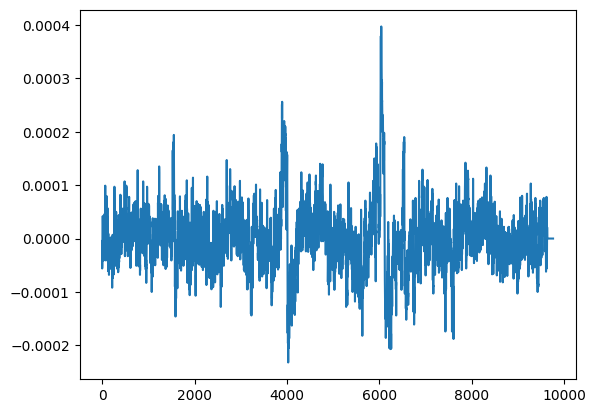

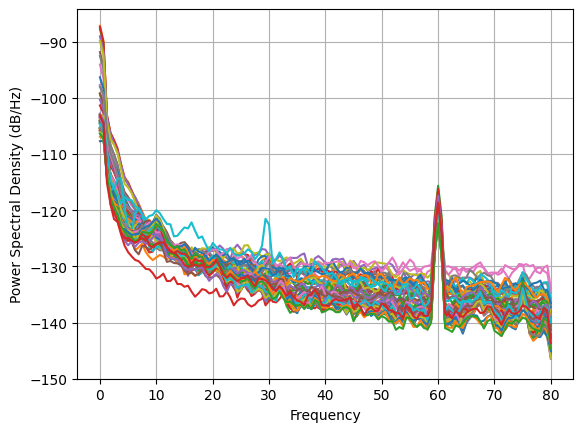

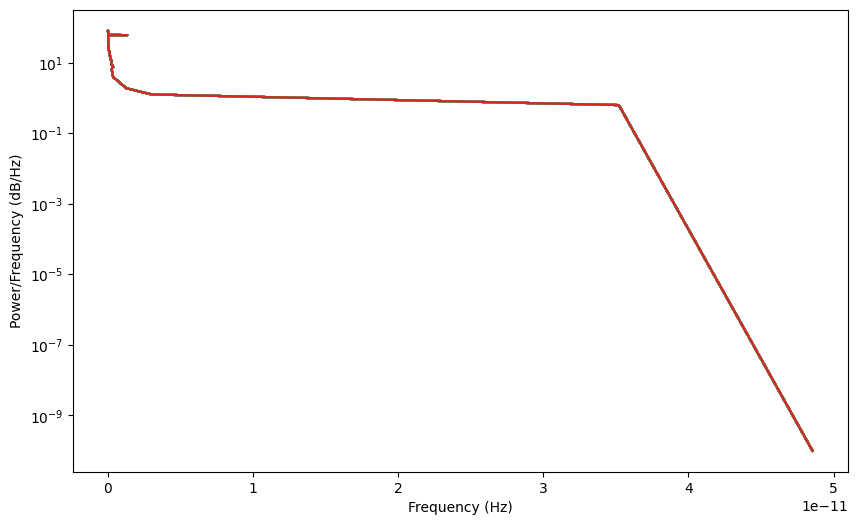

eyes open normalized


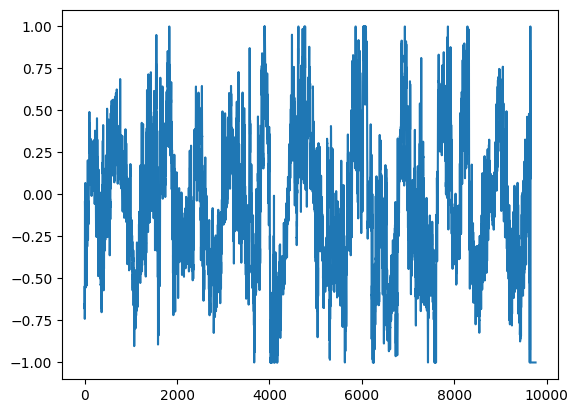

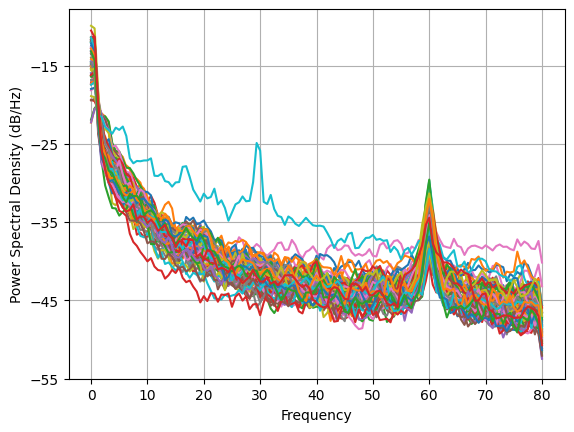

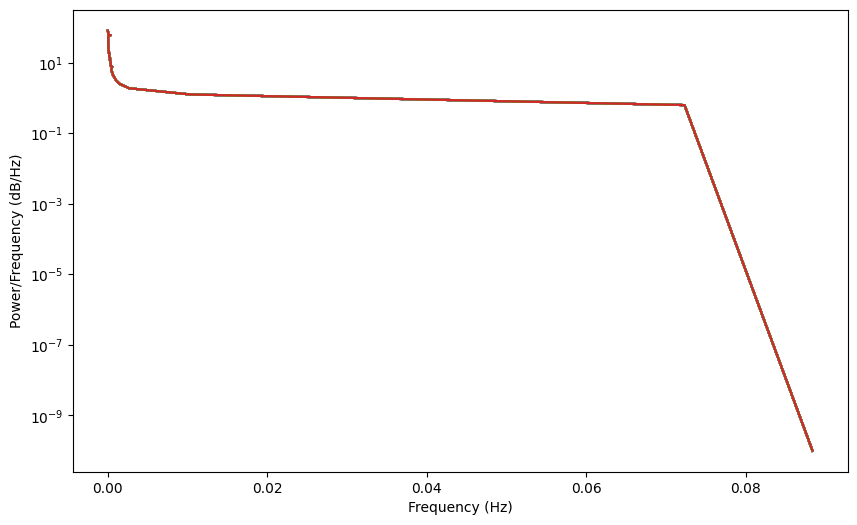

eyes closed


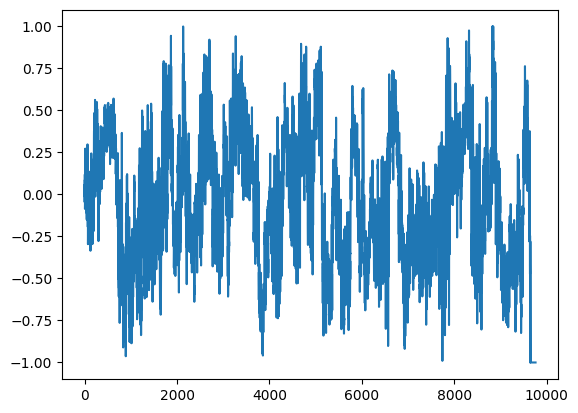

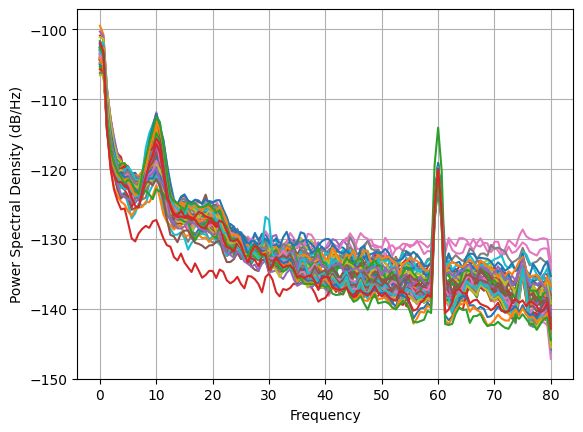

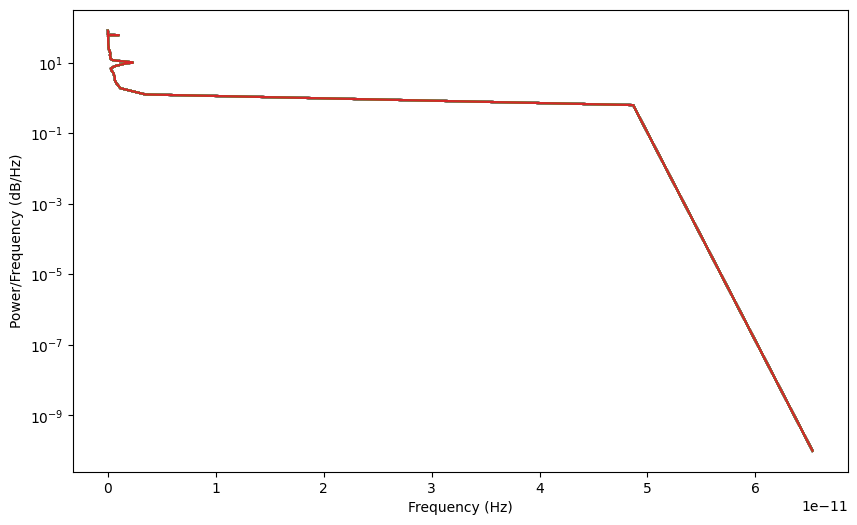

eyes closed normalized


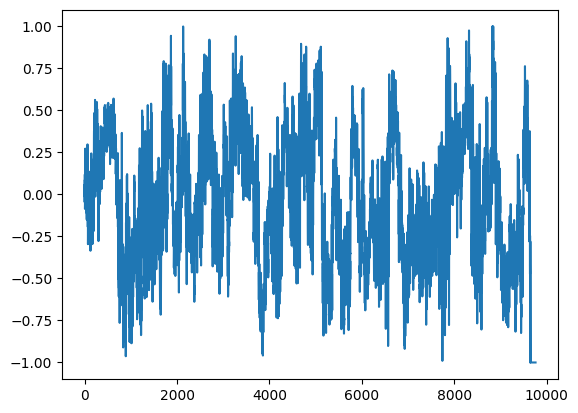

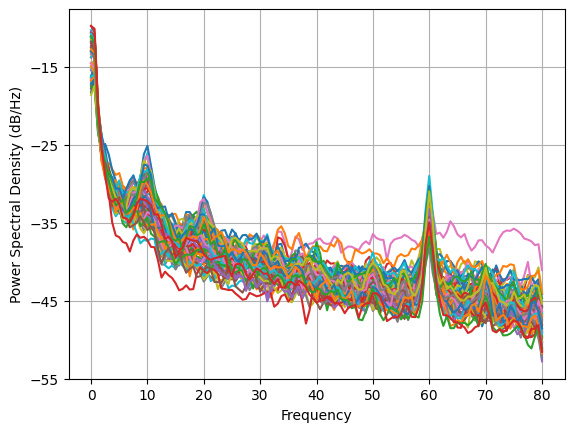

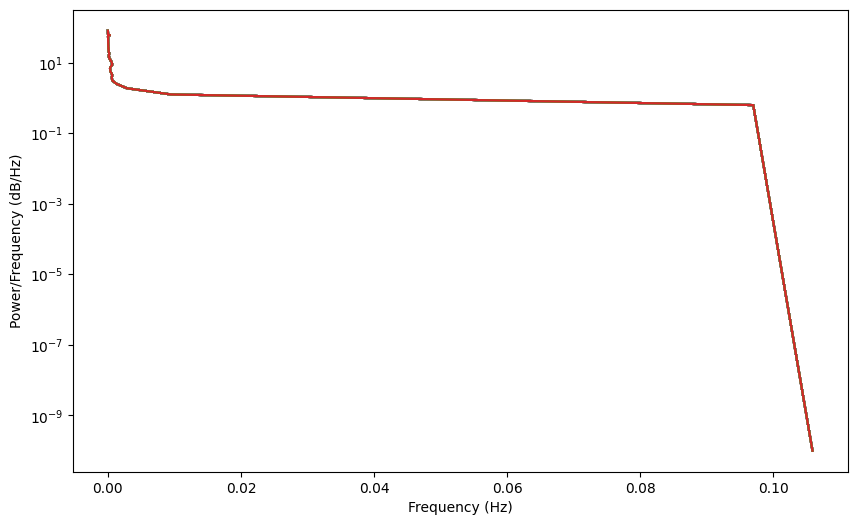

In [2]:
# Normalize the data (OPEN)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_open = np.zeros_like(training_data_open)
for i in range(training_data_open.shape[1]):
    scaler = scaler.fit(training_data_open[:, i])
    normalized_data_open[:, i] = scaler.transform(training_data_open[:, i])

print("eyes open")
plt.plot(training_data_open[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


print("eyes open normalized")
plt.plot(normalized_data_open[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(normalized_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()








# Normalize the data (CLOSED)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_closed = np.zeros_like(training_data_closed)
for i in range(training_data_closed.shape[1]):
    scaler = scaler.fit(training_data_closed[:, i])
    normalized_data_closed[:, i] = scaler.transform(training_data_closed[:, i])
    
print("eyes closed")
plt.plot(normalized_data_closed[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


print("eyes closed normalized")
plt.plot(normalized_data_closed[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(normalized_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# Dataloader, Zero grad after optimizer, follow gpt advice
# High hopes
# Normalized
# check this

Epoch 0: Critic error ([2.6616192726023606]) Generator err ([-0.002028871327638626])


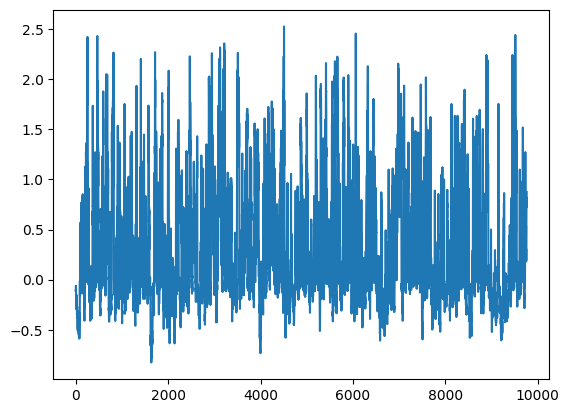

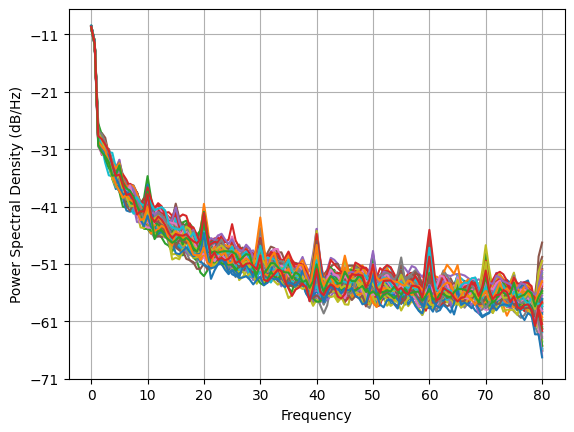

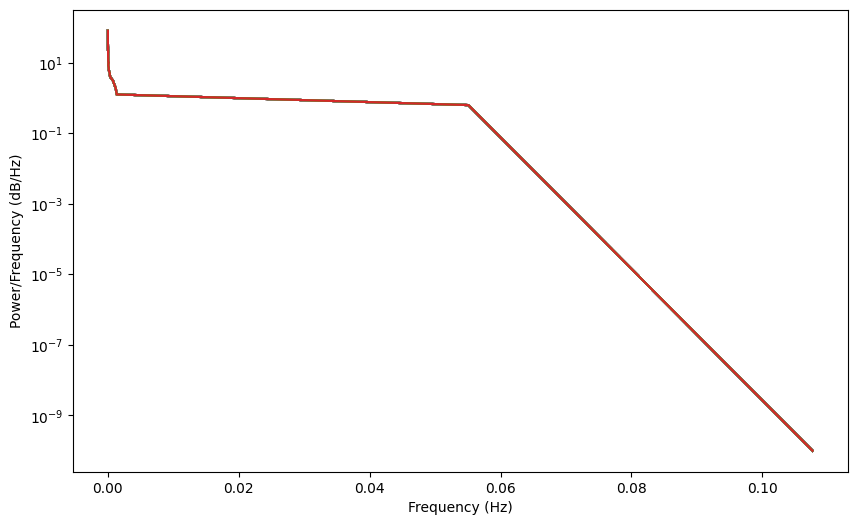

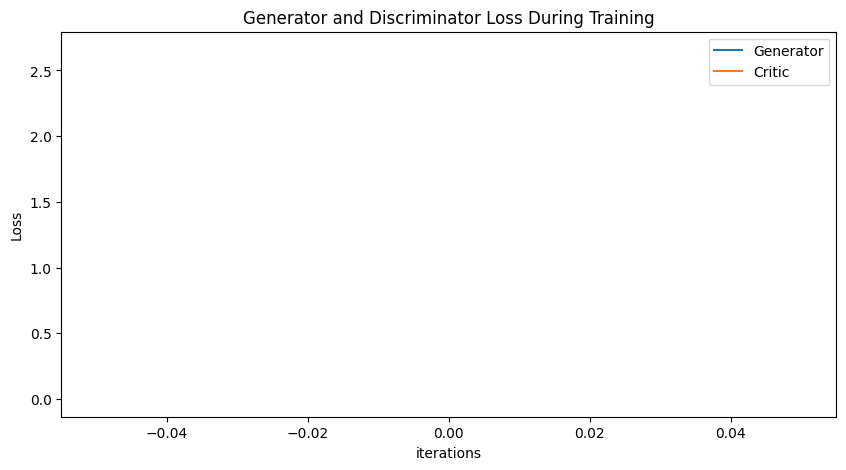

KeyboardInterrupt: 

In [12]:
NUM_EPOCHS = 550
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_open_normalized, disc, gen = train()

torch.save(gen, 'genv3_4_open_norm.pt')
torch.save(disc, 'discv3_4_open_norm.pt')

plot_everything(generated_data_4_open_normalized, gen_err, critic_err)

Epoch 0: Critic error ([2.0735858068827318]) Generator err ([0.027583369985222816])


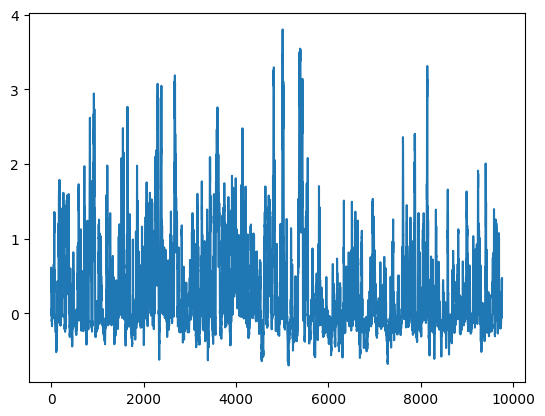

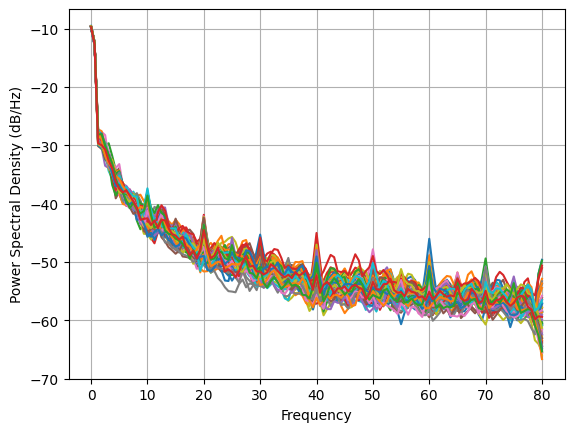

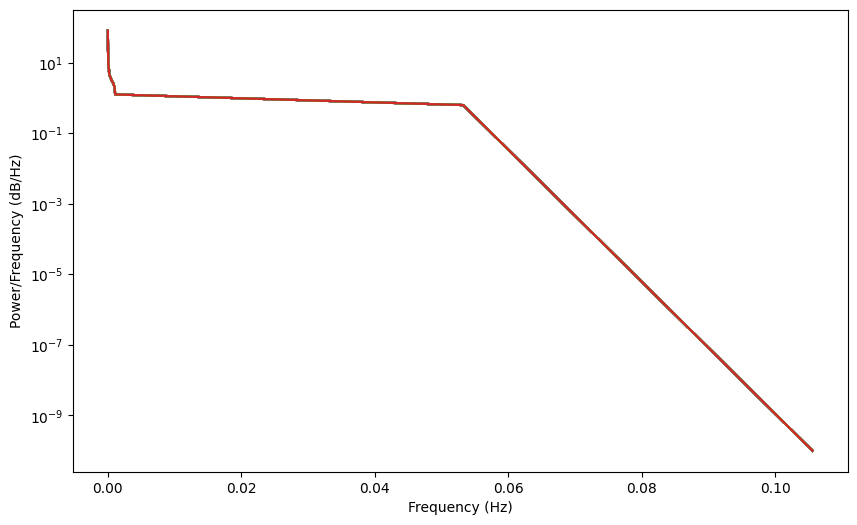

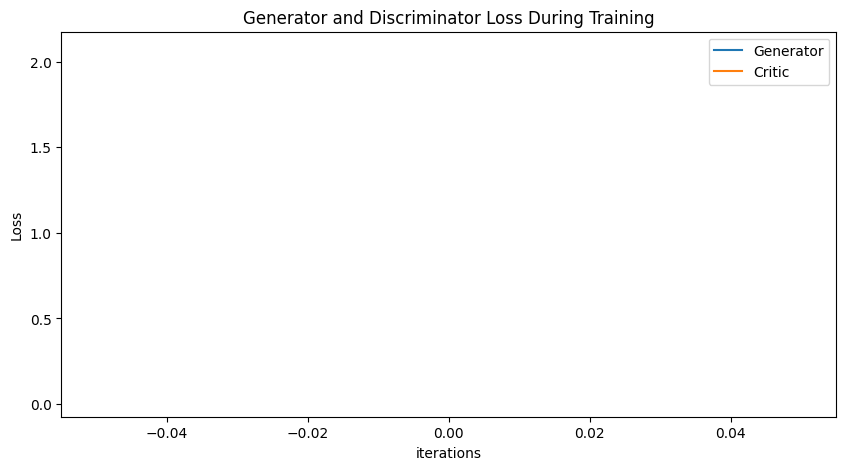

KeyboardInterrupt: 

In [13]:
NUM_EPOCHS = 550
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_closed)[0]

train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)

                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_closed_normalized, disc, gen = train()

torch.save(gen, 'genv3_4_closed_norm.pt')
torch.save(disc, 'discv3_4_closed_norm.pt')

plot_everything(generated_data_4_closed_normalized, gen_err, critic_err)

# more complex input, less upsampling
### nono

Epoch 0: Critic error ([2.1816873283388762]) Generator err ([-0.02296663261950016])


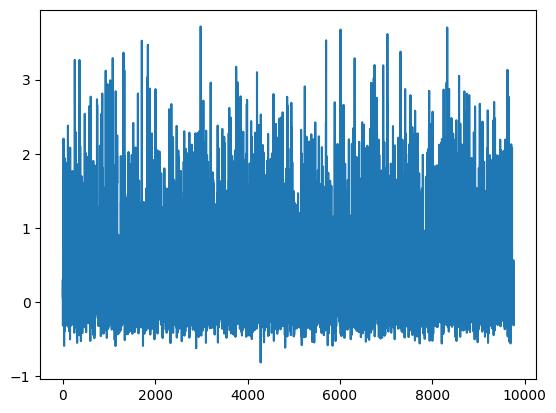

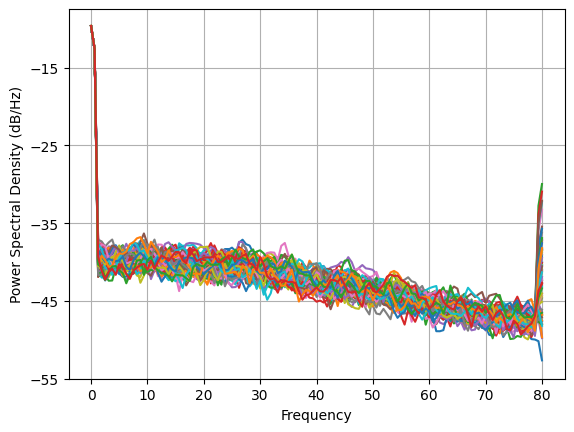

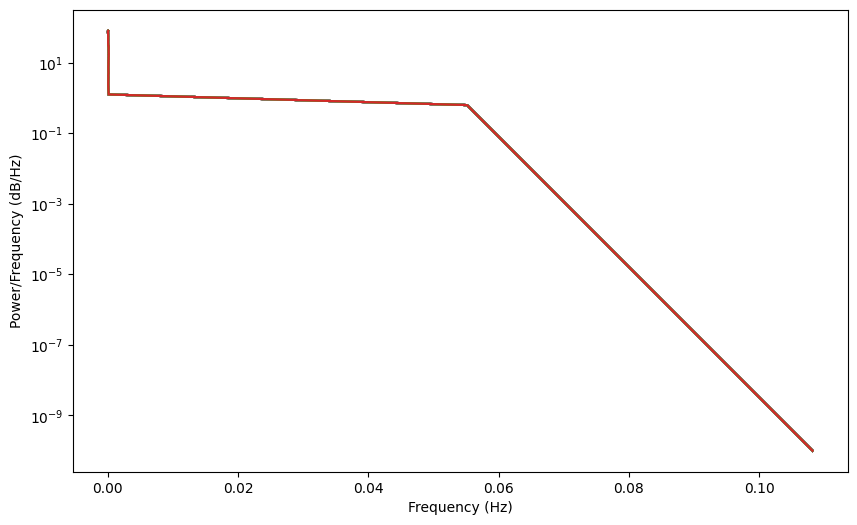

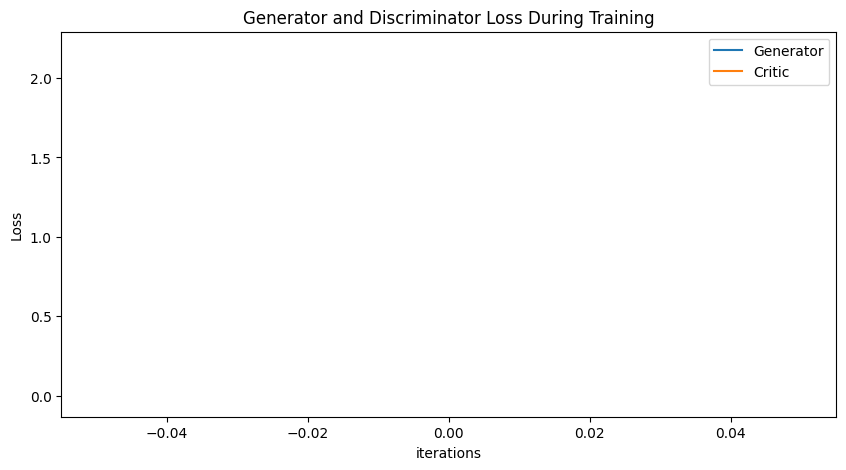

Epoch 50: Critic error ([2.1816873283388762, -0.0015111079030150978, -0.008157077613229615, -0.033826230544182975, -0.04266381538527844, -0.06669766709686019, -0.03992515159789363, -0.04756852969143975, -0.054784639845697966, -0.06463220000756481, -0.060046320808713555, -0.10554119121768957, -0.10665786288945146, -0.15325296919140924, -0.24734039948152123, -0.5567714234009156, -0.338289864955684, -2.0693606544443353, -3.135307365129784, -2.822261041050386, -3.5284185306194313, -3.6481298836156983, -5.259486212419015, -4.597747597636124, -4.395986933865559, -5.563107390155415, -4.800056508631479, -4.624414115523442, -4.883816056824879, -4.380664860559695, -4.035546080253829, -4.400436746212152, -4.037987801662862, -3.518978080511982, -3.745650209557806, -3.1760803611550457, -3.2406759597118193, -2.9150283408775315, -3.0388232720784556, -2.764542131946775, -3.1610234770522805, -3.0753083140746647, -3.2334688822750524, -3.1834134019368303, -3.3329317458194803, -3.2952617107537714, -3.1925

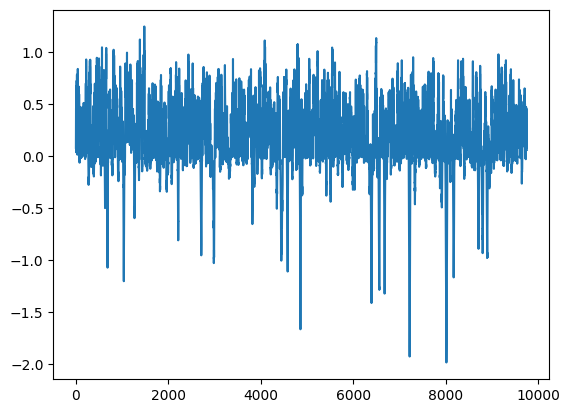

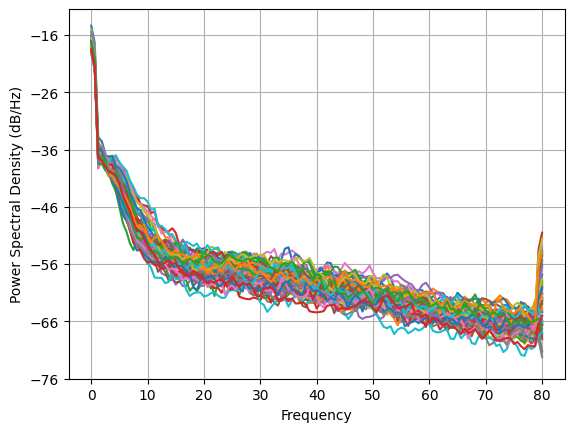

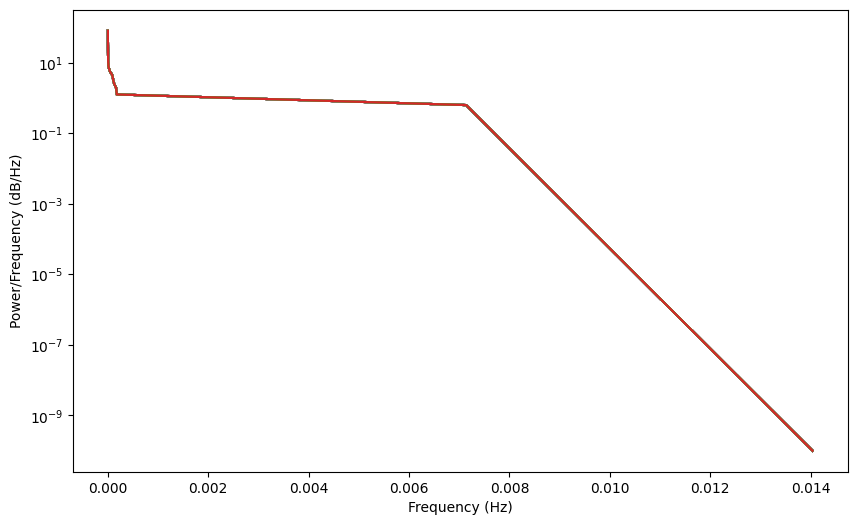

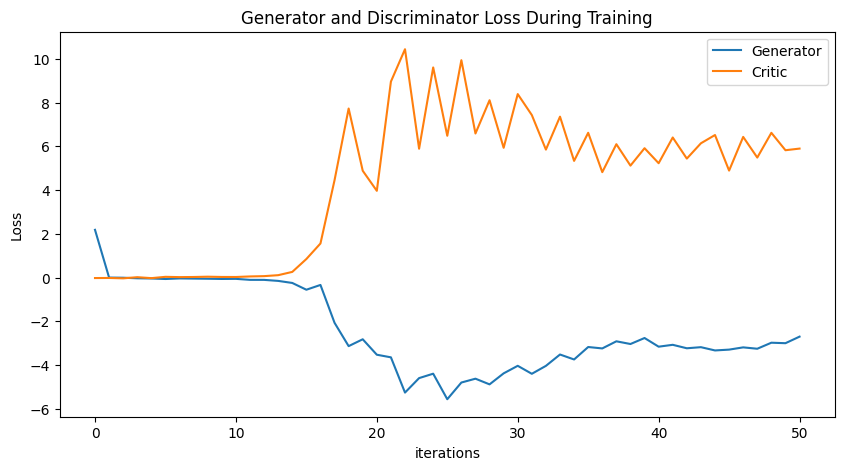

Epoch 100: Critic error ([2.1816873283388762, -0.0015111079030150978, -0.008157077613229615, -0.033826230544182975, -0.04266381538527844, -0.06669766709686019, -0.03992515159789363, -0.04756852969143975, -0.054784639845697966, -0.06463220000756481, -0.060046320808713555, -0.10554119121768957, -0.10665786288945146, -0.15325296919140924, -0.24734039948152123, -0.5567714234009156, -0.338289864955684, -2.0693606544443353, -3.135307365129784, -2.822261041050386, -3.5284185306194313, -3.6481298836156983, -5.259486212419015, -4.597747597636124, -4.395986933865559, -5.563107390155415, -4.800056508631479, -4.624414115523442, -4.883816056824879, -4.380664860559695, -4.035546080253829, -4.400436746212152, -4.037987801662862, -3.518978080511982, -3.745650209557806, -3.1760803611550457, -3.2406759597118193, -2.9150283408775315, -3.0388232720784556, -2.764542131946775, -3.1610234770522805, -3.0753083140746647, -3.2334688822750524, -3.1834134019368303, -3.3329317458194803, -3.2952617107537714, -3.192

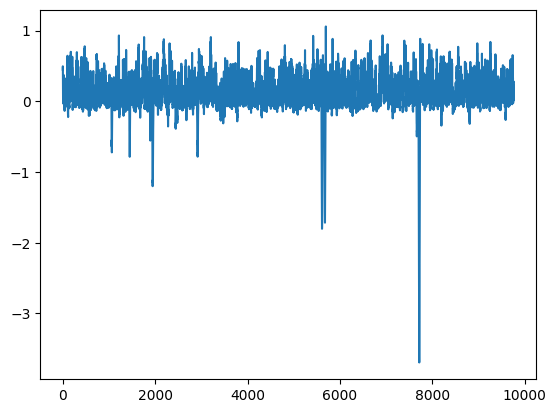

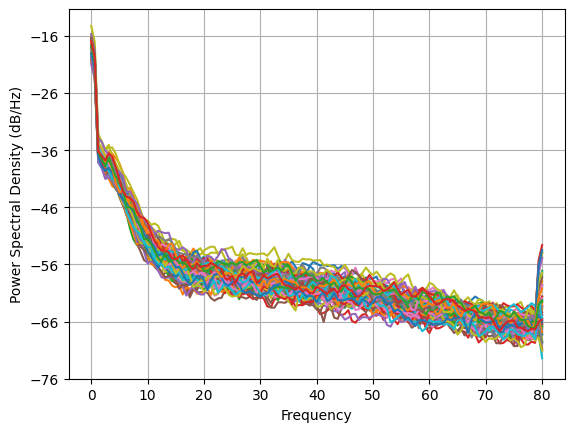

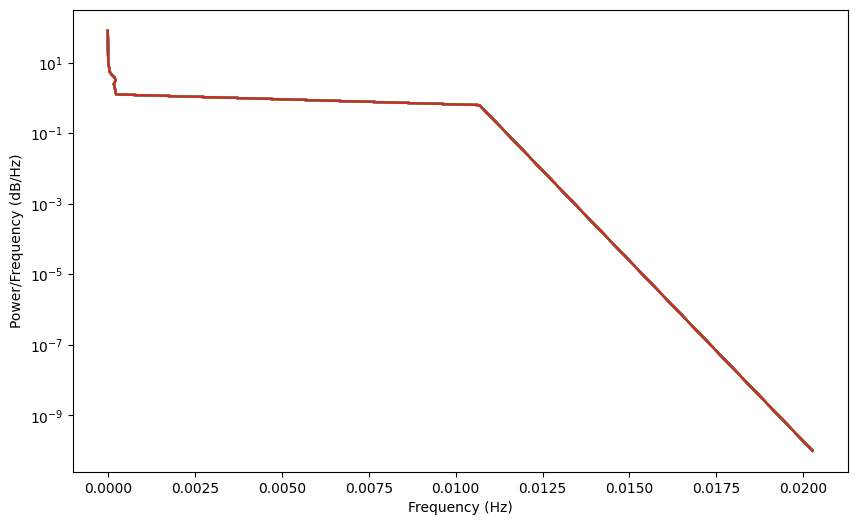

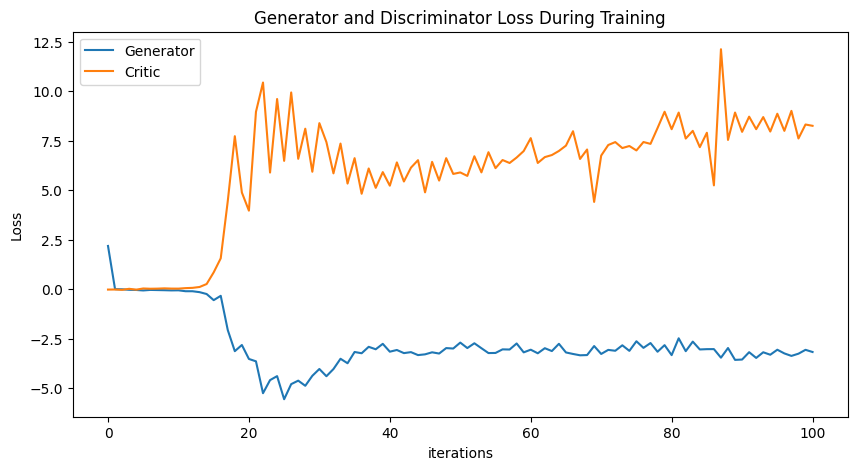

Epoch 150: Critic error ([2.1816873283388762, -0.0015111079030150978, -0.008157077613229615, -0.033826230544182975, -0.04266381538527844, -0.06669766709686019, -0.03992515159789363, -0.04756852969143975, -0.054784639845697966, -0.06463220000756481, -0.060046320808713555, -0.10554119121768957, -0.10665786288945146, -0.15325296919140924, -0.24734039948152123, -0.5567714234009156, -0.338289864955684, -2.0693606544443353, -3.135307365129784, -2.822261041050386, -3.5284185306194313, -3.6481298836156983, -5.259486212419015, -4.597747597636124, -4.395986933865559, -5.563107390155415, -4.800056508631479, -4.624414115523442, -4.883816056824879, -4.380664860559695, -4.035546080253829, -4.400436746212152, -4.037987801662862, -3.518978080511982, -3.745650209557806, -3.1760803611550457, -3.2406759597118193, -2.9150283408775315, -3.0388232720784556, -2.764542131946775, -3.1610234770522805, -3.0753083140746647, -3.2334688822750524, -3.1834134019368303, -3.3329317458194803, -3.2952617107537714, -3.192

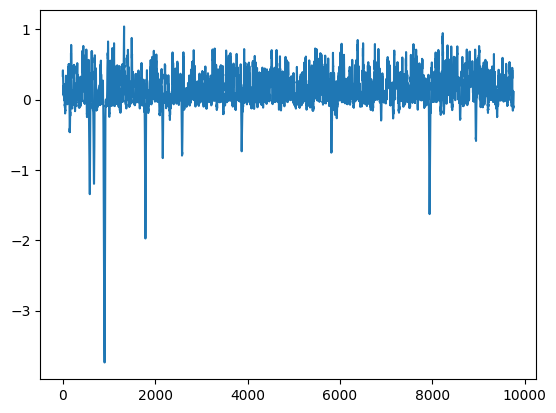

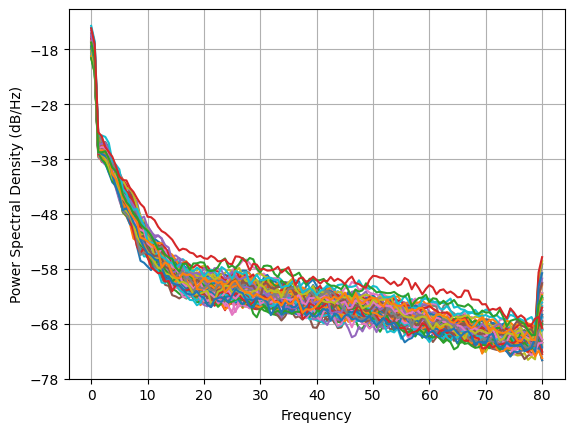

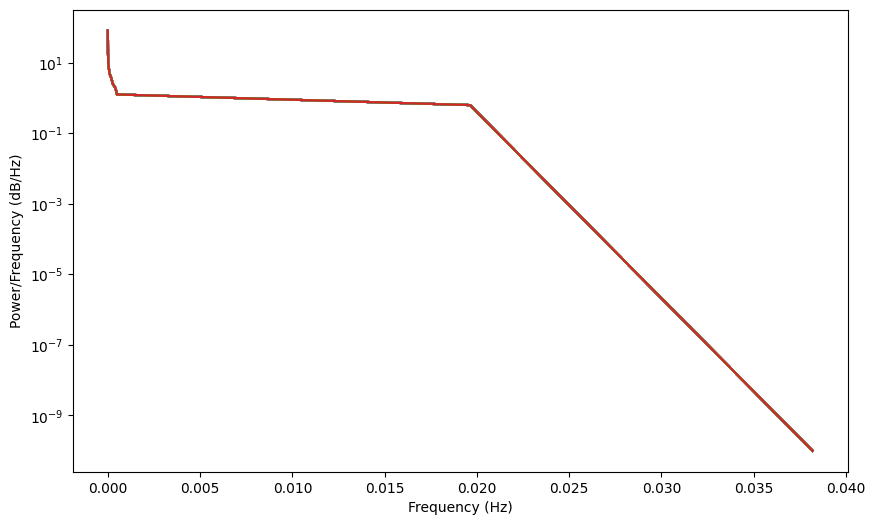

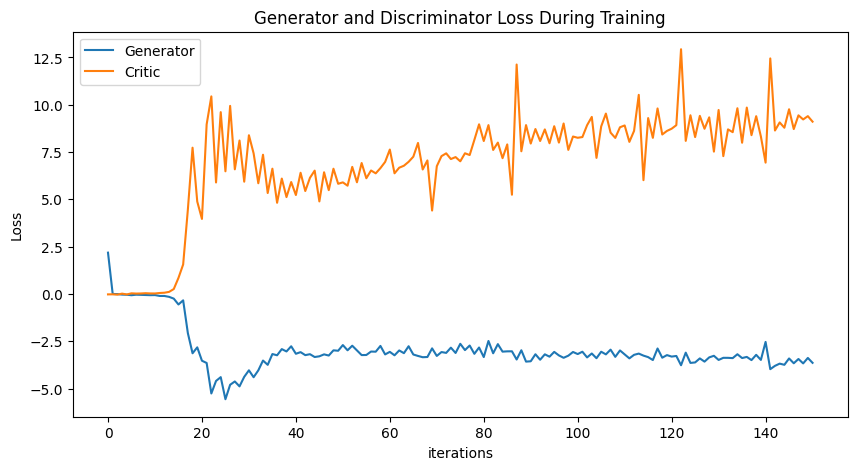

Epoch 200: Critic error ([2.1816873283388762, -0.0015111079030150978, -0.008157077613229615, -0.033826230544182975, -0.04266381538527844, -0.06669766709686019, -0.03992515159789363, -0.04756852969143975, -0.054784639845697966, -0.06463220000756481, -0.060046320808713555, -0.10554119121768957, -0.10665786288945146, -0.15325296919140924, -0.24734039948152123, -0.5567714234009156, -0.338289864955684, -2.0693606544443353, -3.135307365129784, -2.822261041050386, -3.5284185306194313, -3.6481298836156983, -5.259486212419015, -4.597747597636124, -4.395986933865559, -5.563107390155415, -4.800056508631479, -4.624414115523442, -4.883816056824879, -4.380664860559695, -4.035546080253829, -4.400436746212152, -4.037987801662862, -3.518978080511982, -3.745650209557806, -3.1760803611550457, -3.2406759597118193, -2.9150283408775315, -3.0388232720784556, -2.764542131946775, -3.1610234770522805, -3.0753083140746647, -3.2334688822750524, -3.1834134019368303, -3.3329317458194803, -3.2952617107537714, -3.192

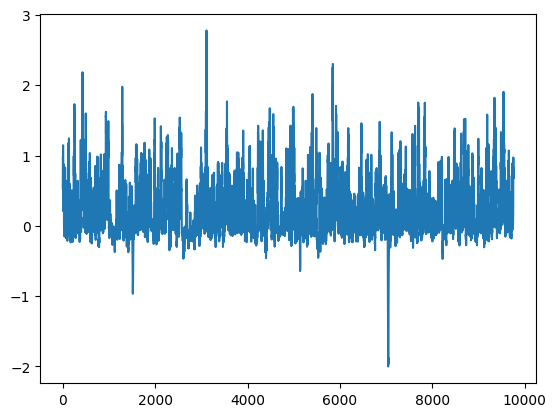

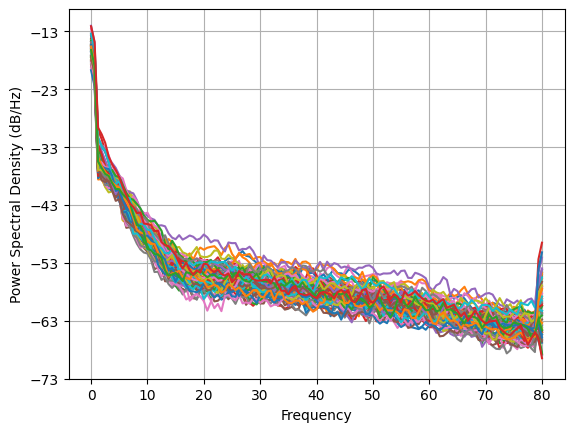

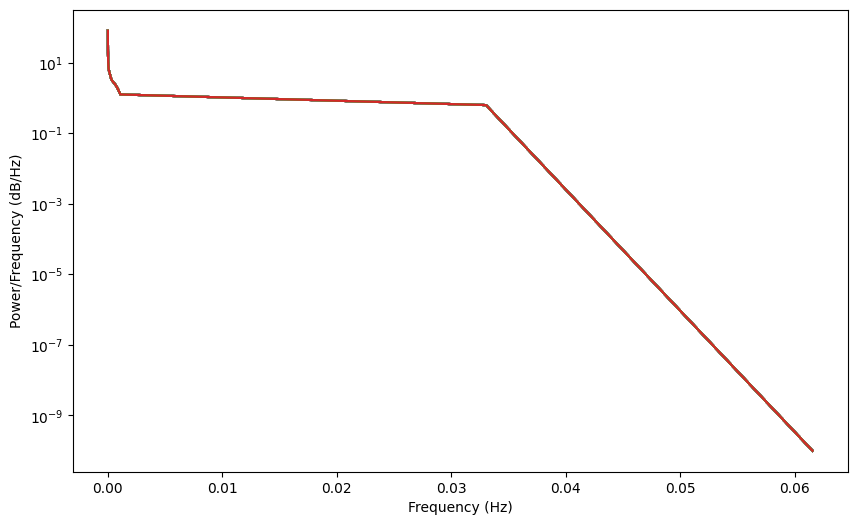

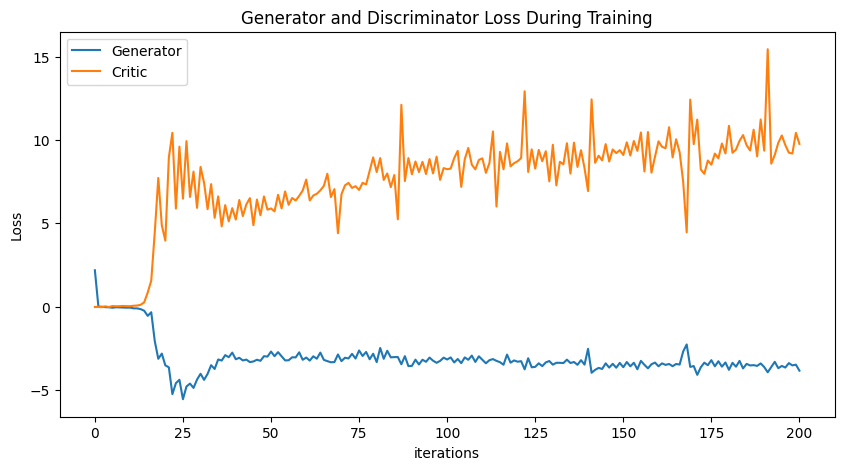

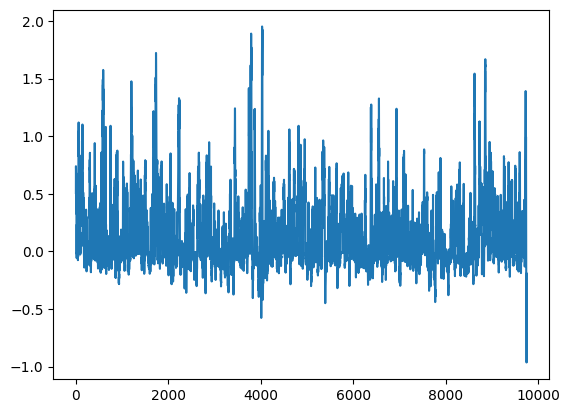

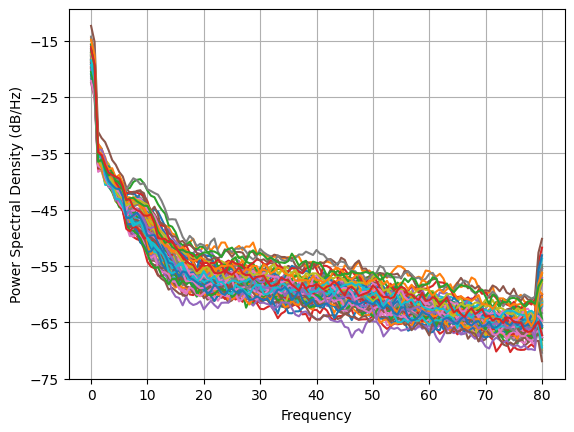

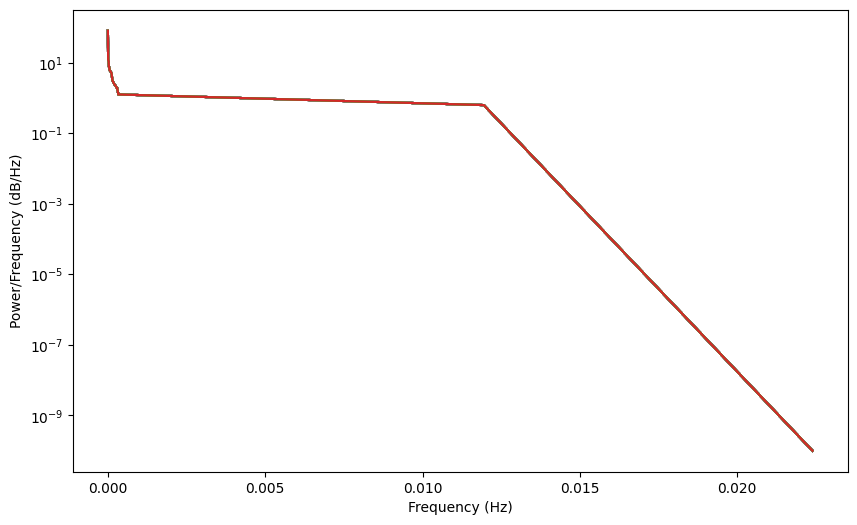

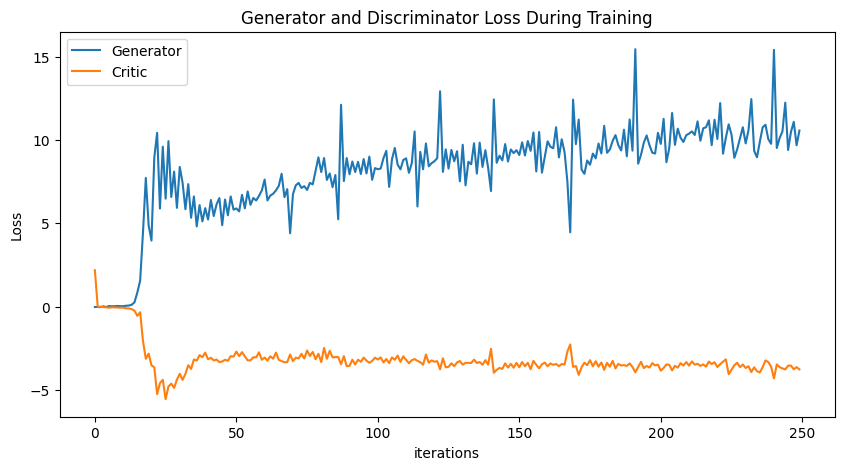

In [9]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            for (real,) in train_loader:
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 64, 4880)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 64, 4880)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_open_normalized, disc, gen = train()

torch.save(gen, 'genv3_new1_open_norm.pt')
torch.save(disc, 'discv3_new1_open_norm.pt')

plot_everything(generated_data_4_open_normalized, gen_err, critic_err)

# Dataloader, Zero grad after optimizer, follow gpt advice
# High hopes
# Normalized
# Tanh into -1/1 on generator
## comparably good to old training method

Epoch 0: Critic error ([1.2291640578927217]) Generator err ([-0.014591830782592297])


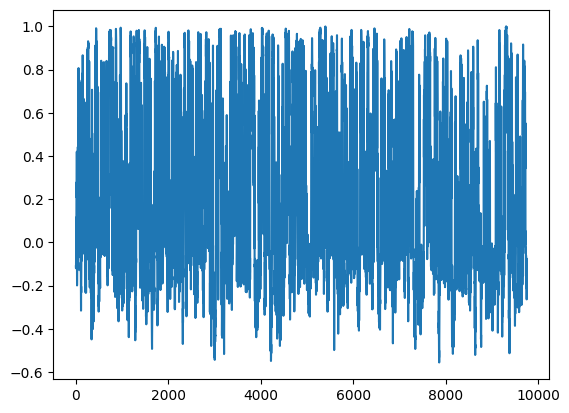

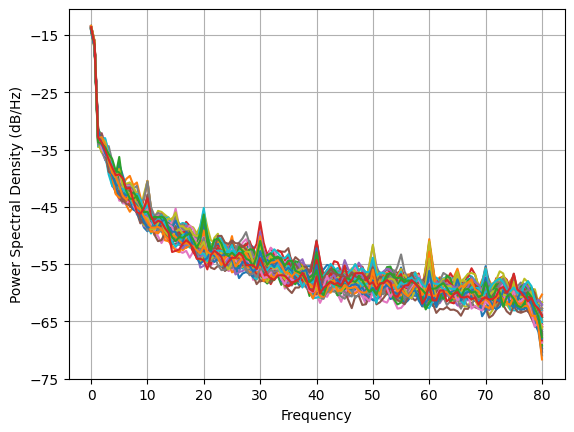

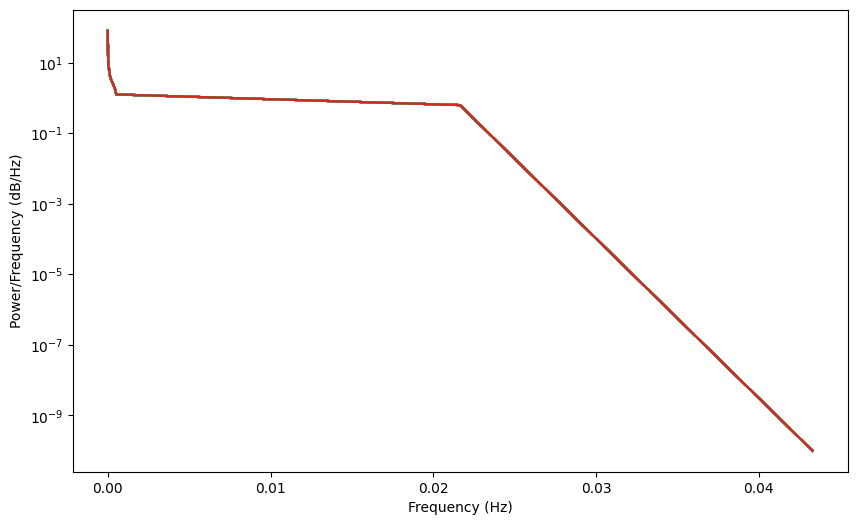

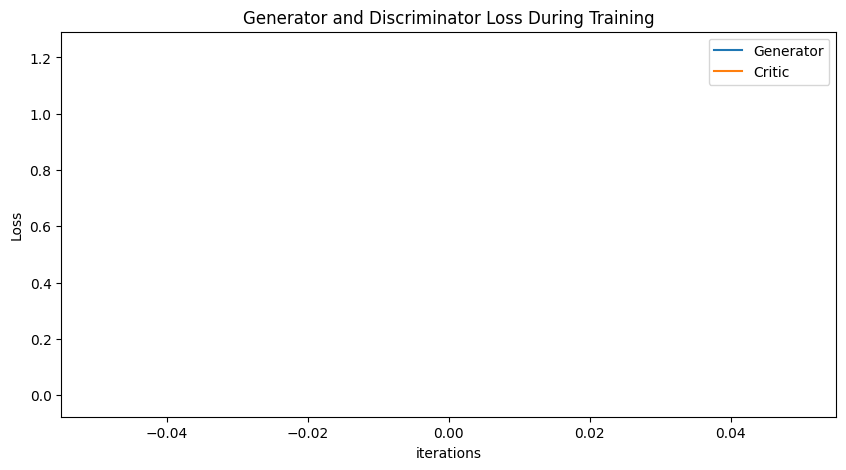

Epoch 50: Critic error ([1.2291640578927217, 0.6979232138669519, 0.2951107175808945, 0.08384265744913422, 0.03599405315406749, 0.06938182330589607, -0.005353200118097742, 0.0010422119465436364, 0.007437286020424802, 0.04174375654375441, 0.12737281629786767, 0.1327503171472405, 0.08180963379784206, 0.0913851193820194, 0.14507907025507688, 0.17502653391820222, 0.17085743094454026, 0.13200750914102866, 0.08432113531927116, 0.07245959895624292, 0.0664731020780496, 0.04656639056355007, 0.018417986983292105, 0.010384184950967837, -0.013309379274257016, 0.004884861180816054, -0.0037525971152512216, -0.011734626221288895, 0.007960729237806996, -0.017219850612199793, -0.02646313129795821, -0.03802111537938916, -0.02500211417739974, -0.040456652706202356, -0.03409342518142715, -0.0419935325755598, -0.04862204343046715, -0.05621048722205373, -0.06228733856896971, -0.057005793102758925, -0.06902970678468967, -0.06750052572027357, -0.0805269307219108, -0.09417566358210698, -0.1063669450081664, -0.1

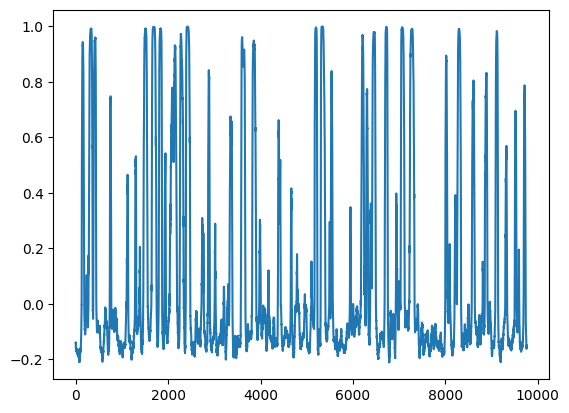

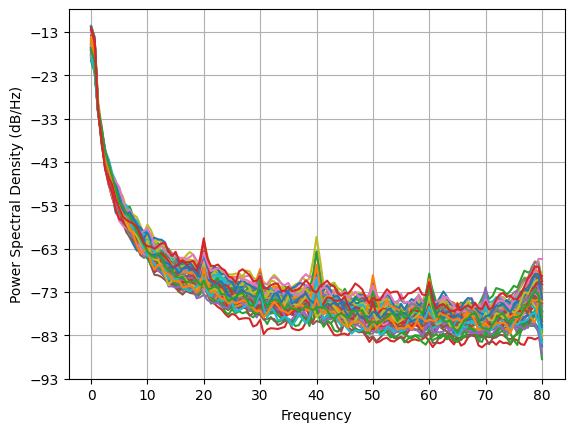

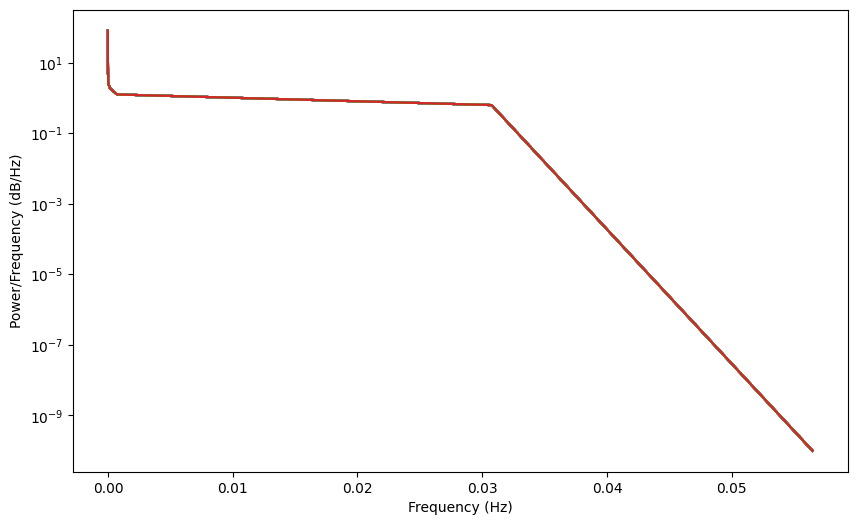

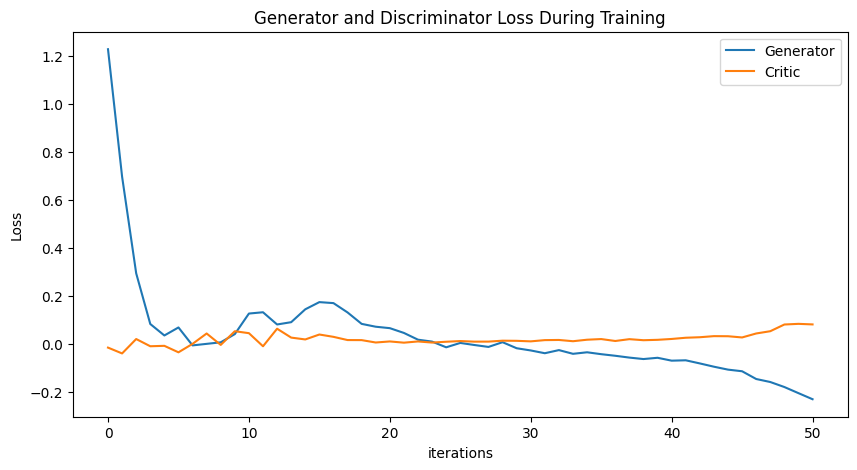

Epoch 100: Critic error ([1.2291640578927217, 0.6979232138669519, 0.2951107175808945, 0.08384265744913422, 0.03599405315406749, 0.06938182330589607, -0.005353200118097742, 0.0010422119465436364, 0.007437286020424802, 0.04174375654375441, 0.12737281629786767, 0.1327503171472405, 0.08180963379784206, 0.0913851193820194, 0.14507907025507688, 0.17502653391820222, 0.17085743094454026, 0.13200750914102866, 0.08432113531927116, 0.07245959895624292, 0.0664731020780496, 0.04656639056355007, 0.018417986983292105, 0.010384184950967837, -0.013309379274257016, 0.004884861180816054, -0.0037525971152512216, -0.011734626221288895, 0.007960729237806996, -0.017219850612199793, -0.02646313129795821, -0.03802111537938916, -0.02500211417739974, -0.040456652706202356, -0.03409342518142715, -0.0419935325755598, -0.04862204343046715, -0.05621048722205373, -0.06228733856896971, -0.057005793102758925, -0.06902970678468967, -0.06750052572027357, -0.0805269307219108, -0.09417566358210698, -0.1063669450081664, -0.

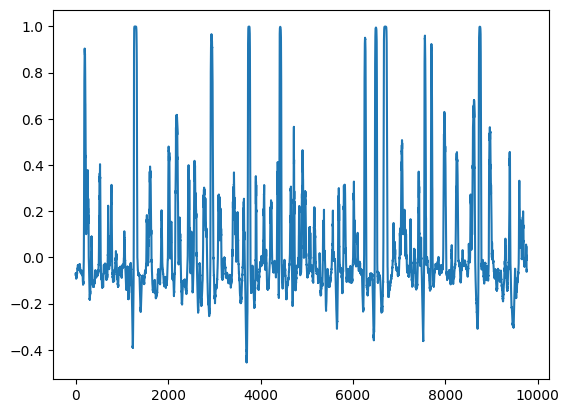

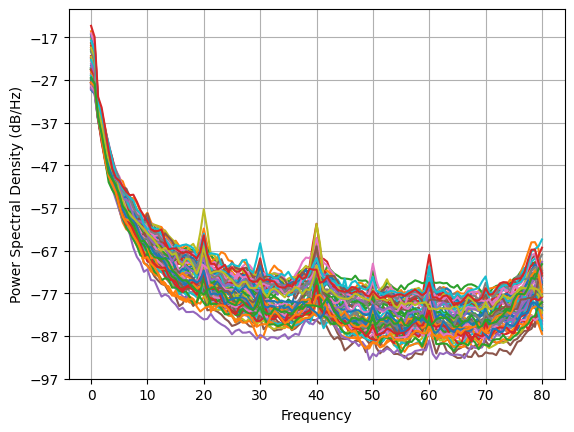

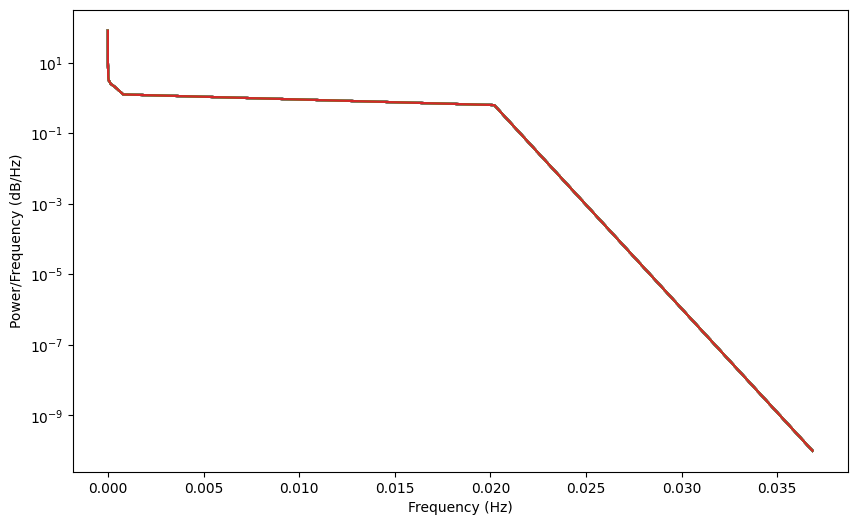

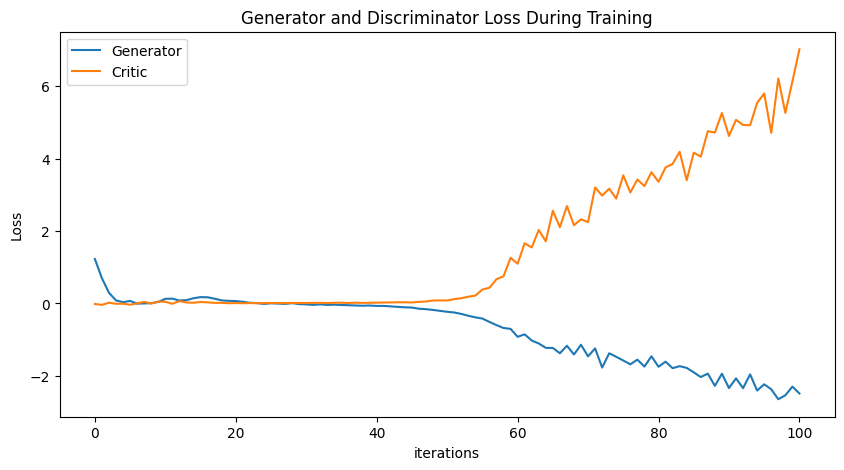

Epoch 150: Critic error ([1.2291640578927217, 0.6979232138669519, 0.2951107175808945, 0.08384265744913422, 0.03599405315406749, 0.06938182330589607, -0.005353200118097742, 0.0010422119465436364, 0.007437286020424802, 0.04174375654375441, 0.12737281629786767, 0.1327503171472405, 0.08180963379784206, 0.0913851193820194, 0.14507907025507688, 0.17502653391820222, 0.17085743094454026, 0.13200750914102866, 0.08432113531927116, 0.07245959895624292, 0.0664731020780496, 0.04656639056355007, 0.018417986983292105, 0.010384184950967837, -0.013309379274257016, 0.004884861180816054, -0.0037525971152512216, -0.011734626221288895, 0.007960729237806996, -0.017219850612199793, -0.02646313129795821, -0.03802111537938916, -0.02500211417739974, -0.040456652706202356, -0.03409342518142715, -0.0419935325755598, -0.04862204343046715, -0.05621048722205373, -0.06228733856896971, -0.057005793102758925, -0.06902970678468967, -0.06750052572027357, -0.0805269307219108, -0.09417566358210698, -0.1063669450081664, -0.

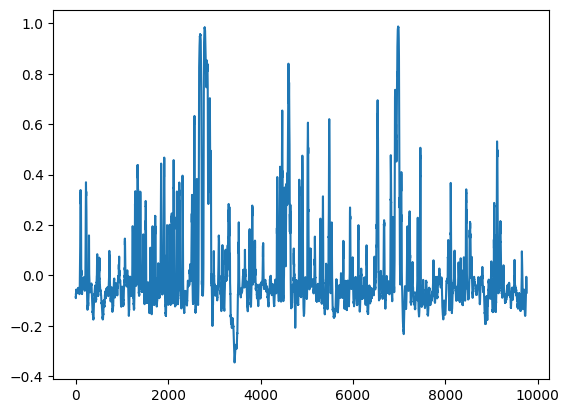

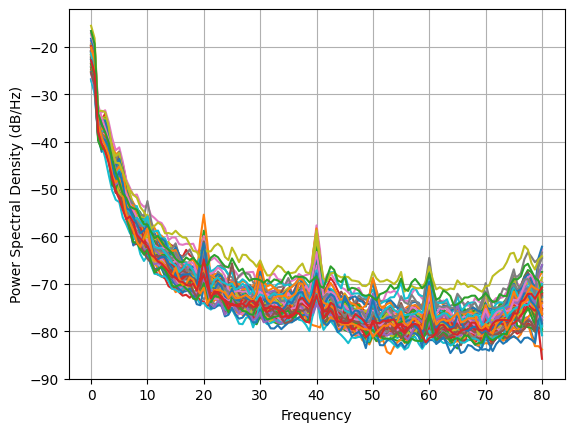

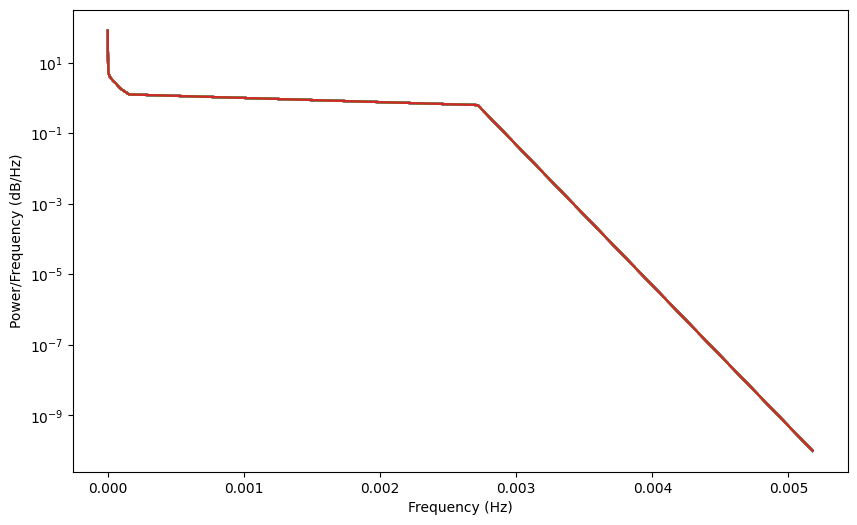

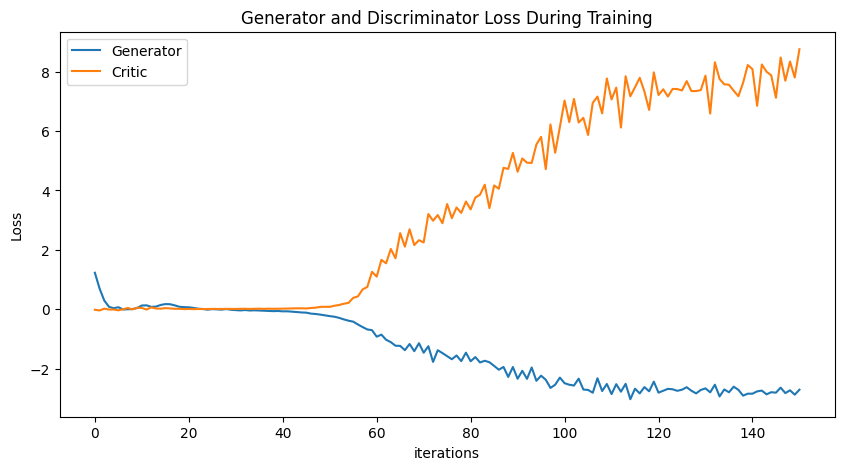

Epoch 200: Critic error ([1.2291640578927217, 0.6979232138669519, 0.2951107175808945, 0.08384265744913422, 0.03599405315406749, 0.06938182330589607, -0.005353200118097742, 0.0010422119465436364, 0.007437286020424802, 0.04174375654375441, 0.12737281629786767, 0.1327503171472405, 0.08180963379784206, 0.0913851193820194, 0.14507907025507688, 0.17502653391820222, 0.17085743094454026, 0.13200750914102866, 0.08432113531927116, 0.07245959895624292, 0.0664731020780496, 0.04656639056355007, 0.018417986983292105, 0.010384184950967837, -0.013309379274257016, 0.004884861180816054, -0.0037525971152512216, -0.011734626221288895, 0.007960729237806996, -0.017219850612199793, -0.02646313129795821, -0.03802111537938916, -0.02500211417739974, -0.040456652706202356, -0.03409342518142715, -0.0419935325755598, -0.04862204343046715, -0.05621048722205373, -0.06228733856896971, -0.057005793102758925, -0.06902970678468967, -0.06750052572027357, -0.0805269307219108, -0.09417566358210698, -0.1063669450081664, -0.

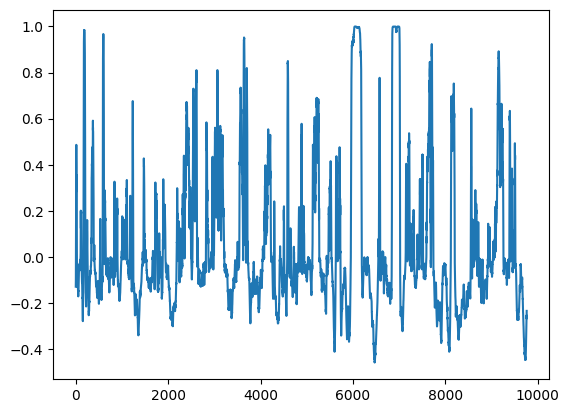

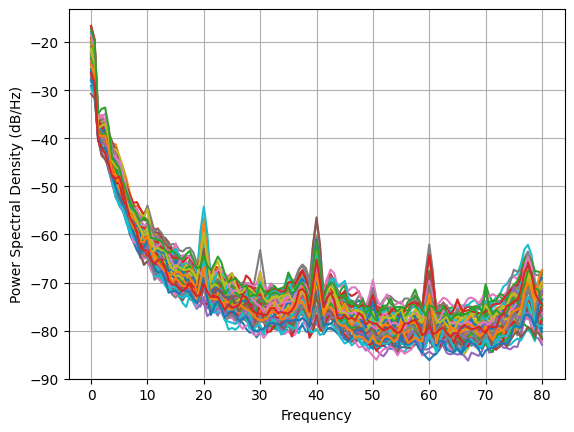

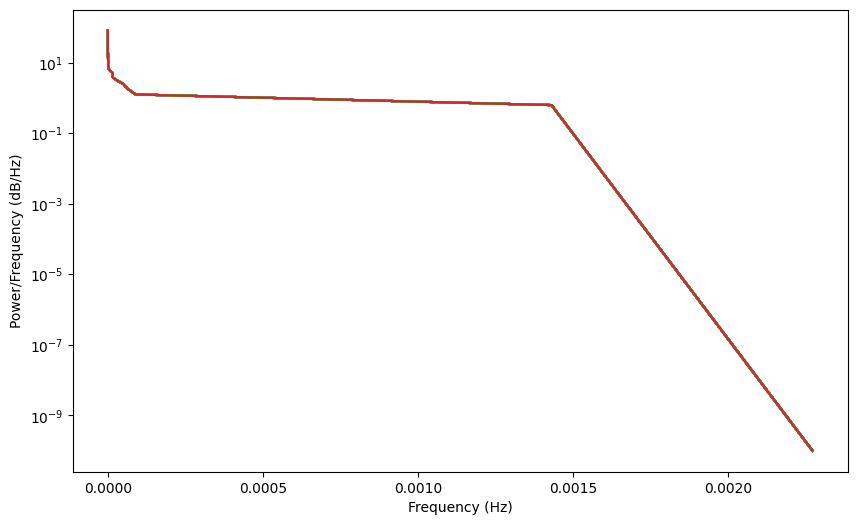

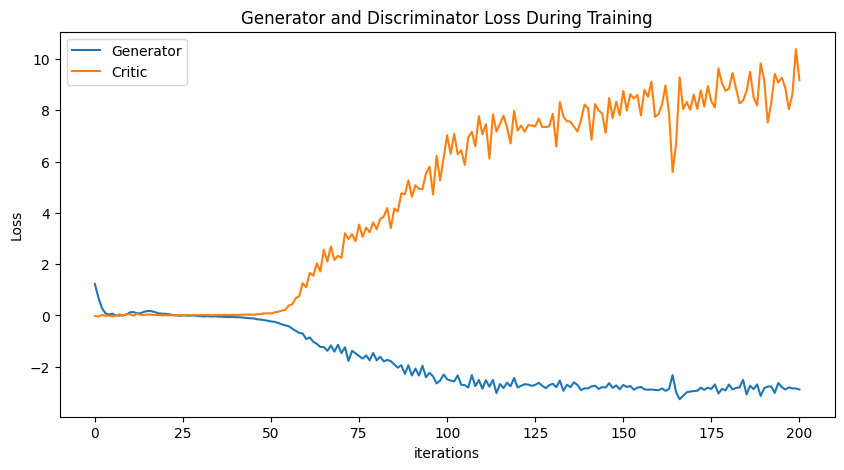

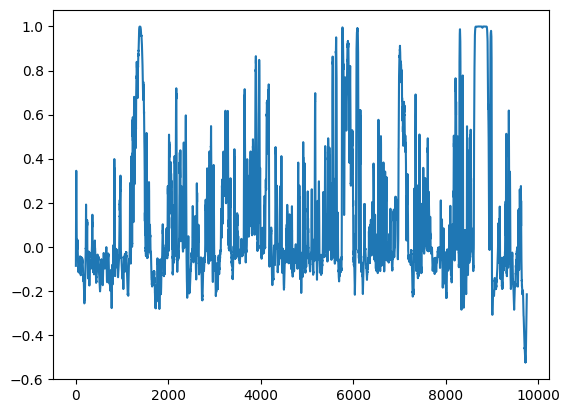

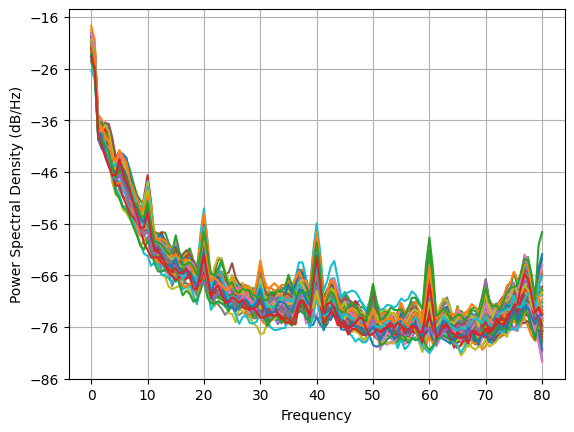

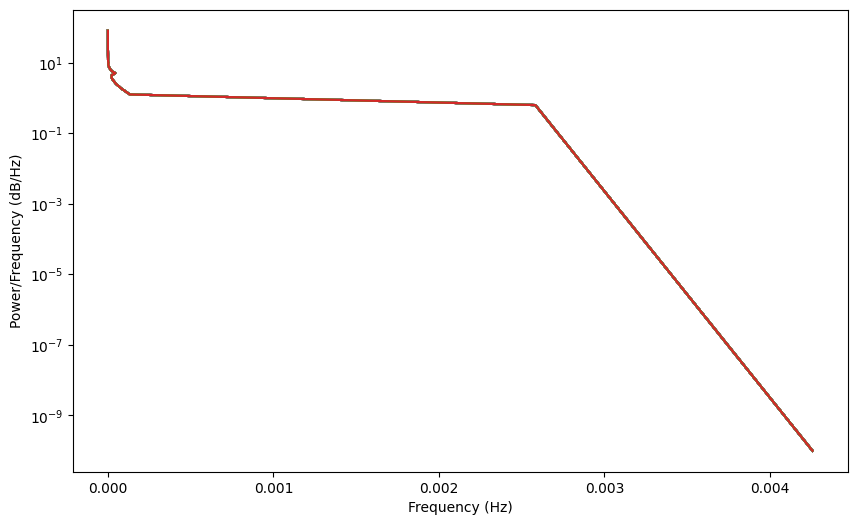

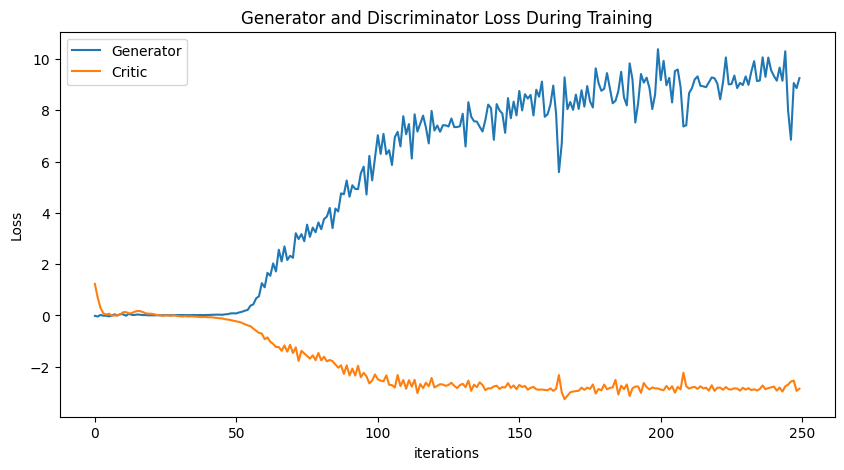

In [5]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_open_normalized_1, disc, gen = train()

torch.save(gen, 'genv3_4_open_norm_1.pt')
torch.save(disc, 'discv3_4_open_norm_1.pt')

plot_everything(generated_data_4_open_normalized_1, gen_err, critic_err)

In [ ]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_closed)[0]

train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        loss_critic = None
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_closed_normalized_1, disc, gen = train()

torch.save(gen, 'genv3_4_closed_norm_1.pt')
torch.save(disc, 'discv3_4_closed_norm_1.pt')

plot_everything(generated_data_4_closed_normalized_1, gen_err, critic_err)

# Dataloader, Zero grad after optimizer, follow gpt advice
# High hopes
# Normalized
# Tanh into -1/1 on generator
# no repeated disc
### no

Epoch 0: Critic error ([4.985483859018107]) Generator err ([0.00795752089470625])


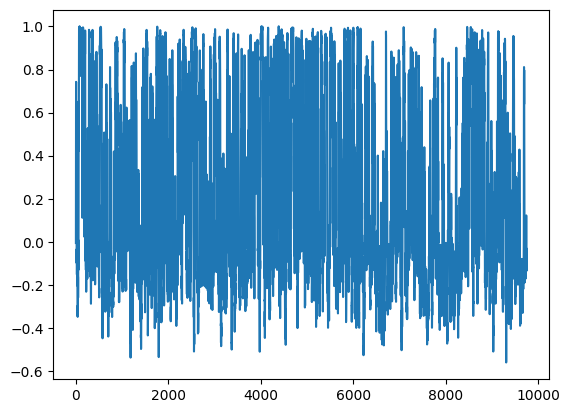

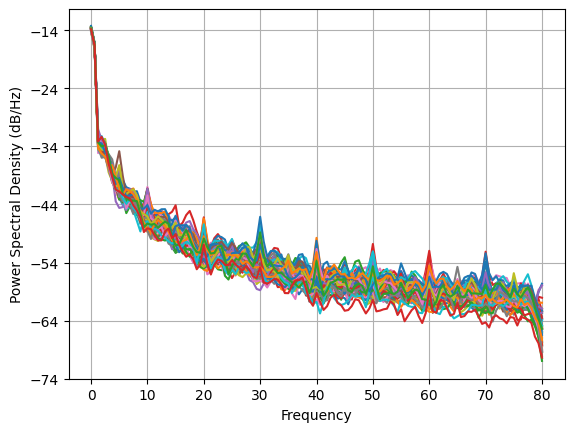

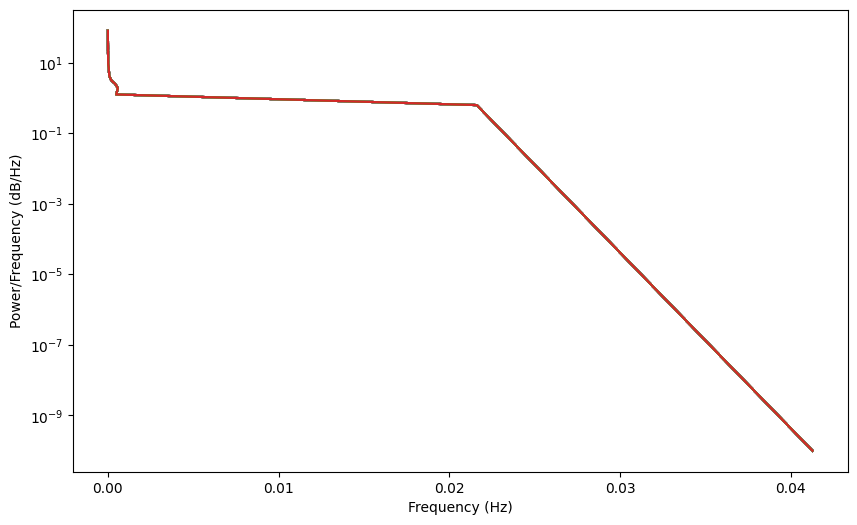

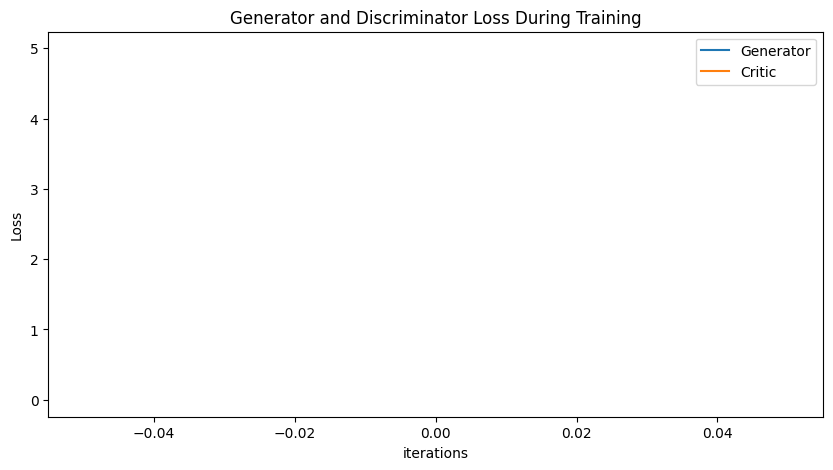

Epoch 50: Critic error ([4.985483859018107, 4.7901671932737555, 2.2733344181544872, 88.84357748169361, 2.302155686694346, 2.0845518461828467, 1.9858148855531066, 1.7730935576403544, 1.7022207688586757, 1.4753553032427542, 1.2975331359536038, 1.0824668524817538, 0.9375986261124112, 0.7838212189974656, 0.5933515452071427, 0.4499870610008288, 0.38328373509113267, 0.33969563833058464, 0.2597797811532482, 0.22712967416141694, 0.17416014776645355, 0.11377174381601649, 0.2174170016508501, 0.12530013261907819, 0.16076600555188242, 0.10171298445244575, 0.10065027367500581, 0.10219746965844614, 0.11381258481605377, 0.12317470354676441, 0.09616329517915398, 0.10625138557554614, 0.08894338320079914, 0.05610480039865613, 0.051127371008676814, 0.09773796787142908, 0.06596707408625058, 0.08554426496363893, 0.05903490932007138, 0.10258626740499777, 0.02434694728373224, 0.10471926963446007, 0.08397358485998417, 0.10843840648695728, 0.05994935415667946, -0.010908863886987571, 0.10585648622029882, 0.0859

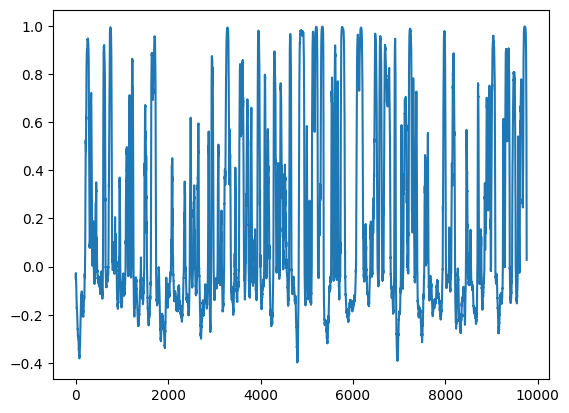

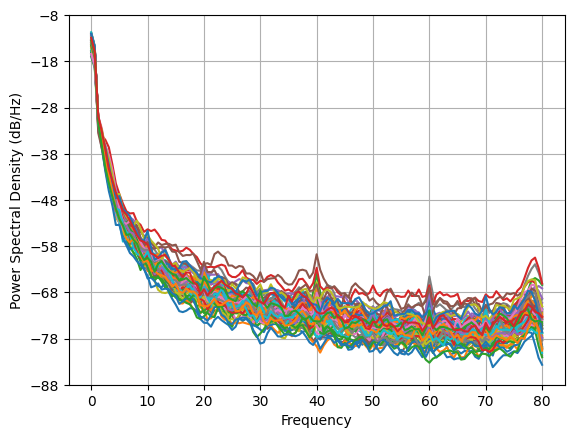

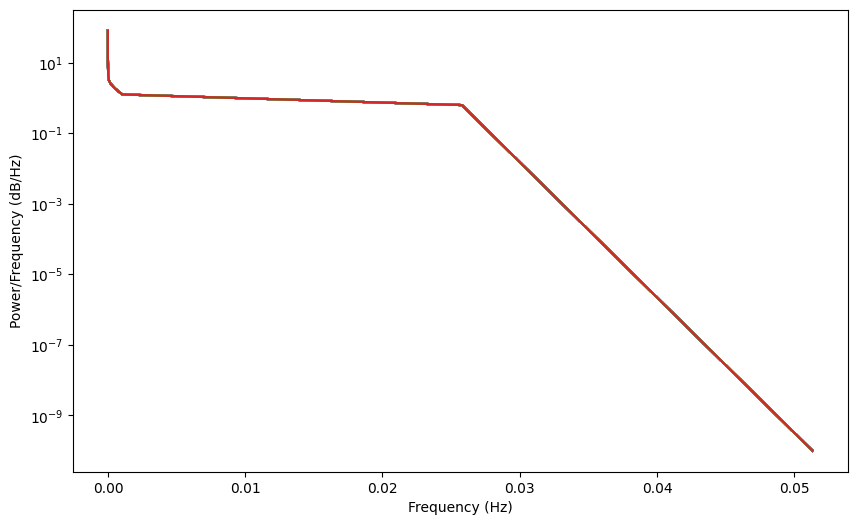

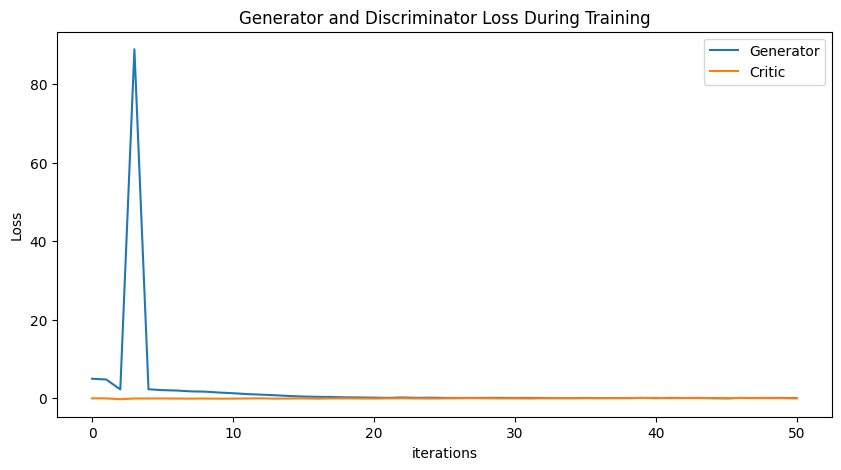

Epoch 100: Critic error ([4.985483859018107, 4.7901671932737555, 2.2733344181544872, 88.84357748169361, 2.302155686694346, 2.0845518461828467, 1.9858148855531066, 1.7730935576403544, 1.7022207688586757, 1.4753553032427542, 1.2975331359536038, 1.0824668524817538, 0.9375986261124112, 0.7838212189974656, 0.5933515452071427, 0.4499870610008288, 0.38328373509113267, 0.33969563833058464, 0.2597797811532482, 0.22712967416141694, 0.17416014776645355, 0.11377174381601649, 0.2174170016508501, 0.12530013261907819, 0.16076600555188242, 0.10171298445244575, 0.10065027367500581, 0.10219746965844614, 0.11381258481605377, 0.12317470354676441, 0.09616329517915398, 0.10625138557554614, 0.08894338320079914, 0.05610480039865613, 0.051127371008676814, 0.09773796787142908, 0.06596707408625058, 0.08554426496363893, 0.05903490932007138, 0.10258626740499777, 0.02434694728373224, 0.10471926963446007, 0.08397358485998417, 0.10843840648695728, 0.05994935415667946, -0.010908863886987571, 0.10585648622029882, 0.085

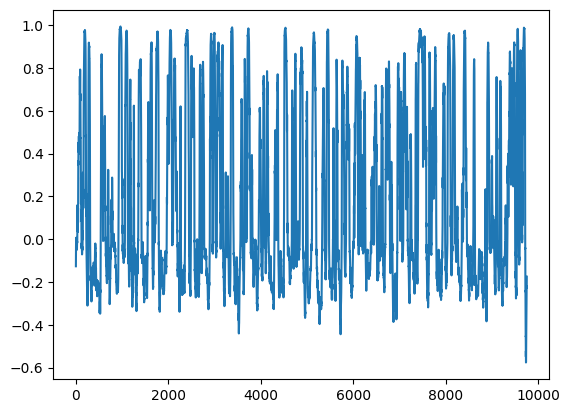

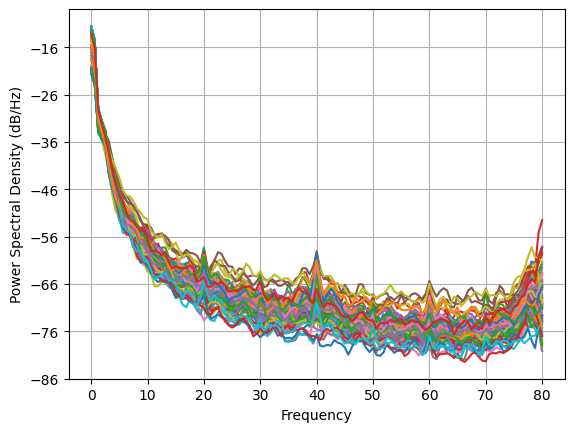

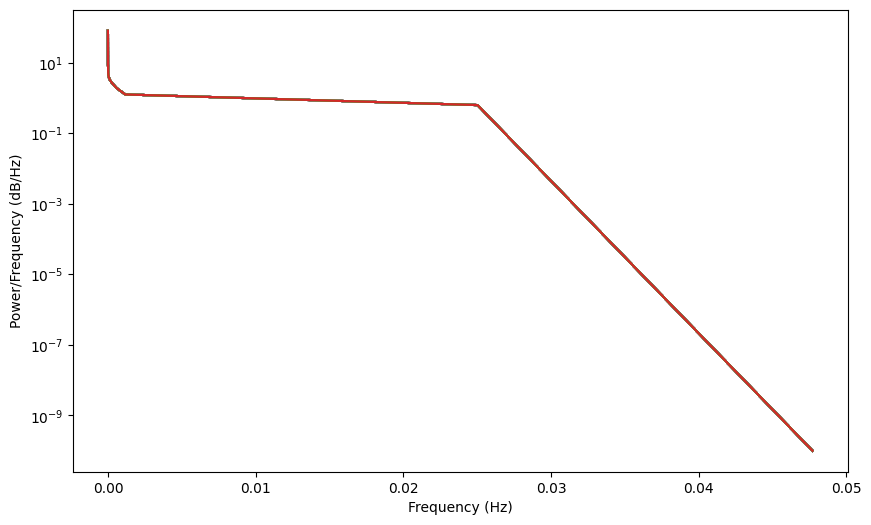

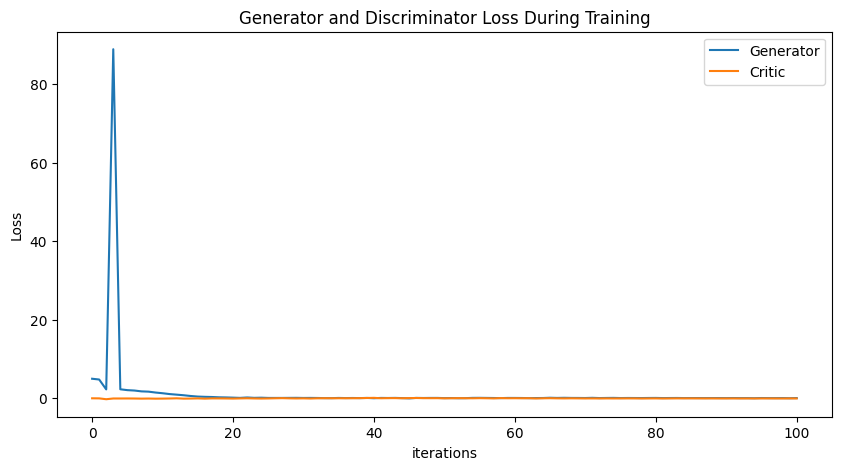

Epoch 150: Critic error ([4.985483859018107, 4.7901671932737555, 2.2733344181544872, 88.84357748169361, 2.302155686694346, 2.0845518461828467, 1.9858148855531066, 1.7730935576403544, 1.7022207688586757, 1.4753553032427542, 1.2975331359536038, 1.0824668524817538, 0.9375986261124112, 0.7838212189974656, 0.5933515452071427, 0.4499870610008288, 0.38328373509113267, 0.33969563833058464, 0.2597797811532482, 0.22712967416141694, 0.17416014776645355, 0.11377174381601649, 0.2174170016508501, 0.12530013261907819, 0.16076600555188242, 0.10171298445244575, 0.10065027367500581, 0.10219746965844614, 0.11381258481605377, 0.12317470354676441, 0.09616329517915398, 0.10625138557554614, 0.08894338320079914, 0.05610480039865613, 0.051127371008676814, 0.09773796787142908, 0.06596707408625058, 0.08554426496363893, 0.05903490932007138, 0.10258626740499777, 0.02434694728373224, 0.10471926963446007, 0.08397358485998417, 0.10843840648695728, 0.05994935415667946, -0.010908863886987571, 0.10585648622029882, 0.085

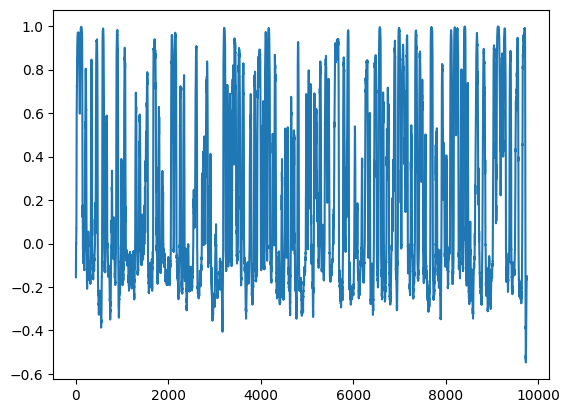

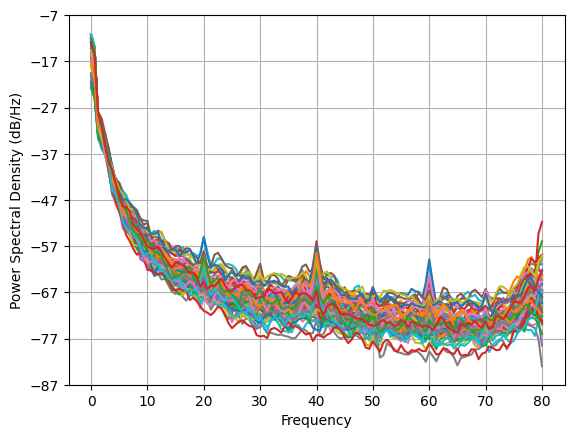

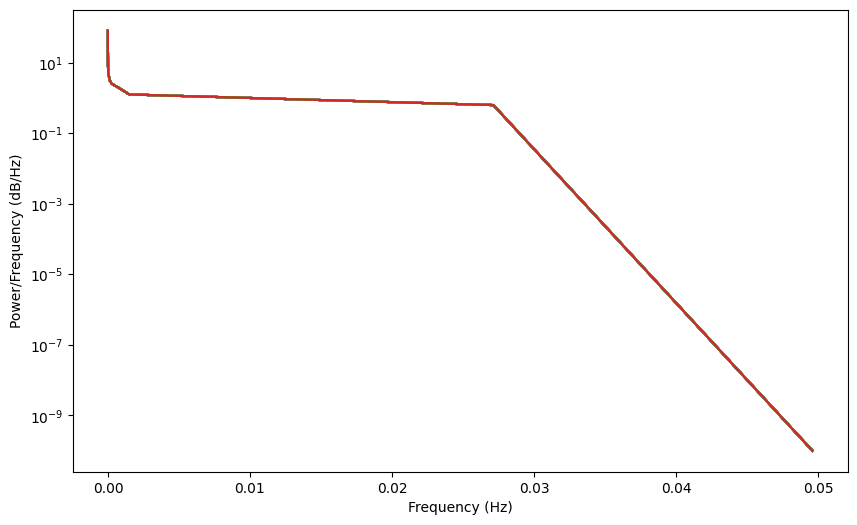

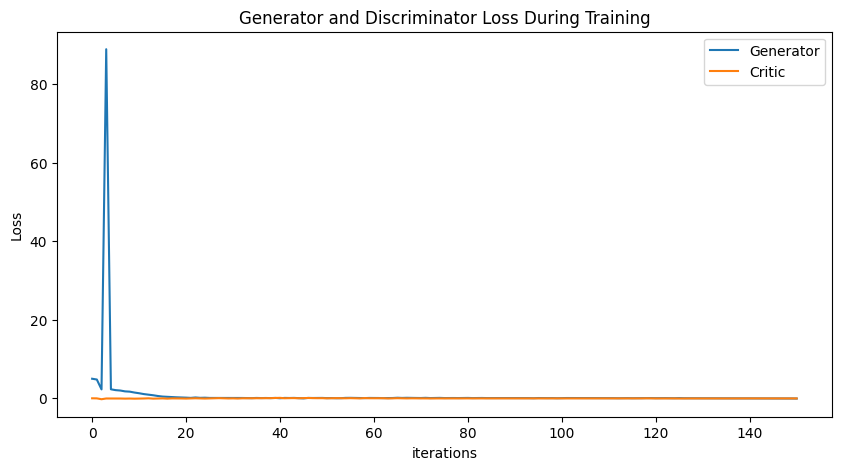

Epoch 200: Critic error ([4.985483859018107, 4.7901671932737555, 2.2733344181544872, 88.84357748169361, 2.302155686694346, 2.0845518461828467, 1.9858148855531066, 1.7730935576403544, 1.7022207688586757, 1.4753553032427542, 1.2975331359536038, 1.0824668524817538, 0.9375986261124112, 0.7838212189974656, 0.5933515452071427, 0.4499870610008288, 0.38328373509113267, 0.33969563833058464, 0.2597797811532482, 0.22712967416141694, 0.17416014776645355, 0.11377174381601649, 0.2174170016508501, 0.12530013261907819, 0.16076600555188242, 0.10171298445244575, 0.10065027367500581, 0.10219746965844614, 0.11381258481605377, 0.12317470354676441, 0.09616329517915398, 0.10625138557554614, 0.08894338320079914, 0.05610480039865613, 0.051127371008676814, 0.09773796787142908, 0.06596707408625058, 0.08554426496363893, 0.05903490932007138, 0.10258626740499777, 0.02434694728373224, 0.10471926963446007, 0.08397358485998417, 0.10843840648695728, 0.05994935415667946, -0.010908863886987571, 0.10585648622029882, 0.085

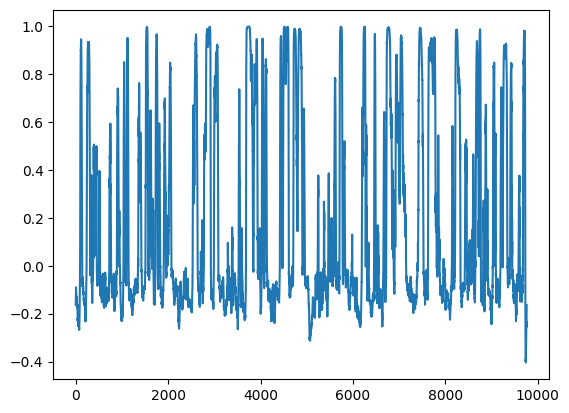

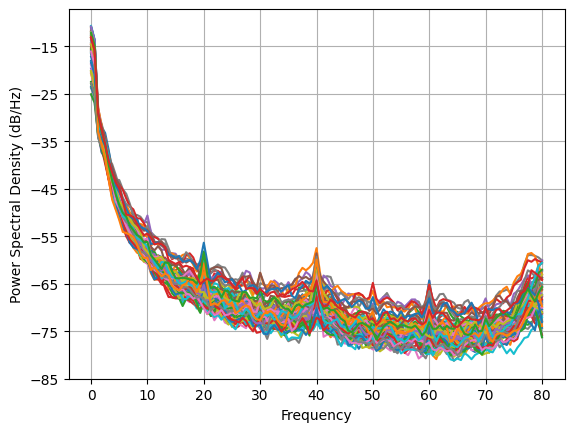

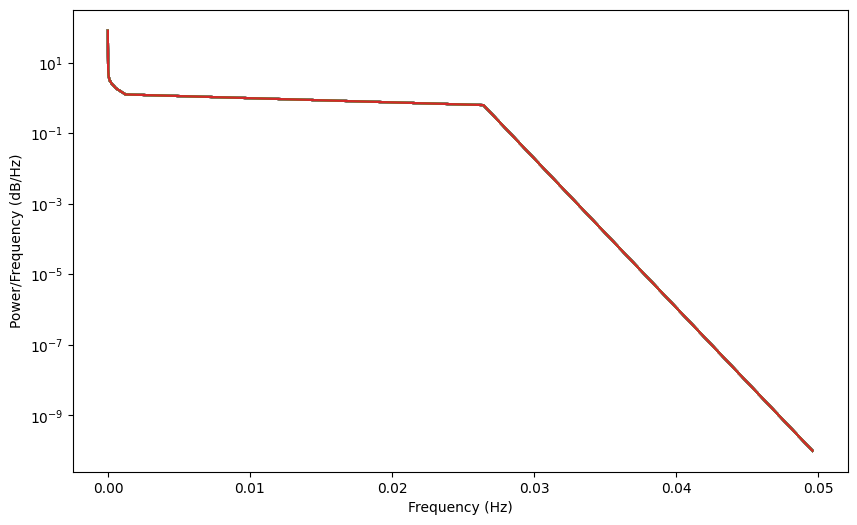

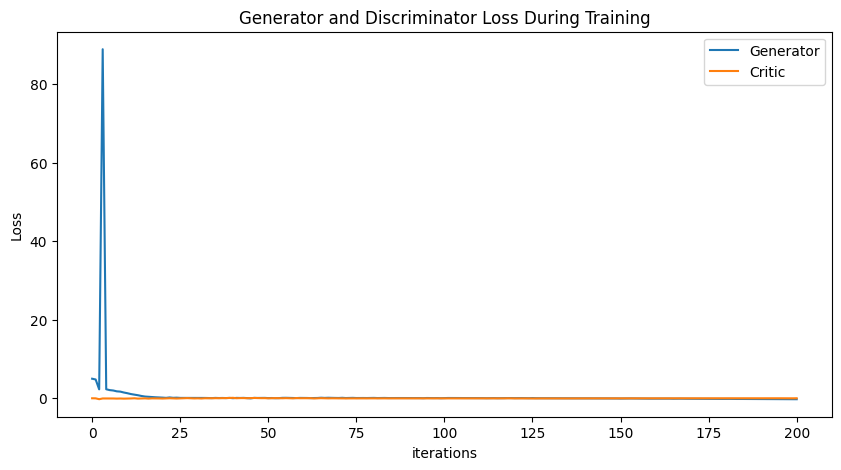

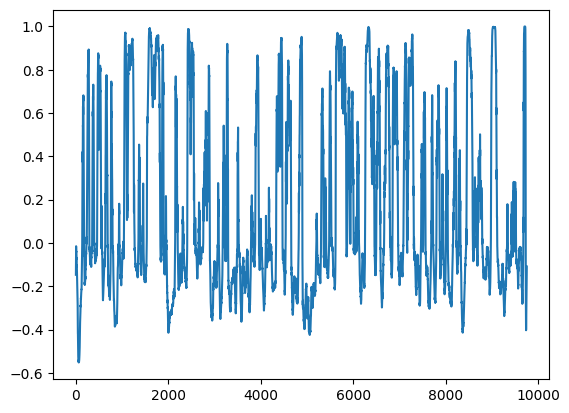

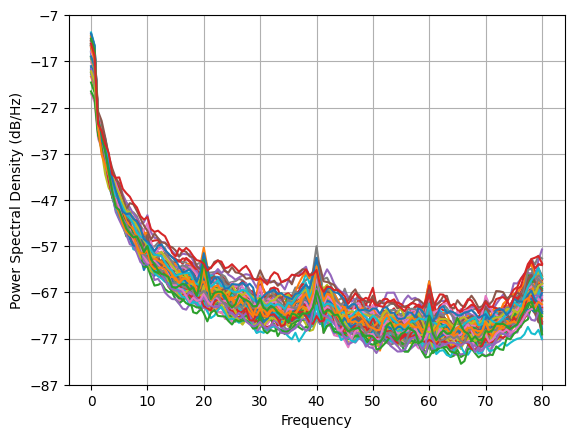

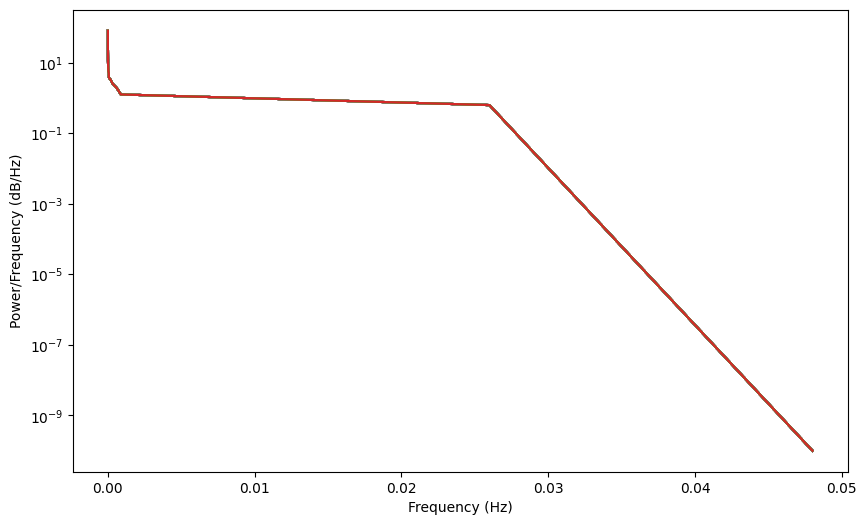

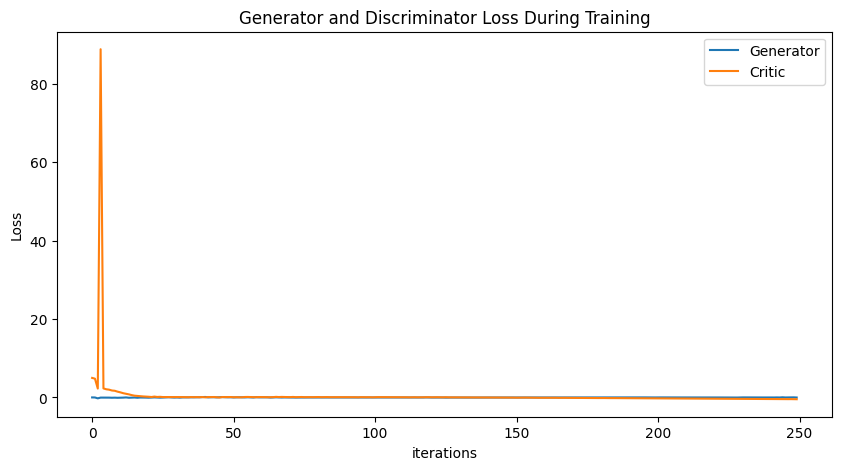

In [6]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_open_normalized_2, disc, gen = train()

torch.save(gen, 'genv3_4_open_norm_2.pt')
torch.save(disc, 'discv3_4_open_norm_2.pt')

plot_everything(generated_data_4_open_normalized_2, gen_err, critic_err)

In [ ]:
# NUM_EPOCHS = 250
# PRINT_INTERVAL = 50
# BATCH_SIZE = np.shape(normalized_data_closed)[0]

# train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
# train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

# class Generator(nn.Module):
#     def __init__(self):
#         super(Generator, self).__init__()
#         self.block = nn.Sequential(
#             nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
#             nn.BatchNorm1d(64, affine=True),
#             nn.LeakyReLU(0.2),
#             nn.Upsample(scale_factor=2),
#             nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.BatchNorm1d(64, affine=True),
#             nn.LeakyReLU(0.2),
#             nn.Upsample(scale_factor=2),
#             nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.BatchNorm1d(64, affine=True),
#             nn.LeakyReLU(0.2),
#             nn.Upsample(scale_factor=2),
#             nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.BatchNorm1d(64, affine=True),
#             nn.LeakyReLU(0.2),
#             nn.Upsample(scale_factor=2),
#             nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.BatchNorm1d(64, affine=True),
#             nn.LeakyReLU(0.2),
#             nn.Upsample(scale_factor=2),
#             nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.BatchNorm1d(64, affine=True),
#             nn.LeakyReLU(0.2),
#             nn.Tanh()
#         )

#     def forward(self, x):
#         x = self.block(x)
#         return x

# class Discriminator(nn.Module):
#     def __init__(self):
#         super(Discriminator, self).__init__()
#         self.block = nn.Sequential(
#             nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.LeakyReLU(0.2),
#             nn.AvgPool1d(kernel_size=2, stride=2),
#             nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.LeakyReLU(0.2),
#             nn.AvgPool1d(kernel_size=2, stride=2),
#             nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.LeakyReLU(0.2),
#             nn.AvgPool1d(kernel_size=2, stride=2),
#             nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.LeakyReLU(0.2),
#             nn.AvgPool1d(kernel_size=2, stride=2),
#             nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.LeakyReLU(0.2),
#             nn.AvgPool1d(kernel_size=2, stride=2),
#             nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
#             nn.LeakyReLU(0.2),
#             nn.Linear(305, 1)
#         )

#     def forward(self, x):
#         x = x.float()
#         x = self.block(x)
#         return x

# def train():
#     critic_err, gen_err, generated_data = [], [], None
#     G, D = Generator(), Discriminator()
#     weights_init(G)
#     weights_init(D)
#     critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
#     gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

#     for epoch in range(NUM_EPOCHS):
#         loss_critic = None
#         for (real,) in train_loader:
#             real.requires_grad=True
#             critic_real = D(real).reshape(-1)
#             loss_critic_real = -torch.mean(critic_real)
#             noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
#             fake = G(noise)
#             critic_fake = D(fake).reshape(-1)
#             loss_critic_fake = torch.mean(critic_fake)
#             gp = gradient_penalty(D, real, fake) * LAMBDA_GP
#             D.zero_grad()
#             loss_critic = loss_critic_real + loss_critic_fake + gp
#             loss_critic.backward()
#             critic_optimizer.step()  

#         noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
#         fake = G(noise)
#         gen_fake = D(fake).reshape(-1)
#         loss_gen = -torch.mean(gen_fake)
#         G.zero_grad()
#         loss_gen.backward()
#         gen_optimizer.step()

#         generated_data = fake
#         critic_err.append(loss_critic.item())
#         gen_err.append(loss_gen.item())

#         if epoch % PRINT_INTERVAL == 0:
#             print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
#             plot_everything(generated_data, critic_err, gen_err)

#     return critic_err, gen_err, generated_data, D, G

# critic_err, gen_err, generated_data_4_closed_normalized_2, disc, gen = train()

# torch.save(gen, 'genv3_4_closed_norm_2.pt')
# torch.save(disc, 'discv3_4_closed_norm_2.pt')

# plot_everything(generated_data_4_closed_normalized_2, gen_err, critic_err)

# Dataloader, Zero grad after optimizer, follow gpt advice
# Normalized
# old training method
## comparably good to new training method with Tanh

Epoch 0: Critic error ([0.7157062091068949]) Generator err ([0.29094189405441284])


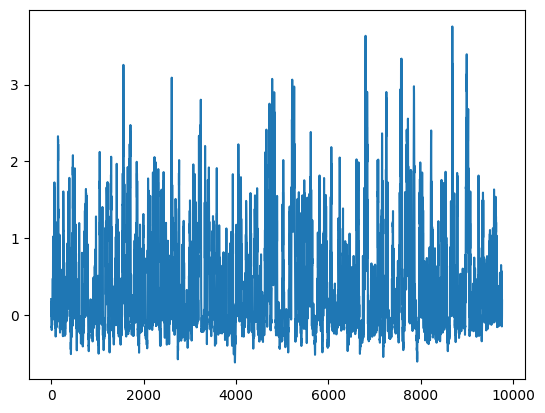

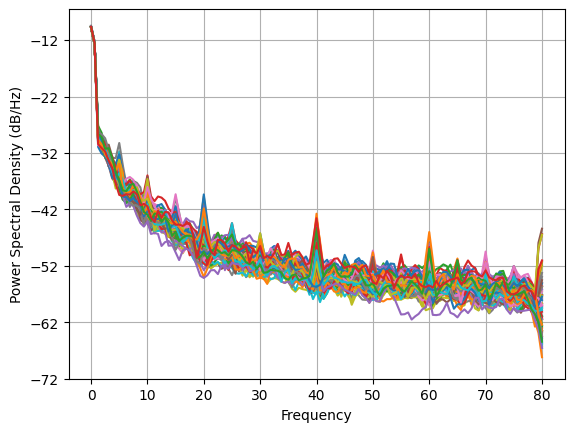

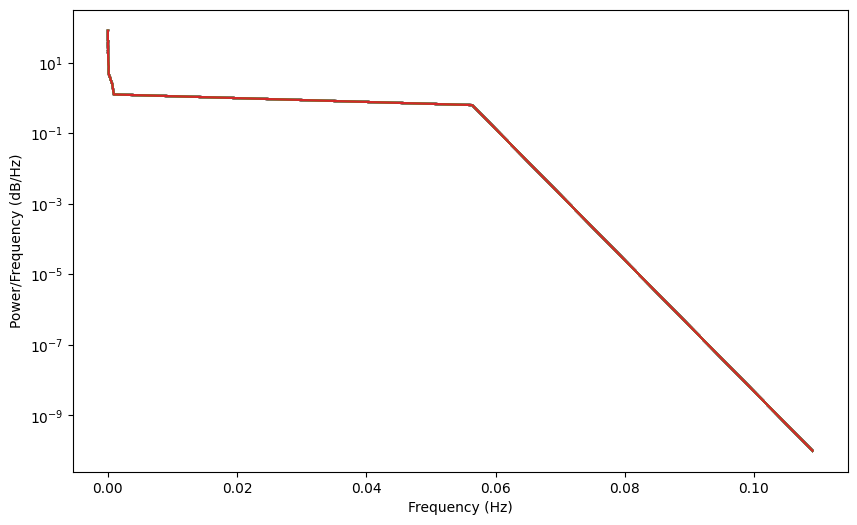

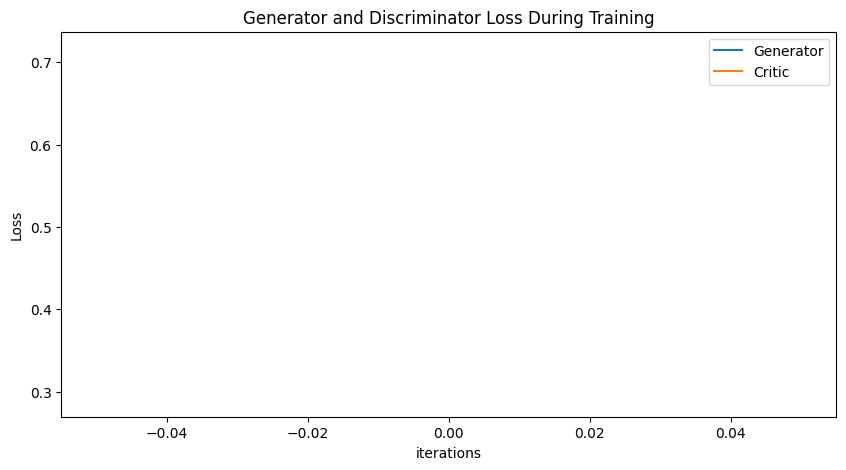

Epoch 50: Critic error ([0.7157062091068949, -0.48415688019104336, -0.7763647183913139, -1.1198555690678564, -1.5264825970626241, -1.7190230675273253, -1.8683837215210521, -2.166344813761606, -1.9794419302555153, -2.2415493031177816, -2.097632538925109, -2.469606452048848, -2.5447461859918143, -2.788947842566399, -2.5291376973015236, -2.685998054531933, -2.7101735207270625, -2.1150106832601, -3.4611131140577736, -3.3242333507285453, -2.3832265750568853, -3.658048006887844, -3.613699372809951, -3.476827238742848, -3.1620985963292036, -3.3702852330914133, -3.2219656921450333, -3.557734615030104, -3.2102663845815353, -3.3393452299316126, -3.2615540138289445, -3.882165111508262, -4.228887250860306, -3.8729220363425614, -3.7106415329669677, -3.243616265010849, -2.8270789448949203, -3.0285450967476866, -2.729958259846255, -2.8671007745960155, -3.0306906382981285, -2.858526621853395, -2.704530478811061, -2.600210413609875, -2.5248732194471666, -2.7444736325717174, -2.7617080888100856, -2.6485

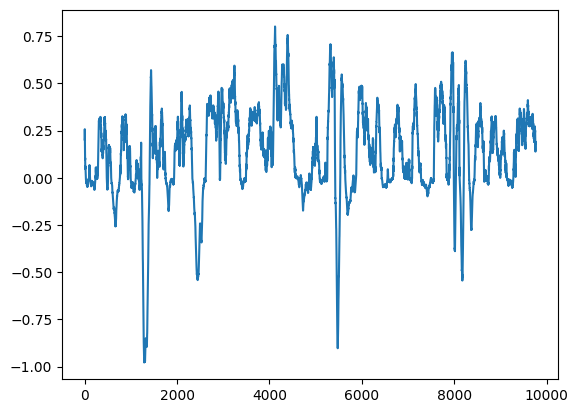

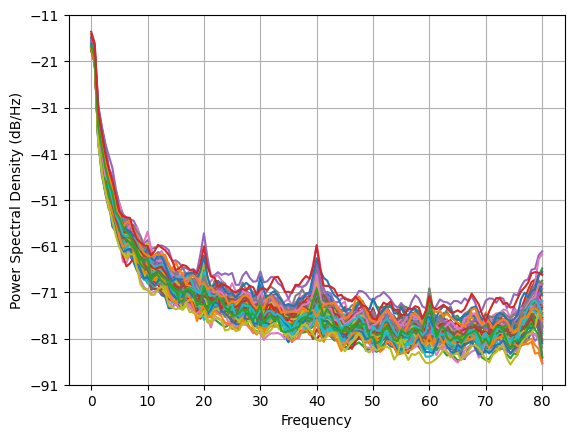

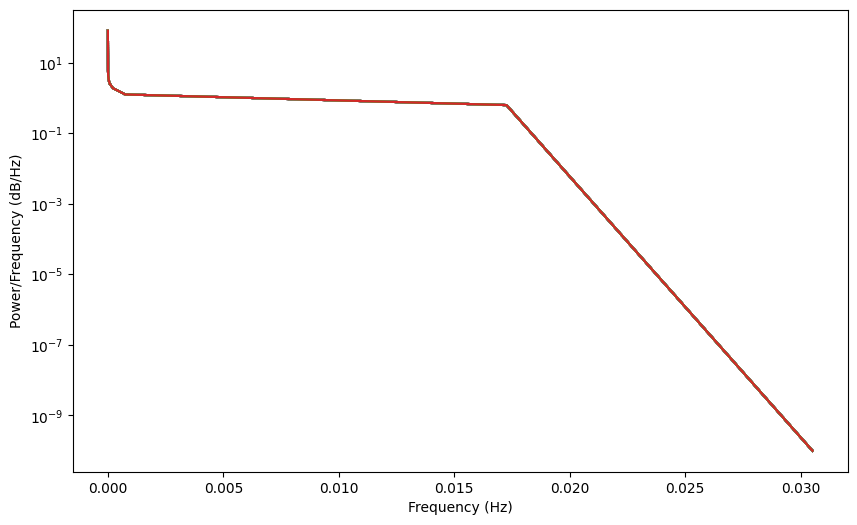

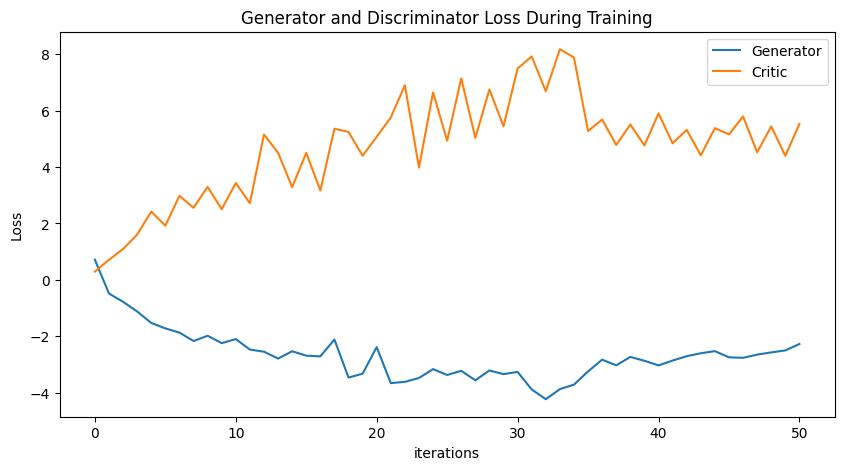

Epoch 100: Critic error ([0.7157062091068949, -0.48415688019104336, -0.7763647183913139, -1.1198555690678564, -1.5264825970626241, -1.7190230675273253, -1.8683837215210521, -2.166344813761606, -1.9794419302555153, -2.2415493031177816, -2.097632538925109, -2.469606452048848, -2.5447461859918143, -2.788947842566399, -2.5291376973015236, -2.685998054531933, -2.7101735207270625, -2.1150106832601, -3.4611131140577736, -3.3242333507285453, -2.3832265750568853, -3.658048006887844, -3.613699372809951, -3.476827238742848, -3.1620985963292036, -3.3702852330914133, -3.2219656921450333, -3.557734615030104, -3.2102663845815353, -3.3393452299316126, -3.2615540138289445, -3.882165111508262, -4.228887250860306, -3.8729220363425614, -3.7106415329669677, -3.243616265010849, -2.8270789448949203, -3.0285450967476866, -2.729958259846255, -2.8671007745960155, -3.0306906382981285, -2.858526621853395, -2.704530478811061, -2.600210413609875, -2.5248732194471666, -2.7444736325717174, -2.7617080888100856, -2.648

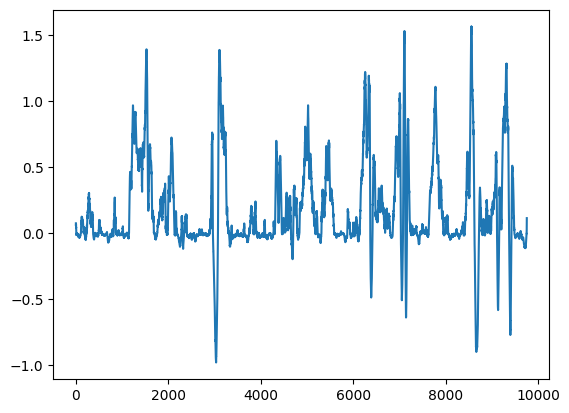

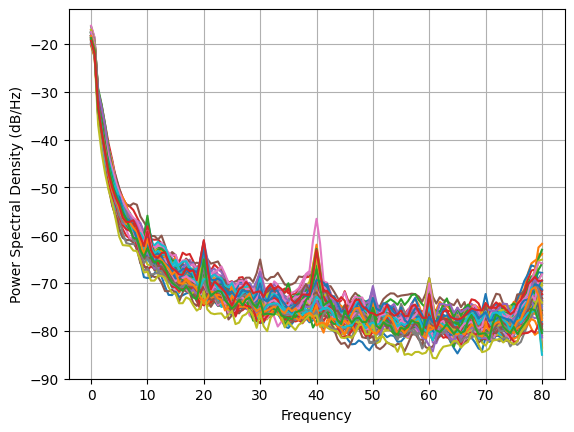

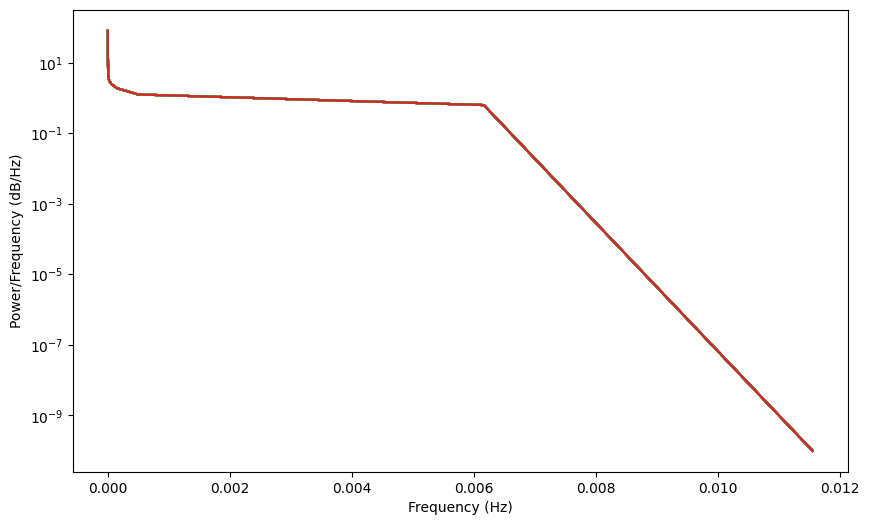

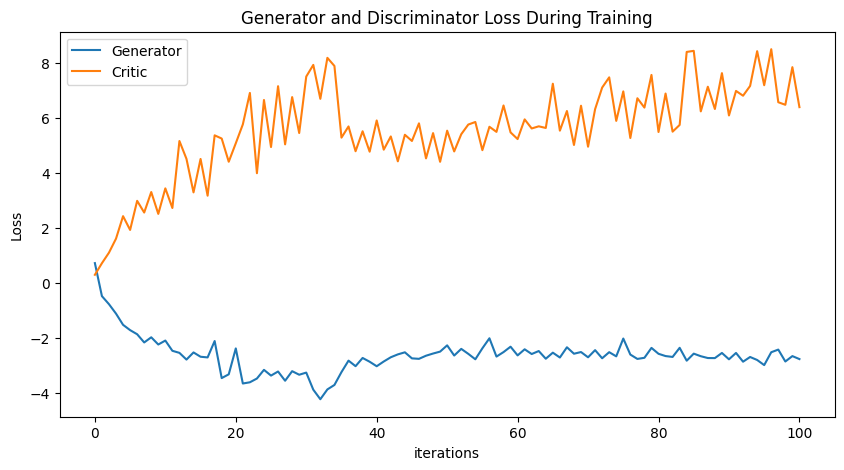

Epoch 150: Critic error ([0.7157062091068949, -0.48415688019104336, -0.7763647183913139, -1.1198555690678564, -1.5264825970626241, -1.7190230675273253, -1.8683837215210521, -2.166344813761606, -1.9794419302555153, -2.2415493031177816, -2.097632538925109, -2.469606452048848, -2.5447461859918143, -2.788947842566399, -2.5291376973015236, -2.685998054531933, -2.7101735207270625, -2.1150106832601, -3.4611131140577736, -3.3242333507285453, -2.3832265750568853, -3.658048006887844, -3.613699372809951, -3.476827238742848, -3.1620985963292036, -3.3702852330914133, -3.2219656921450333, -3.557734615030104, -3.2102663845815353, -3.3393452299316126, -3.2615540138289445, -3.882165111508262, -4.228887250860306, -3.8729220363425614, -3.7106415329669677, -3.243616265010849, -2.8270789448949203, -3.0285450967476866, -2.729958259846255, -2.8671007745960155, -3.0306906382981285, -2.858526621853395, -2.704530478811061, -2.600210413609875, -2.5248732194471666, -2.7444736325717174, -2.7617080888100856, -2.648

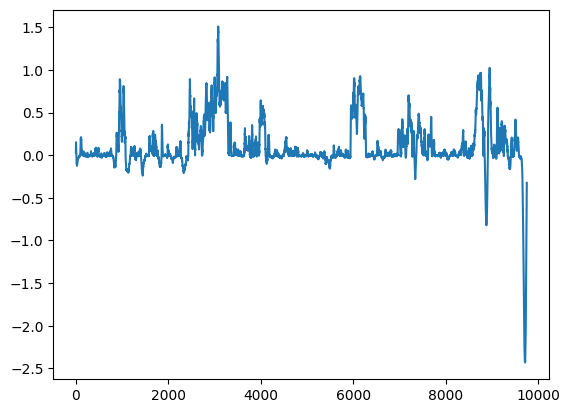

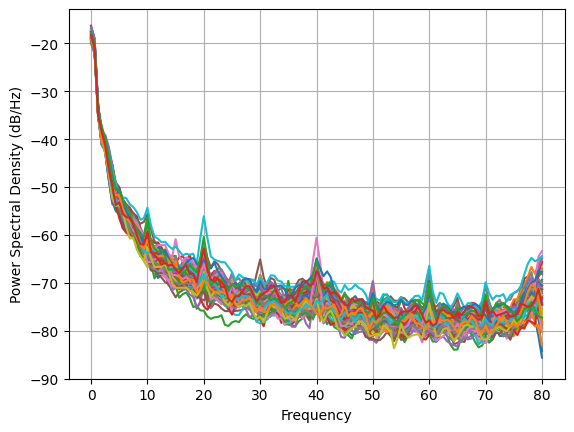

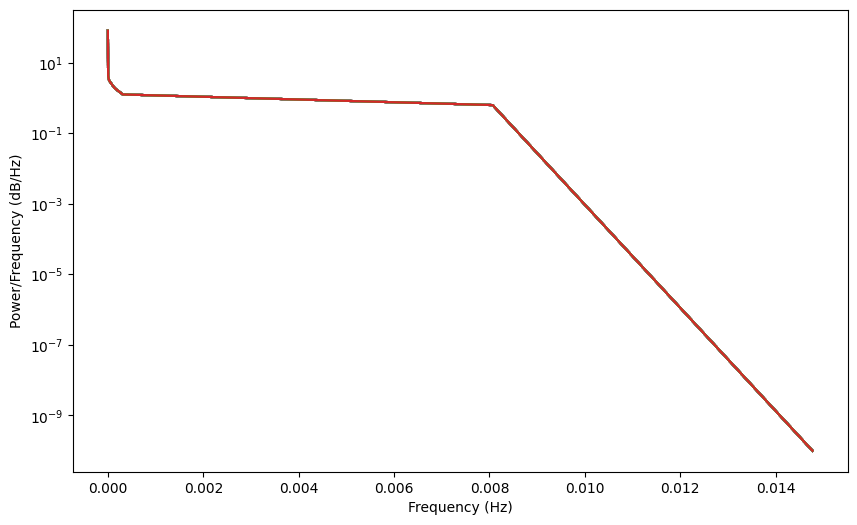

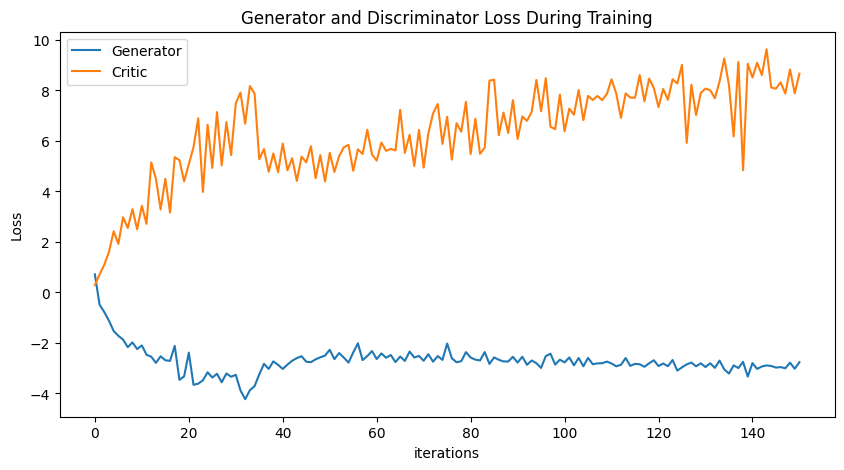

Epoch 200: Critic error ([0.7157062091068949, -0.48415688019104336, -0.7763647183913139, -1.1198555690678564, -1.5264825970626241, -1.7190230675273253, -1.8683837215210521, -2.166344813761606, -1.9794419302555153, -2.2415493031177816, -2.097632538925109, -2.469606452048848, -2.5447461859918143, -2.788947842566399, -2.5291376973015236, -2.685998054531933, -2.7101735207270625, -2.1150106832601, -3.4611131140577736, -3.3242333507285453, -2.3832265750568853, -3.658048006887844, -3.613699372809951, -3.476827238742848, -3.1620985963292036, -3.3702852330914133, -3.2219656921450333, -3.557734615030104, -3.2102663845815353, -3.3393452299316126, -3.2615540138289445, -3.882165111508262, -4.228887250860306, -3.8729220363425614, -3.7106415329669677, -3.243616265010849, -2.8270789448949203, -3.0285450967476866, -2.729958259846255, -2.8671007745960155, -3.0306906382981285, -2.858526621853395, -2.704530478811061, -2.600210413609875, -2.5248732194471666, -2.7444736325717174, -2.7617080888100856, -2.648

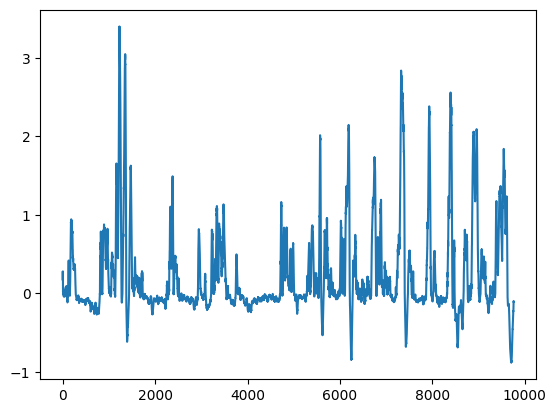

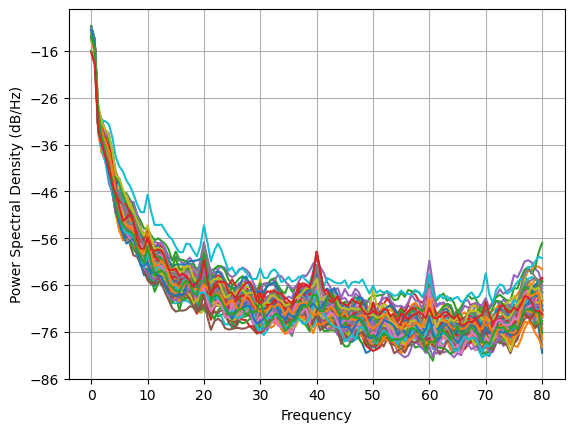

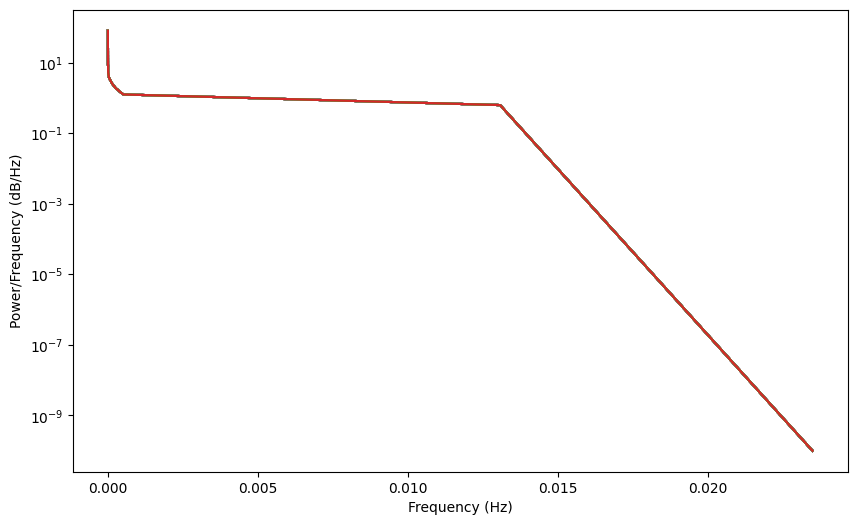

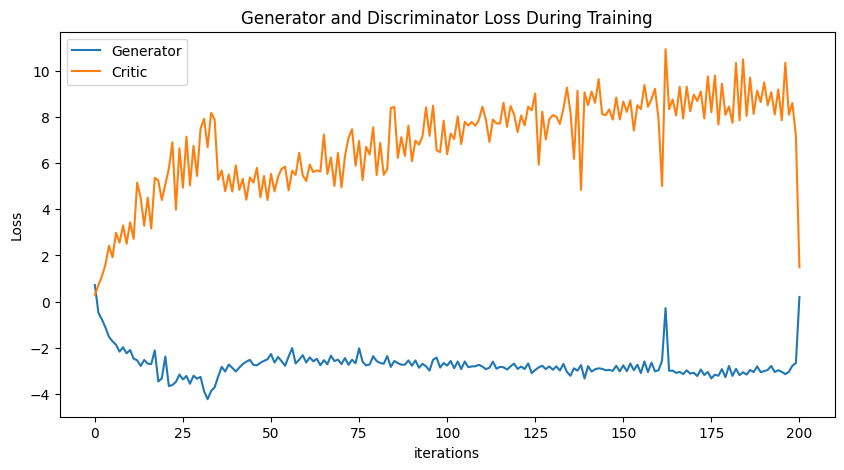

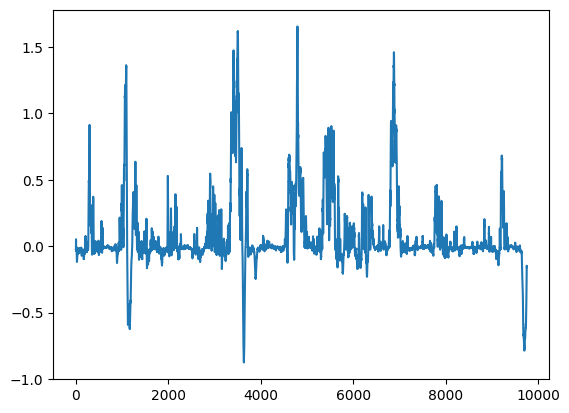

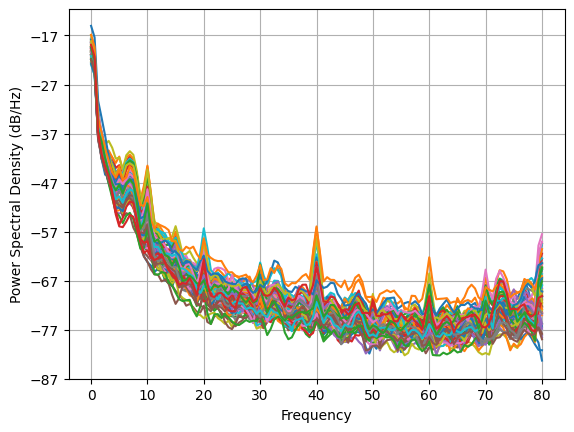

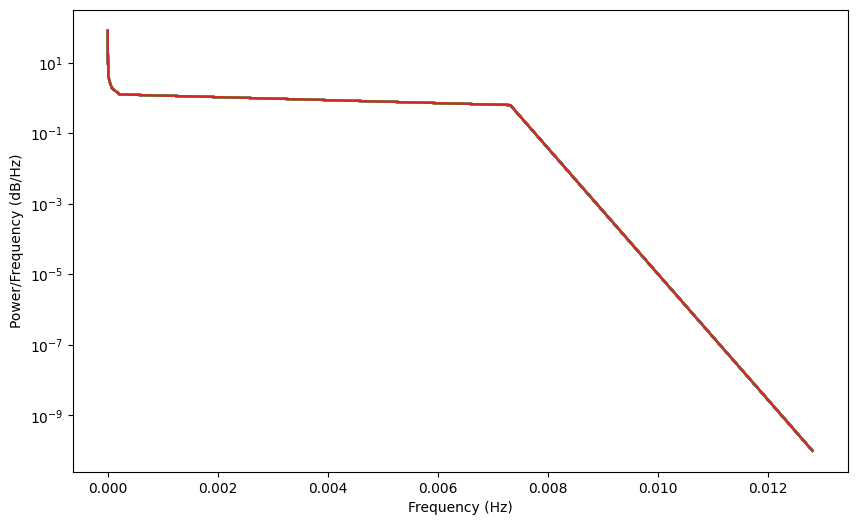

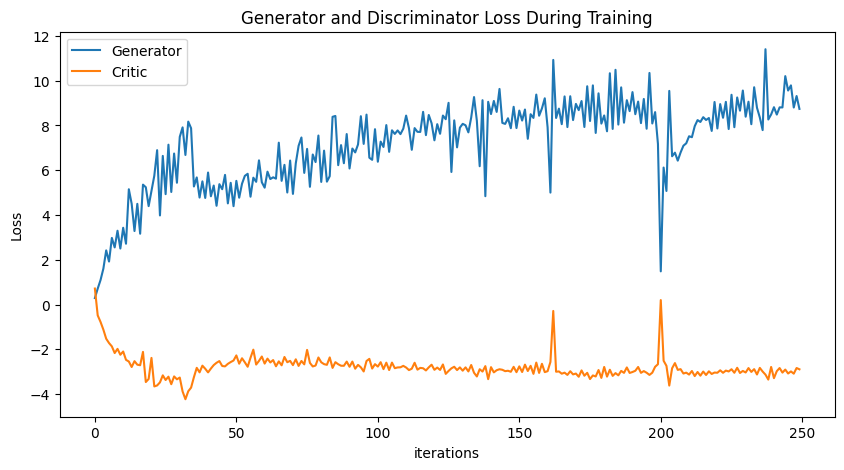

In [10]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        critic_loss = None
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_real = D(real).reshape(-1)
                critic_fake = D(fake).reshape(-1)
                gp = gradient_penalty(D, real, fake)
                critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
                D.zero_grad()
                critic_loss.backward(retain_graph=True)
                critic_optimizer.step()

            generated_data = fake
            gen_fake = D(fake).reshape(-1)
            loss_gen = -torch.mean(gen_fake)
            G.zero_grad()
            loss_gen.backward()
            gen_optimizer.step()


        generated_data = fake
        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_open_normalized_3, disc, gen = train()

torch.save(gen, 'genv3_4_open_norm_3.pt')
torch.save(disc, 'discv3_4_open_norm_3.pt')

plot_everything(generated_data_4_open_normalized_3, gen_err, critic_err)


In [11]:
NUM_EPOCHS = 250
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_closed)[0]

train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_real = D(real).reshape(-1)
                critic_fake = D(fake).reshape(-1)
                gp = gradient_penalty(D, real, fake)
                critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
                D.zero_grad()
                critic_loss.backward(retain_graph=True)
                critic_optimizer.step()

            generated_data = fake
            gen_fake = D(fake).reshape(-1)
            loss_gen = -torch.mean(gen_fake)
            G.zero_grad()
            loss_gen.backward()
            gen_optimizer.step()


        generated_data = fake
        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_4_closed_normalized_3, disc, gen = train()

torch.save(gen, 'genv3_4_closed_norm_3.pt')
torch.save(disc, 'discv3_4_closed_norm_3.pt')

plot_everything(generated_data_4_closed_normalized_3, gen_err, critic_err)


AttributeError: 'NoneType' object has no attribute 'item'